In [1]:
import pandas as pd  
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.optimize as sco
import os
import plotly.graph_objects as go
from itertools import combinations
from sklearn.preprocessing import StandardScaler
from pathlib import Path

scaler = StandardScaler()

desired_path="/k_means_cluster_analysis/Results_without_sentiment/cluster_df_cl3/"

qtfilename="_qt_result.csv"

path = Path(os.getcwd())

dir1=path.parent.parent.parent.parent

final_path=str(dir1)+desired_path

## Efficient Frontier portfolio allocation technique.

In [2]:
def portfolio_annualised_performance(weights, mean_returns, cov_matrix, df_len):
    returns = np.sum(mean_returns*weights ) * df_len
    std = np.sqrt(np.dot(weights.T, np.dot(cov_matrix, weights))) * np.sqrt(df_len)
    return std, returns

def random_portfolios(num_portfolios, mean_returns, cov_matrix, risk_free_rate, stocks_len, df_len):
    results = np.zeros((3,num_portfolios))
    weights_record = []
    for i in range(num_portfolios):
        weights = np.random.random(stocks_len)
        weights /= np.sum(weights)
        weights_record.append(weights)
        portfolio_std_dev, portfolio_return_var = portfolio_annualised_performance(weights, mean_returns, cov_matrix, df_len)
        results[0,i] = portfolio_std_dev
        results[1,i] = portfolio_return_var
        results[2,i] = (portfolio_return_var - risk_free_rate) / portfolio_std_dev
        
    #max_sharpe = max(results[2])
    #for i in range(len(results[2])):
        #if results[2, i] == max_sharpe:
            #print("index {} and weights are {} max sharpe value {}".format(i, weights_record[i], max_sharpe))
            
    return results, weights_record

def pos_sharpe_ratio(weights, mean_returns, cov_matrix, risk_free_rate, df_len):
    p_var, p_ret = portfolio_annualised_performance(weights, mean_returns, cov_matrix, df_len)
    return (p_ret - risk_free_rate) / p_var

def neg_sharpe_ratio(weights, mean_returns, cov_matrix, risk_free_rate, df_len):
    p_var, p_ret = portfolio_annualised_performance(weights, mean_returns, cov_matrix, df_len)
    return -(p_ret - risk_free_rate) / p_var

def max_sharpe_ratio(mean_returns, cov_matrix, risk_free_rate, df_len):
    num_assets = len(mean_returns)
    args = (mean_returns, cov_matrix, risk_free_rate, df_len)
    constraints = ({'type': 'eq', 'fun': lambda x: np.sum(x) - 1})
    bound = (0.0,1.0)
    bounds = tuple(bound for asset in range(num_assets))
    result = sco.minimize(neg_sharpe_ratio, num_assets*[1./num_assets,], args=args,
                        method='SLSQP', bounds=bounds, constraints=constraints)
    return result

def portfolio_volatility(weights, mean_returns, cov_matrix, df_len): 
    return portfolio_annualised_performance(weights, mean_returns, cov_matrix, df_len)[0]

def min_variance(mean_returns, cov_matrix, df_len):
    num_assets = len(mean_returns)
    args = (mean_returns, cov_matrix, df_len)
    constraints = ({'type': 'eq', 'fun': lambda x: np.sum(x) - 1})
    bound = (0.0,1.0)
    bounds = tuple(bound for asset in range(num_assets))

    result = sco.minimize(portfolio_volatility, num_assets*[1./num_assets,], args=args,
                        method='SLSQP', bounds=bounds, constraints=constraints)

    return result

def efficient_return(mean_returns, cov_matrix, target, df_len):
    num_assets = len(mean_returns)
    args = (mean_returns, cov_matrix, df_len)
    
    def portfolio_return(weights, df_len):
        return portfolio_annualised_performance(weights, mean_returns, cov_matrix, df_len)[1]

    constraints = ({'type': 'eq', 'fun': lambda x: portfolio_return(x, df_len) - target},
                   {'type': 'eq', 'fun': lambda x: np.sum(x) - 1})
    bounds = tuple((0,1) for asset in range(num_assets))
    result = sco.minimize(portfolio_volatility, num_assets*[1./num_assets,], args=args, method='SLSQP', bounds=bounds, constraints=constraints)
    return result


def efficient_frontier(mean_returns, cov_matrix, returns_range, df_len):
    efficients = []
    for ret in returns_range:
        efficients.append(efficient_return(mean_returns, cov_matrix, ret, df_len))
    return efficients


def display_calculated_ef_with_random(mean_returns, cov_matrix, num_portfolios, risk_free_rate, table, stocks_len, df_len):
    results, _ = random_portfolios(num_portfolios,mean_returns, cov_matrix, risk_free_rate, stocks_len, df_len)
    #print("results == \n", max(results[2]))
    max_sharpe = max_sharpe_ratio(mean_returns, cov_matrix, risk_free_rate, df_len) 
    pos_sharpe = pos_sharpe_ratio(max_sharpe['x'], mean_returns, cov_matrix, risk_free_rate, df_len)
    #print("pos_sharpe == \n", pos_sharpe)
    
    sdp, rp = portfolio_annualised_performance(max_sharpe['x'], mean_returns, cov_matrix, df_len)
    max_sharpe_allocation = pd.DataFrame(max_sharpe.x,index=table.columns,columns=['allocation'])
    max_sharpe_allocation.allocation = [round(i*100,2)for i in max_sharpe_allocation.allocation]
    max_sharpe_allocation = max_sharpe_allocation.T
    max_sharpe_allocation

    min_vol = min_variance(mean_returns, cov_matrix, df_len)
    sdp_min, rp_min = portfolio_annualised_performance(min_vol['x'], mean_returns, cov_matrix, df_len)
    min_vol_allocation = pd.DataFrame(min_vol.x,index=table.columns,columns=['allocation'])
    min_vol_allocation.allocation = [round(i*100,2)for i in min_vol_allocation.allocation]
    min_vol_allocation = min_vol_allocation.T
    
    print("-"*80)
    print( "Maximum Sharpe Ratio Portfolio Allocation\n")
    print( "Annualised Return:", round(rp,2))
    print( "Annualised Volatility:", round(sdp,2))
    print ("\n")
    print (max_sharpe_allocation)
    print( "-"*80)
    print ("Minimum Volatility Portfolio Allocation\n")
    print( "Annualised Return:", round(rp_min,2))
    print( "Annualised Volatility:", round(sdp_min,2))
    print ("\n")
    print (min_vol_allocation)
    
    plt.figure(figsize=(10, 7))
    plt.scatter(results[0,:],results[1,:],c=results[2,:],cmap='YlGnBu', marker='o', s=10, alpha=0.3)
    plt.colorbar()
    plt.scatter(sdp,rp,marker='*',color='r',s=500, label='Maximum Sharpe ratio')
    plt.scatter(sdp_min,rp_min,marker='*',color='g',s=500, label='Minimum volatility')

    target = np.linspace(rp_min, 0.32, 50)
    efficient_portfolios = efficient_frontier(mean_returns, cov_matrix, target, df_len)
    plt.plot([p['fun'] for p in efficient_portfolios], target, linestyle='-.', color='black', label='efficient frontier')
    plt.title('Calculated Portfolio Optimization based on Efficient Frontier')
    plt.xlabel('annualised volatility')
    plt.ylabel('annualised returns')
    plt.legend(labelspacing=0.8)
    plt.show()
    return (pos_sharpe, round(rp,2), round(sdp,2), max_sharpe_allocation.values)


def display_ef_with_selected(mean_returns, cov_matrix, risk_free_rate,table, df_len):
    returns = table.pct_change()
    max_sharpe = max_sharpe_ratio(mean_returns, cov_matrix, risk_free_rate, df_len)
    #print("Max Sharpe ==\n", max_sharpe)
    sdp, rp = portfolio_annualised_performance(max_sharpe['x'], mean_returns, cov_matrix, df_len)
    max_sharpe_allocation = pd.DataFrame(max_sharpe.x,index=table.columns,columns=['allocation'])
    max_sharpe_allocation.allocation = [round(i*100,2)for i in max_sharpe_allocation.allocation]
    max_sharpe_allocation = max_sharpe_allocation.T
    max_sharpe_allocation
    

    min_vol = min_variance(mean_returns, cov_matrix, df_len)
    sdp_min, rp_min = portfolio_annualised_performance(min_vol['x'], mean_returns, cov_matrix, df_len)
    min_vol_allocation = pd.DataFrame(min_vol.x,index=table.columns,columns=['allocation'])
    min_vol_allocation.allocation = [round(i*100,2)for i in min_vol_allocation.allocation]
    min_vol_allocation = min_vol_allocation.T
    
    an_vol = np.std(returns) * np.sqrt(df_len)
    an_rt = mean_returns * df_len
    
    print ("-"*80)
    print ("Individual Stock Returns and Volatility\n")
    for i, txt in enumerate(table.columns):
        print (txt,":","annuaised return",round(an_rt[i],2),", annualised volatility:",round(an_vol[i],2))
    print ("-"*80)
    
    fig, ax = plt.subplots(figsize=(10, 7))
    ax.scatter(an_vol,an_rt,marker='o',s=200)

    for i, txt in enumerate(table.columns):
        ax.annotate(txt, (an_vol[i],an_rt[i]), xytext=(10,0), textcoords='offset points')
    ax.scatter(sdp,rp,marker='*',color='r',s=500, label='Maximum Sharpe ratio')
    ax.scatter(sdp_min,rp_min,marker='*',color='g',s=500, label='Minimum volatility')

    target = np.linspace(rp_min, 0.34, 50)
    efficient_portfolios = efficient_frontier(mean_returns, cov_matrix, target, df_len)
    ax.plot([p['fun'] for p in efficient_portfolios], target, linestyle='-.', color='black', label='efficient frontier')
    ax.set_title('Portfolio Optimization with Individual Stocks')
    ax.set_xlabel('annualised volatility')
    ax.set_ylabel('annualised returns')
    ax.legend(labelspacing=0.8)
    plt.show()

# display_calculated_ef_with_random(mean_returns, cov_matrix, num_portfolios, risk_free_rate)
# call this for different portfolios
# display_ef_with_selected(mean_returns, cov_matrix, risk_free_rate)
# call this for the companies selected for the portfolio

def efficient_frontier_stock_portfolio(stocks, stocks_len, risk_free_rate_in, start_date, end_date):
    data_temp = pd.read_csv('../../../../../Data-Acquisition/ohlcv-data/ohlcv.csv') 
    #print(data_temp)
    data_temp["time"] = pd.to_datetime(data_temp.time, format='%d/%m/%Y')
    start_date = pd.to_datetime(start_date)
    end_date = pd.to_datetime(end_date)
    data = data_temp[(data_temp["time"] >= start_date) & (data_temp["time"]< end_date)]
    #print(data)
    data["time"] = pd.to_datetime(data.time, format='%d/%m/%Y')
    data = data[['time','adjusted_close', 'symbol']]
    data = data.rename(columns={'time': 'date', 'adjusted_close': 'adj_close', 'symbol': 'ticker'})
    data = data[data['ticker'].isin(stocks)]
    #print(data)
    df_len = len(data.groupby("date"))
    #print("\nShape of the df {}, df len {}".format(df_len,data.shape))

    df = data.set_index('date')
    table = df.pivot(columns='ticker')
    # By specifying col[1] in below list comprehension
    # You can select the stock names under multi-level column
    table.columns = [col[1] for col in table.columns]
    table.head()

    plt.figure(figsize=(16, 9))
    for c in table.columns.values:
        plt.plot(table.index, table[c], lw=2, alpha=0.8,label=c)
    plt.legend(loc='upper right', fontsize=12)
    plt.ylabel('price in $')
    plt.title('Stocks Closing price in $')
    plt.show()

    returns = table.pct_change()
    plt.figure(figsize=(14, 7))
    for c in returns.columns.values:
        plt.plot(returns.index, returns[c], lw=3, alpha=0.8,label=c)
    plt.legend(loc='upper left', fontsize=12)
    plt.ylabel('daily returns')
    plt.title('Stocks Closing daily returns variation')
    plt.show()
    
    returns = table.pct_change()
    mean_returns = returns.mean()
    cov_matrix = returns.cov()
    num_portfolios = 25000
    risk_free_rate = 0.0095
    

    pos_sharpe, Annualised_Return, Annualised_Volatility, allocation_weights = display_calculated_ef_with_random(mean_returns, cov_matrix, num_portfolios, risk_free_rate, table, stocks_len, df_len)
    display_ef_with_selected(mean_returns, cov_matrix, risk_free_rate, table, df_len)
    
    return (pos_sharpe, Annualised_Return, Annualised_Volatility, allocation_weights)

In [3]:
def check_cor_cov_relation(covariance, correlation, mean_covariance, stocks):
    paired_stocks = np.zeros(covariance.shape)

    for i in range(len(stocks)):
        for j in range(len(stocks)-i):
            if(covariance[i,j] > mean_covariance[i] or covariance[i,j] > mean_covariance[j] or correlation[i][j]>0.5):
                paired_stocks[i,j] = 0
            else:
                paired_stocks[i,j] = 1

    return paired_stocks

In [4]:
def stocks_pair_lookup(stockspair, stocks_range_values, paired_stocks):
    nostockspair = []
    for i in stocks_range_values:
        if(i not in stockspair):
            nostockspair.append(i)
        else:
            continue
            
    for stock_ticker in nostockspair:
        cummulative_stockpair = len(stockspair)
        for i in stockspair:
            if(paired_stocks[stock_ticker,i]!=1 or paired_stocks[i,stock_ticker]!=1):
                cummulative_stockpair -= 1
        if(float(cummulative_stockpair)/len(stockspair) > 0.5):
            stockspair.add(stock_ticker)              
    return stockspair

In [5]:
def make_company_portfolios(stocks_combination, stocks_range, paired_stocks, portfolio_collection):  
    stockpair = set(stocks_combination)
    stockpair = stocks_pair_lookup(stockpair, stocks_range, paired_stocks)
    if stockpair not in portfolio_collection:
        portfolio_collection.append(stockpair)
    return portfolio_collection

In [6]:
def generate_portfolio_pairs(stocks):
    print(stocks)
    data = pd.read_csv('../../../../../Data-Acquisition/ohlcv-data/ohlcv.csv')  
    data["time"] = pd.to_datetime(data.time, format='%d/%m/%Y')
    data = data[['time','adjusted_close', 'symbol']]
    data = data.rename(columns={'time': 'date', 'adjusted_close': 'adj_close', 'symbol': 'ticker'})
    data = data[data['ticker'].isin(stocks)]

    df = data.set_index('date')
    table = df.pivot(columns='ticker')
    # By specifying col[1] in below list comprehension
    # You can select the stock names under multi-level column
    table.columns = [col[1] for col in table.columns]
    
    returns = table.pct_change()
    mean_returns = returns.mean()
    cov_matrix = returns.cov()
    correlation_matrix = returns.corr()
    np.round(correlation_matrix,3)
    mean_covariance = cov_matrix.mean()

    paired_stocks = check_cor_cov_relation(np.array(cov_matrix), np.array(correlation_matrix), mean_covariance, stocks)
    
    return paired_stocks

In [7]:
def get_portfolio_pairs(stocks):
    paired_stocks = generate_portfolio_pairs(stocks)
    stocks_range_values = range(len(stocks))
    count=0
    port_list = list(combinations(stocks_range_values,2))
    portfolio_collection = []
    for stocks_combination in port_list:
        count +=1
        if(paired_stocks[stocks_combination[0],stocks_combination[1]]!=1 or paired_stocks[stocks_combination[1],stocks_combination[0]]!=1):
            continue
        else:
            portfolio_collection = make_company_portfolios(stocks_combination, stocks_range_values, paired_stocks, portfolio_collection)

    company_name = []
    for i in portfolio_collection:
        company_name_list =[]
        for j in i:
            company_name_list.append(stocks[j])
        company_name.append(company_name_list)
    
        #print(company_name)
    
    return company_name

In [8]:
new_df = pd.DataFrame(columns=["symbol", "start_date", "sector"])
for i in range (1,9):
        df_read = pd.read_csv(final_path+str(i)+qtfilename)
        df_roc = df_read.groupby("label")["EMA"].max().reset_index()
        df_companies = pd.merge(left=df_roc, right=df_read, left_on='EMA', right_on='EMA').drop(["label_x"], axis=1)
        potential_comp = df_companies[["symbol", "start_date", "sector"]]
        new_df = new_df.append(potential_comp, ignore_index="true")

new_df.sort_values("start_date").to_csv("ohlcnews_stocks_subset1.csv")

In [9]:
new_df = pd.DataFrame(columns=["symbol", "start_date", "sector"])
for i in range (1,9):
        df_read = pd.read_csv(final_path+str(i)+qtfilename)
        df_roc = df_read.groupby("label")["ROC"].max().reset_index()
        df_companies = pd.merge(left=df_roc, right=df_read, left_on='ROC', right_on='ROC').drop(["label_x"], axis=1)
        potential_comp = df_companies[["symbol", "start_date", "sector"]]
        new_df = new_df.append(potential_comp, ignore_index="true")

new_df.sort_values("start_date").to_csv("ohlcnews_stocks_subset2.csv")

In [10]:
new_df = pd.DataFrame(columns=["symbol", "start_date", "sector"])
for i in range (1,9):
        df_read = pd.read_csv(final_path+str(i)+qtfilename)
        df_read = df_read[(df_read["RSI"] >= 30) | (df_read["RSI"] <= 70)]
        df_read = df_read[df_read["ROC"] > 0]
        df_roc = df_read.groupby("label")["ROC"].max().reset_index()
        df_companies = pd.merge(left=df_roc, right=df_read, left_on='ROC', right_on='ROC').drop(["label_x"], axis=1)
        potential_comp = df_companies[["symbol", "start_date", "sector"]]
        new_df = new_df.append(potential_comp, ignore_index="true")

new_df.sort_values("start_date").to_csv("ohlcnews_stocks_subset3.csv")

In [11]:
new_df = pd.DataFrame(columns=["symbol", "start_date", "sector"])
for i in range (1,9):
        df_read = pd.read_csv(final_path+str(i)+qtfilename)
        df_read = df_read[(df_read["RSI"] >= 30) | (df_read["RSI"] <= 70)]
        df_read = df_read[df_read["ROC"] > 0]
        df_roc = df_read.groupby("label")["EMA"].max().reset_index()
        #Inner join on the values to identify the stock with max EMA for the cluster.
        df_companies = pd.merge(left=df_roc, right=df_read, left_on='EMA', right_on='EMA').drop(["label_x"], axis=1)
        potential_comp = df_companies[["symbol", "start_date", "sector"]]
        new_df = new_df.append(potential_comp, ignore_index="true")

new_df.sort_values("start_date").to_csv("ohlcnews_stocks_subset4.csv")

In [12]:
new_df = pd.DataFrame(columns=["symbol", "start_date", "sector"])
for i in range (1,9):
        df_read = pd.read_csv(final_path+str(i)+qtfilename)
        df_read = df_read[(df_read["RSI"] >= 30) | (df_read["RSI"] <= 70)]
        #having a +ve ROC ensures "risk" of losing out on profit is taken into consideration.
        df_read = df_read[df_read["ROC"] > 0]
        #higher value of ATR says that the volitility is more.
        #high value of the ATR and positive ROC indicates that the stock is on increasing trend and also return can be higher.
        df_roc = df_read.groupby("label")["ATR"].max().reset_index()
        #Inner join on the values to identify the stock with max EMA for the cluster.
        df_companies = pd.merge(left=df_roc, right=df_read, left_on='ATR', right_on='ATR').drop(["label_x"], axis=1)
        potential_comp = df_companies[["symbol", "start_date", "sector"]]
        new_df = new_df.append(potential_comp, ignore_index="true")

new_df.sort_values("start_date").to_csv("ohlcnews_stocks_subset5.csv")

In [13]:
new_df = pd.DataFrame(columns=["symbol", "start_date", "sector"])
for i in range (1,9):
        df_read = pd.read_csv(final_path+str(i)+qtfilename)
        #combine all the stocks taken into a dataframe and take the unique set from it to arrive 
        #at your stock portfolio.
        new_df = new_df.append(df_read, ignore_index="true")
        
portfolio_list = new_df["symbol"].unique()
print("These are the best stocks to be from among the 200 companies for the 2 year period data")
print("using the linear methods of stock portfolio creation:")
print(portfolio_list)

These are the best stocks to be from among the 200 companies for the 2 year period data
using the linear methods of stock portfolio creation:
['EQIX' 'AMZN' 'AZO' 'CMG' 'BKNG' 'SHW' 'BIIB' 'BLK' 'BA' 'BDX' 'ADSK'
 'AMD' 'BHF' 'NEM' 'COTY' 'APC' 'CSX' 'DHI' 'GOOGL' 'DVN' 'CTXS' 'ALLE'
 'GOOG' 'BXP']


/home/abhishek/anaconda3/anaconda/lib/python3.7/site-packages/pandas/core/frame.py:7138: FutureWarning:

Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.




In [14]:
quarter_list=["2018-04-01", "2018-07-01", "2018-10-01", "2019-01-01", "2019-04-01", "2019-07-01", "2019-10-01", "2020-01-01", "2020-04-01"]

for idx in range(1, len(quarter_list)):
    df_quarter_data = new_df[(new_df["start_date"] >= quarter_list[idx-1]) & (new_df["start_date"]< quarter_list[idx])]
    print("Companies listed in quarter {} which is between {} and {}".format(idx, quarter_list[idx-1], quarter_list[idx]))
    list_of_companies = df_quarter_data["symbol"].unique()
    df_read = pd.read_csv(final_path+str(idx)+qtfilename)
    df_unscaled = df_read.copy()
    df_unscaled_required = df_unscaled[["RSI", "ROC", "ADOSC", "ATR", "EMA", "Sharpe_ratio"]]
    df_read_scaled = pd.DataFrame(scaler.fit_transform(df_unscaled_required))
    df_read_scaled.columns = list(df_unscaled_required)
    df_read_scaled["symbol"] = df_unscaled["symbol"]
    rsi_list = []
    roc_list = []
    adosc_list = []
    atr_list = []
    ema_list = []
    sharpe_list = []
    avgret_list = []
    wt_senti_list = []
    for comp in list_of_companies:
        df_comp = df_read_scaled[df_read_scaled["symbol"] == comp]
        rsi_list.append(df_comp["RSI"].values[0])
        roc_list.append(df_comp["ROC"].values[0])
        adosc_list.append(df_comp["ADOSC"].values[0])
        atr_list.append(df_comp["ATR"].values[0])
        ema_list.append(df_comp["EMA"].values[0])
        sharpe_list.append(df_comp["Sharpe_ratio"].values[0])
    
    fig = go.Figure(data=[
        go.Bar(name='RSI', x=list_of_companies, y=rsi_list),
        go.Bar(name='ROC', x=list_of_companies, y=roc_list),
        go.Bar(name='ADOSC', x=list_of_companies, y=adosc_list),
        go.Bar(name='ATR', x=list_of_companies, y=atr_list),
        go.Bar(name='EMA', x=list_of_companies, y=ema_list),
        go.Bar(name='Sharpe_ratio', x=list_of_companies, y=sharpe_list)
    ])
    fig.update_layout(
    barmode='group',
    title="Feature distribution for the comapnies selected in the quarter",
    xaxis_title="Company names",
    yaxis_title="Scaled values of the features",
    font=dict(
        family="Courier New, monospace",
        size=12,
        color="#7f7f7f"
    ))
        
    fig.show()

Companies listed in quarter 1 which is between 2018-04-01 and 2018-07-01


Companies listed in quarter 2 which is between 2018-07-01 and 2018-10-01


Companies listed in quarter 3 which is between 2018-10-01 and 2019-01-01


Companies listed in quarter 4 which is between 2019-01-01 and 2019-04-01


Companies listed in quarter 5 which is between 2019-04-01 and 2019-07-01


Companies listed in quarter 6 which is between 2019-07-01 and 2019-10-01


Companies listed in quarter 7 which is between 2019-10-01 and 2020-01-01


Companies listed in quarter 8 which is between 2020-01-01 and 2020-04-01


Companies listed in quarter 1 which is between 2018-04-01 and 2018-07-01
['EQIX' 'AMZN' 'AZO' 'BLK' 'BKNG' 'ADSK' 'AMD']
perform efficient_frontier_stock_portfolio Pairs of the companies we got ['EQIX', 'BLK']


/home/abhishek/anaconda3/anaconda/lib/python3.7/site-packages/ipykernel_launcher.py:184: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/home/abhishek/anaconda3/anaconda/lib/python3.7/site-packages/pandas/plotting/_matplotlib/converter.py:103: FutureWarning:

Using an implicitly registered datetime converter for a matplotlib plotting method. The converter was registered by pandas on import. Future versions of pandas will require you to explicitly register matplotlib converters.

To register the converters:
	>>> from pandas.plotting import register_matplotlib_converters
	>>> register_matplotlib_converters()



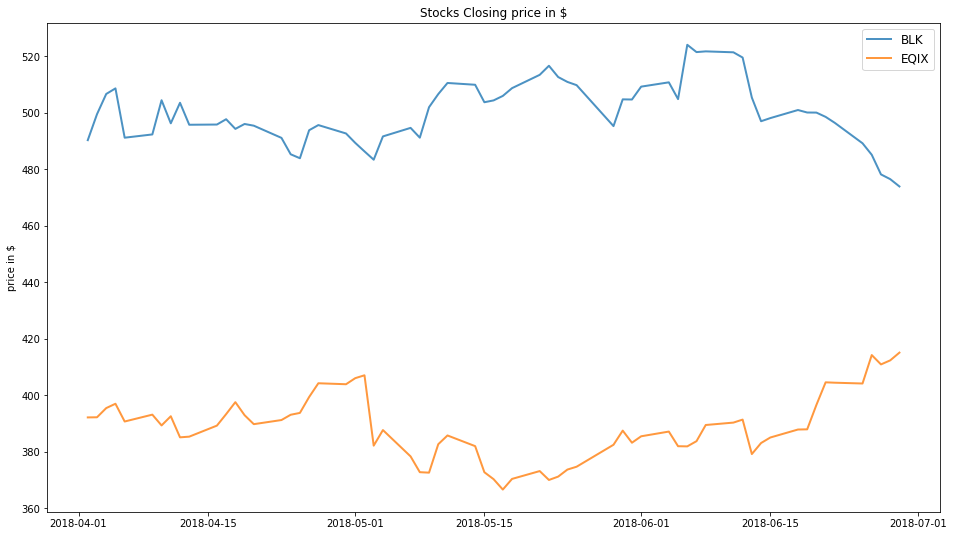

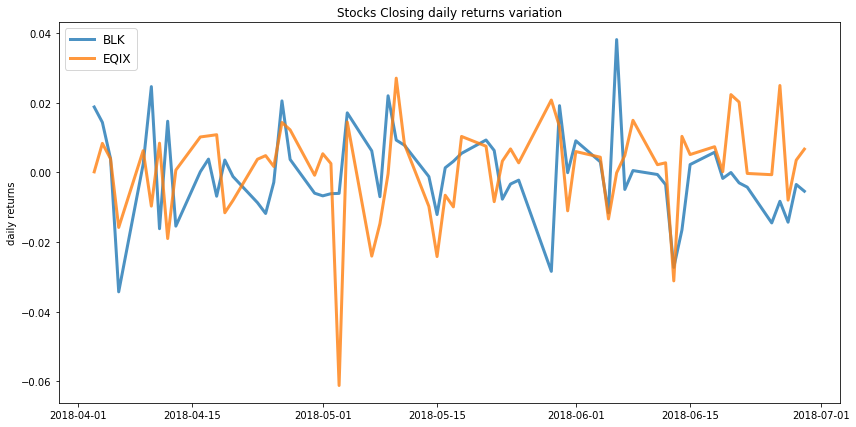

--------------------------------------------------------------------------------
Maximum Sharpe Ratio Portfolio Allocation

Annualised Return: 0.06
Annualised Volatility: 0.11


            BLK   EQIX
allocation  0.0  100.0
--------------------------------------------------------------------------------
Minimum Volatility Portfolio Allocation

Annualised Return: 0.01
Annualised Volatility: 0.08


              BLK   EQIX
allocation  56.99  43.01


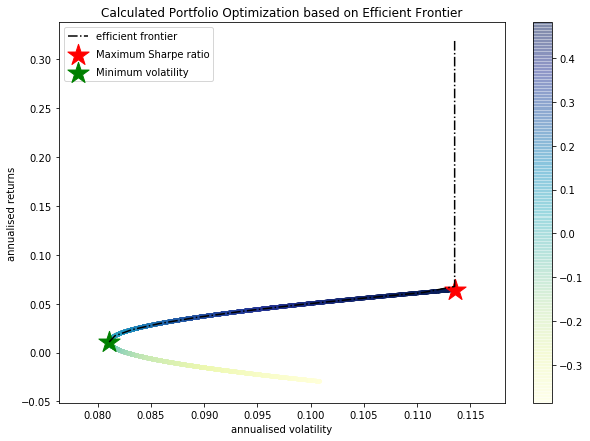

--------------------------------------------------------------------------------
Individual Stock Returns and Volatility

BLK : annuaised return -0.03 , annualised volatility: 0.1
EQIX : annuaised return 0.06 , annualised volatility: 0.11
--------------------------------------------------------------------------------


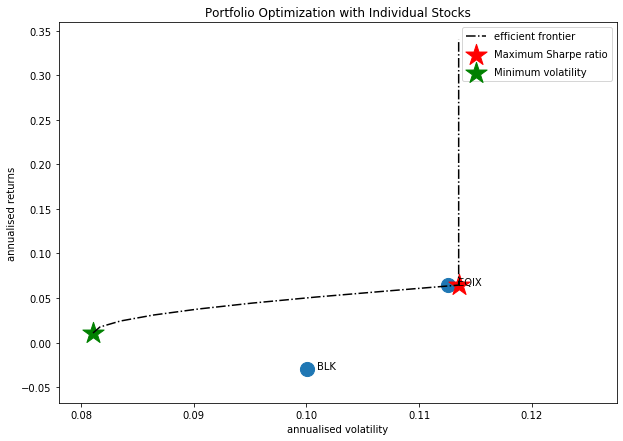

perform efficient_frontier_stock_portfolio Pairs of the companies we got ['EQIX', 'AMD']


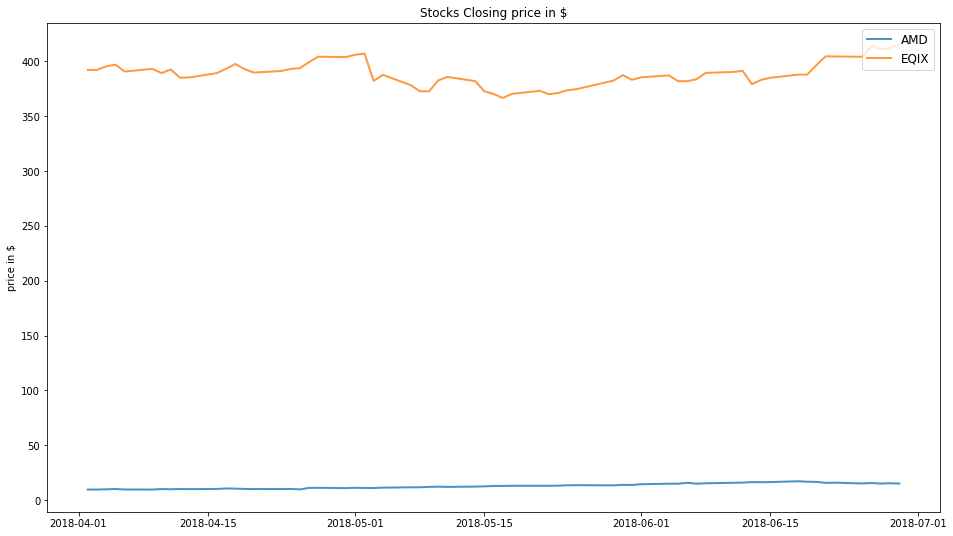

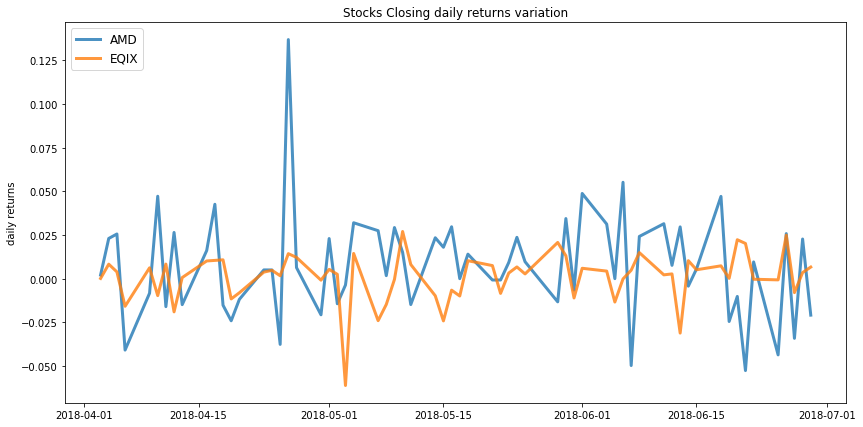

--------------------------------------------------------------------------------
Maximum Sharpe Ratio Portfolio Allocation

Annualised Return: 0.38
Annualised Volatility: 0.18


              AMD   EQIX
allocation  73.06  26.94
--------------------------------------------------------------------------------
Minimum Volatility Portfolio Allocation

Annualised Return: 0.13
Annualised Volatility: 0.11


             AMD  EQIX
allocation  16.3  83.7


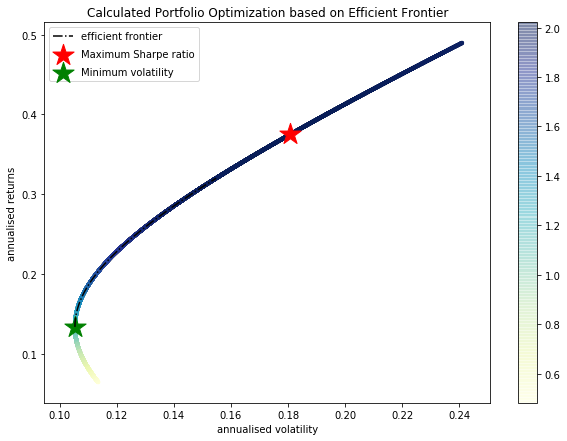

--------------------------------------------------------------------------------
Individual Stock Returns and Volatility

AMD : annuaised return 0.49 , annualised volatility: 0.24
EQIX : annuaised return 0.06 , annualised volatility: 0.11
--------------------------------------------------------------------------------


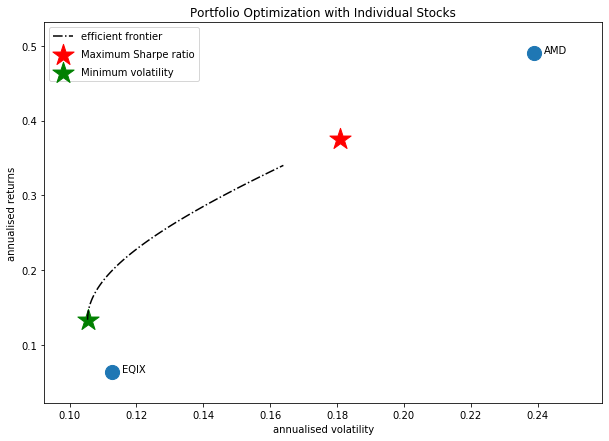

perform efficient_frontier_stock_portfolio Pairs of the companies we got ['AZO', 'BLK']


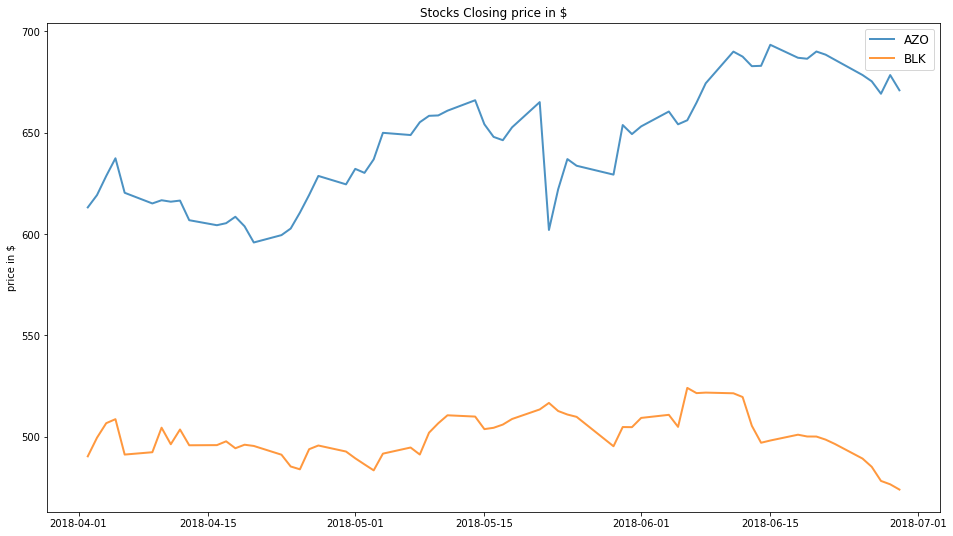

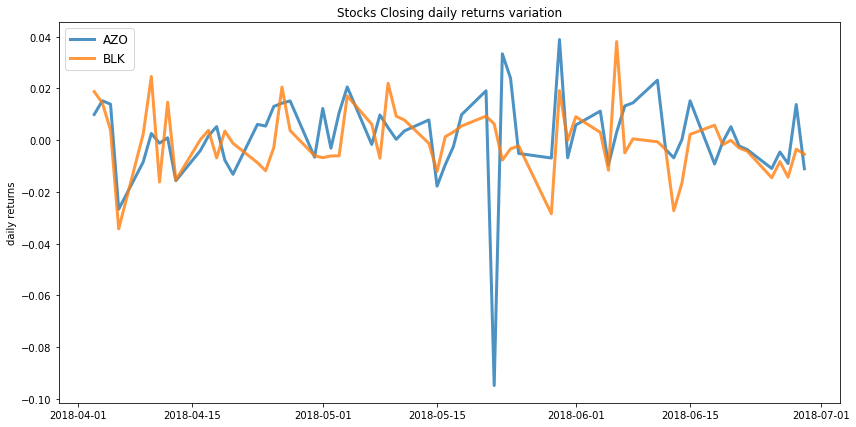

--------------------------------------------------------------------------------
Maximum Sharpe Ratio Portfolio Allocation

Annualised Return: 0.1
Annualised Volatility: 0.14


              AZO  BLK
allocation  100.0  0.0
--------------------------------------------------------------------------------
Minimum Volatility Portfolio Allocation

Annualised Return: 0.01
Annualised Volatility: 0.09


              AZO    BLK
allocation  29.74  70.26


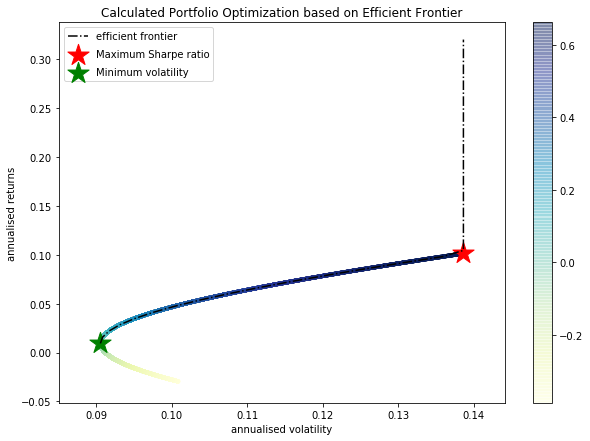

--------------------------------------------------------------------------------
Individual Stock Returns and Volatility

AZO : annuaised return 0.1 , annualised volatility: 0.14
BLK : annuaised return -0.03 , annualised volatility: 0.1
--------------------------------------------------------------------------------


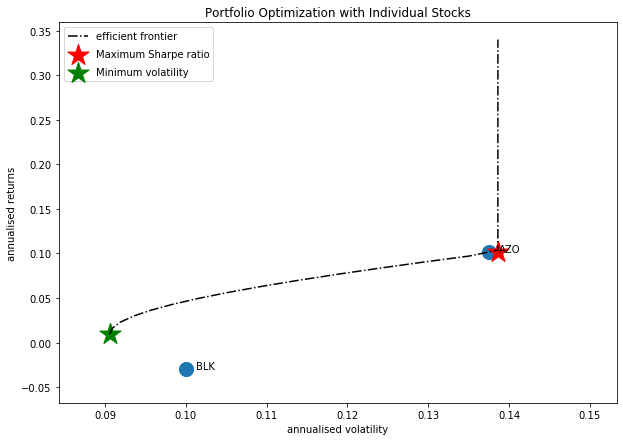

Companies listed in quarter 2 which is between 2018-07-01 and 2018-10-01
['AMZN' 'AZO' 'CMG' 'BKNG' 'BLK' 'AMD' 'BHF']
perform efficient_frontier_stock_portfolio Pairs of the companies we got ['AMZN', 'CMG']


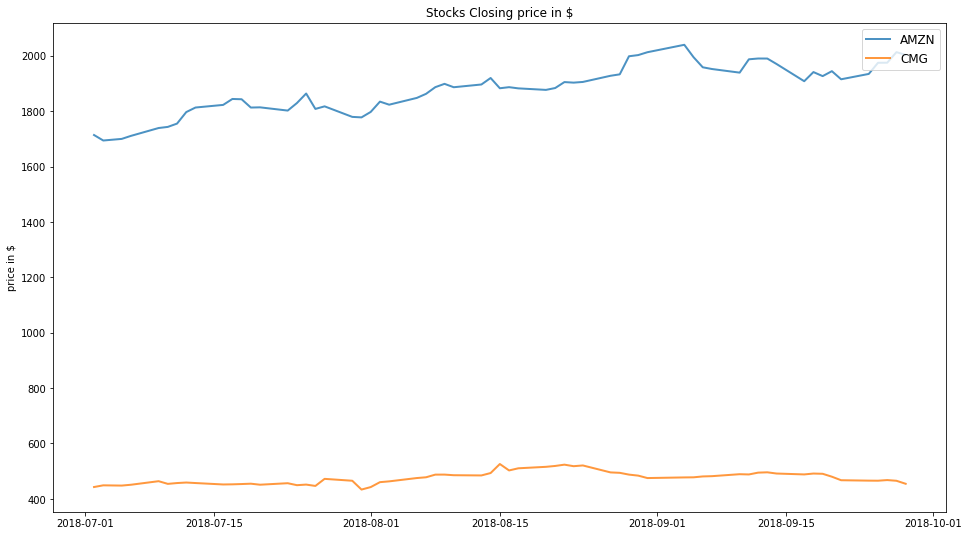

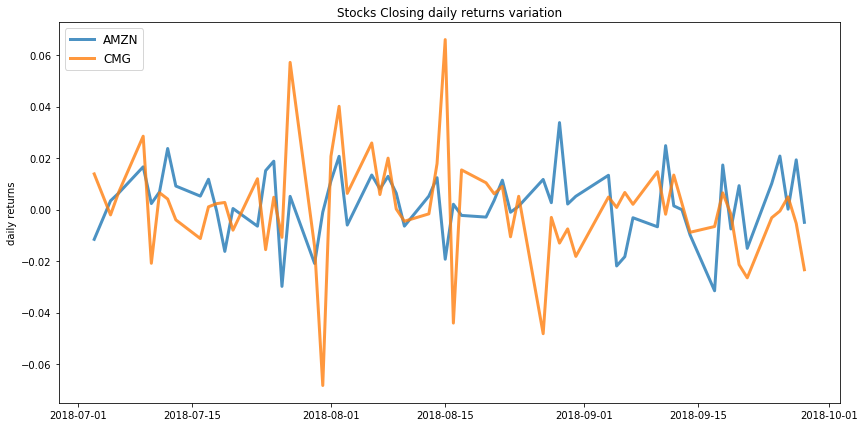

--------------------------------------------------------------------------------
Maximum Sharpe Ratio Portfolio Allocation

Annualised Return: 0.16
Annualised Volatility: 0.1


             AMZN   CMG
allocation  95.51  4.49
--------------------------------------------------------------------------------
Minimum Volatility Portfolio Allocation

Annualised Return: 0.13
Annualised Volatility: 0.09


             AMZN    CMG
allocation  72.24  27.76


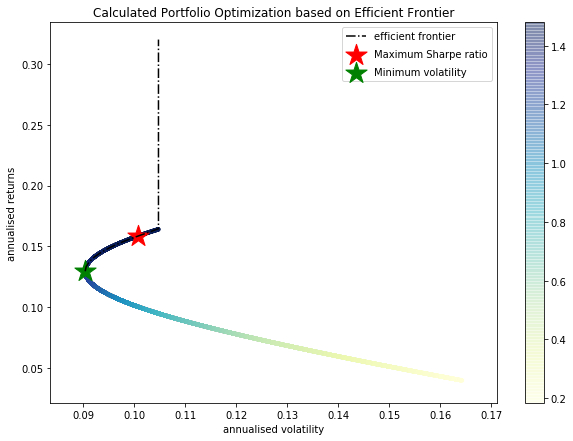

--------------------------------------------------------------------------------
Individual Stock Returns and Volatility

AMZN : annuaised return 0.16 , annualised volatility: 0.1
CMG : annuaised return 0.04 , annualised volatility: 0.16
--------------------------------------------------------------------------------


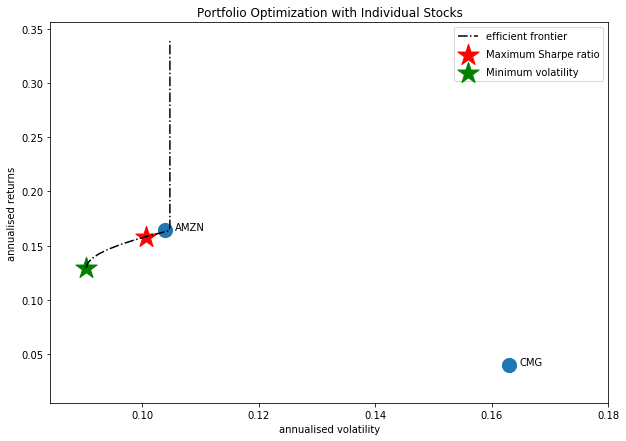

perform efficient_frontier_stock_portfolio Pairs of the companies we got ['AZO', 'CMG']


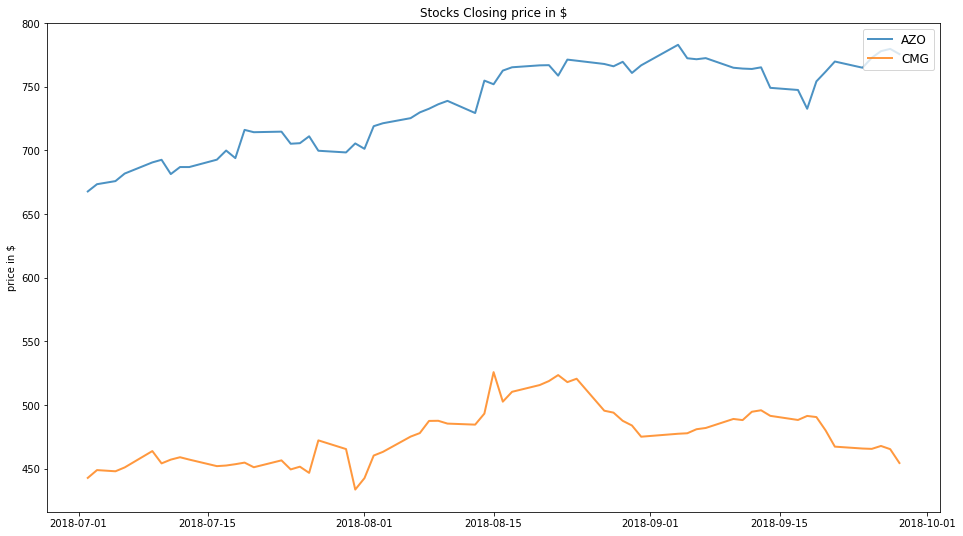

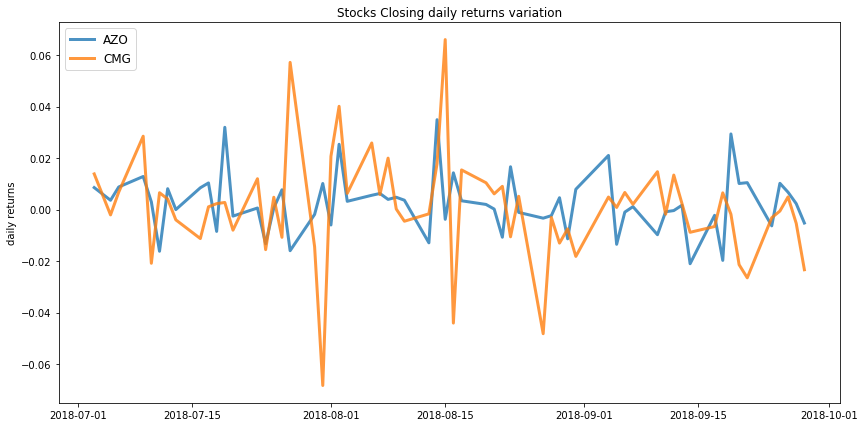

--------------------------------------------------------------------------------
Maximum Sharpe Ratio Portfolio Allocation

Annualised Return: 0.15
Annualised Volatility: 0.08


              AZO   CMG
allocation  91.62  8.38
--------------------------------------------------------------------------------
Minimum Volatility Portfolio Allocation

Annualised Return: 0.13
Annualised Volatility: 0.08


             AZO   CMG
allocation  75.2  24.8


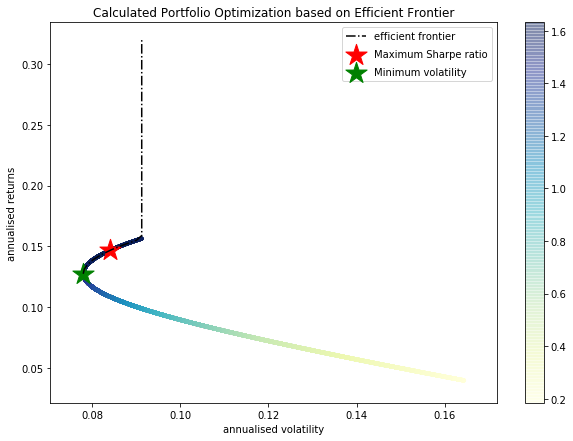

--------------------------------------------------------------------------------
Individual Stock Returns and Volatility

AZO : annuaised return 0.16 , annualised volatility: 0.09
CMG : annuaised return 0.04 , annualised volatility: 0.16
--------------------------------------------------------------------------------


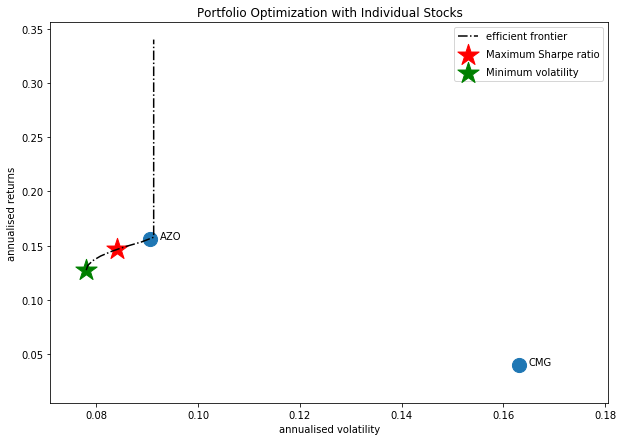

perform efficient_frontier_stock_portfolio Pairs of the companies we got ['CMG', 'BLK']


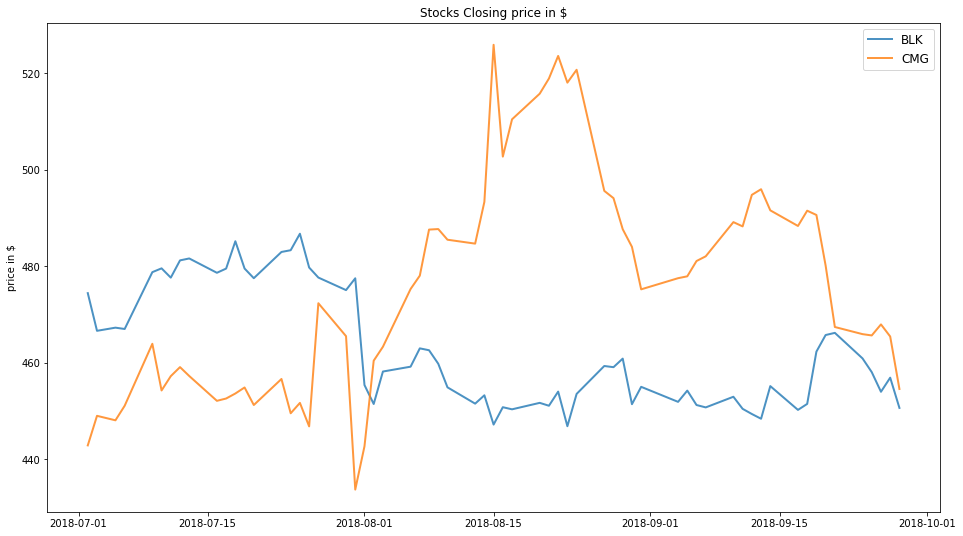

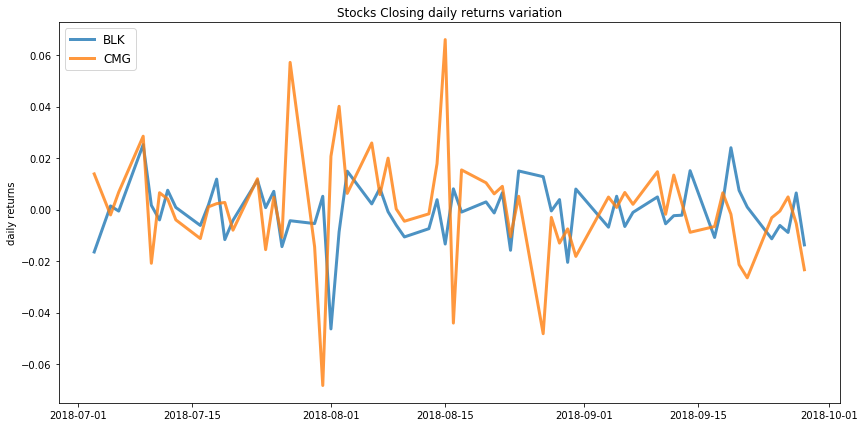

--------------------------------------------------------------------------------
Maximum Sharpe Ratio Portfolio Allocation

Annualised Return: 0.04
Annualised Volatility: 0.16


            BLK    CMG
allocation  0.0  100.0
--------------------------------------------------------------------------------
Minimum Volatility Portfolio Allocation

Annualised Return: -0.03
Annualised Volatility: 0.07


              BLK    CMG
allocation  74.34  25.66


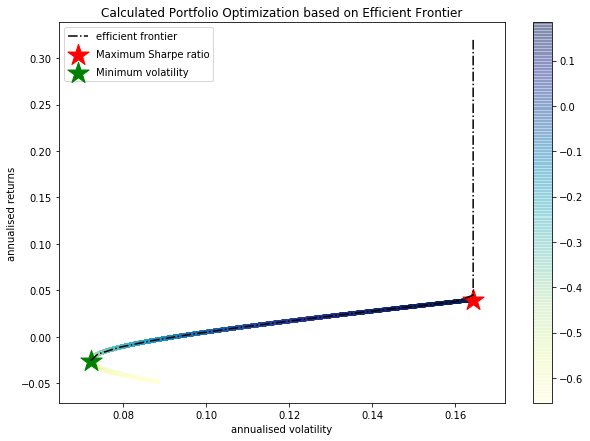

--------------------------------------------------------------------------------
Individual Stock Returns and Volatility

BLK : annuaised return -0.05 , annualised volatility: 0.09
CMG : annuaised return 0.04 , annualised volatility: 0.16
--------------------------------------------------------------------------------


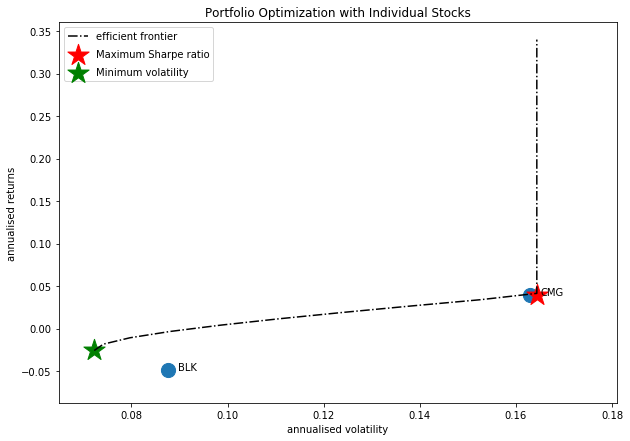

Companies listed in quarter 3 which is between 2018-10-01 and 2019-01-01
['AZO' 'BLK' 'BKNG' 'NEM' 'ALLE' 'GOOG']
perform efficient_frontier_stock_portfolio Pairs of the companies we got ['AZO', 'GOOG']


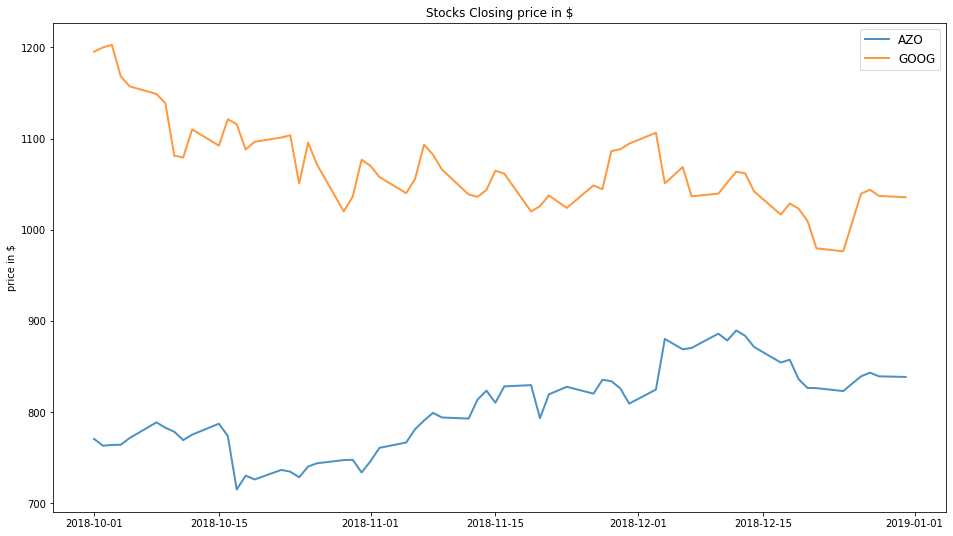

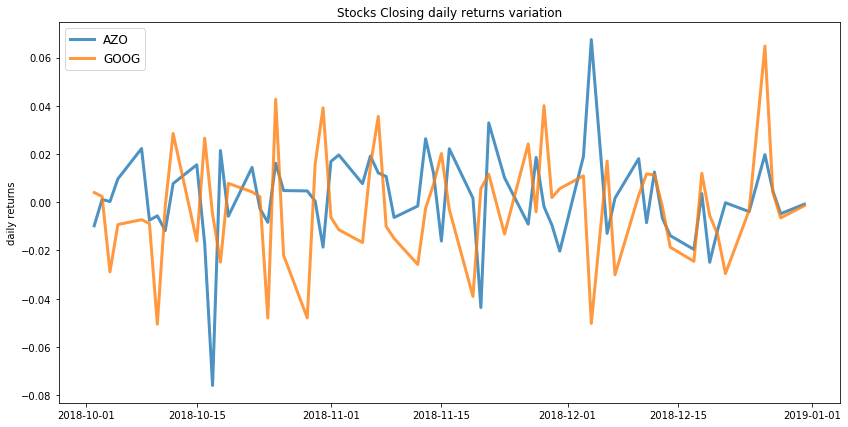

--------------------------------------------------------------------------------
Maximum Sharpe Ratio Portfolio Allocation

Annualised Return: 0.1
Annualised Volatility: 0.15


              AZO  GOOG
allocation  100.0   0.0
--------------------------------------------------------------------------------
Minimum Volatility Portfolio Allocation

Annualised Return: 0.0
Annualised Volatility: 0.11


              AZO   GOOG
allocation  58.06  41.94


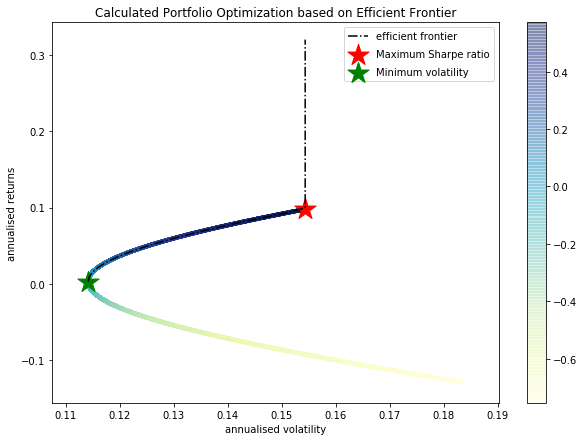

--------------------------------------------------------------------------------
Individual Stock Returns and Volatility

AZO : annuaised return 0.1 , annualised volatility: 0.15
GOOG : annuaised return -0.13 , annualised volatility: 0.18
--------------------------------------------------------------------------------


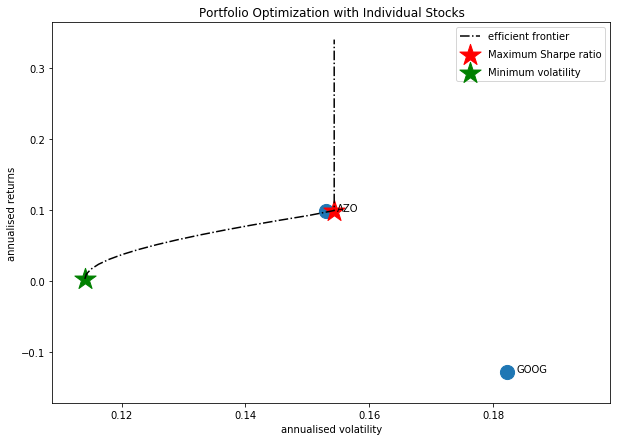

perform efficient_frontier_stock_portfolio Pairs of the companies we got ['BLK', 'BKNG']


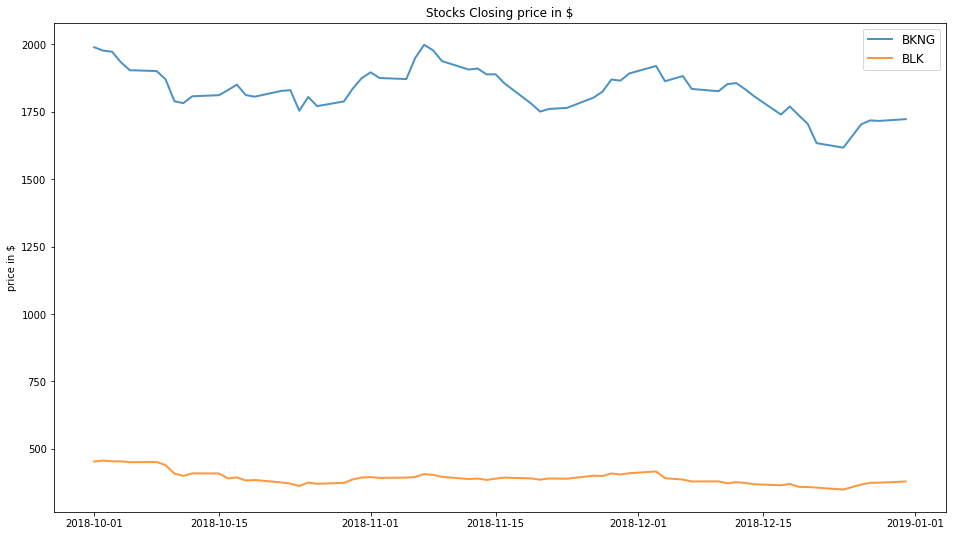

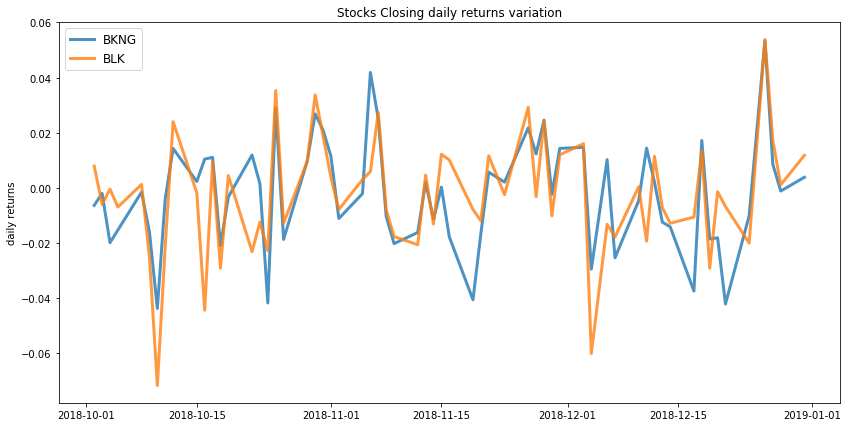

--------------------------------------------------------------------------------
Maximum Sharpe Ratio Portfolio Allocation

Annualised Return: -0.13
Annualised Volatility: 0.16


             BKNG  BLK
allocation  100.0  0.0
--------------------------------------------------------------------------------
Minimum Volatility Portfolio Allocation

Annualised Return: -0.15
Annualised Volatility: 0.15


             BKNG    BLK
allocation  59.55  40.45


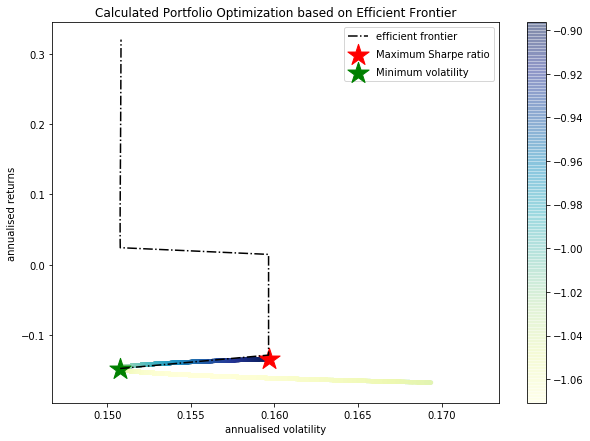

--------------------------------------------------------------------------------
Individual Stock Returns and Volatility

BKNG : annuaised return -0.13 , annualised volatility: 0.16
BLK : annuaised return -0.17 , annualised volatility: 0.17
--------------------------------------------------------------------------------


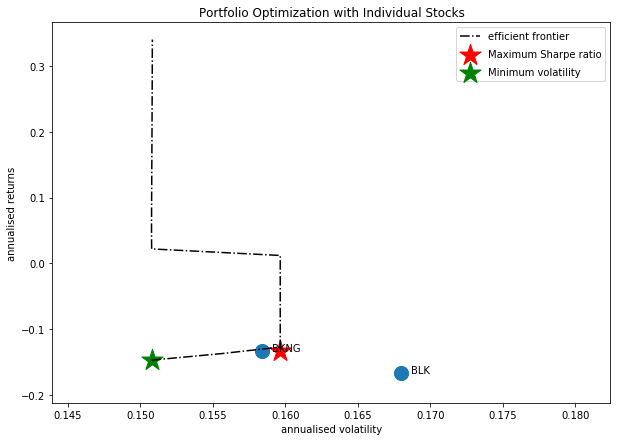

perform efficient_frontier_stock_portfolio Pairs of the companies we got ['BLK', 'ALLE']


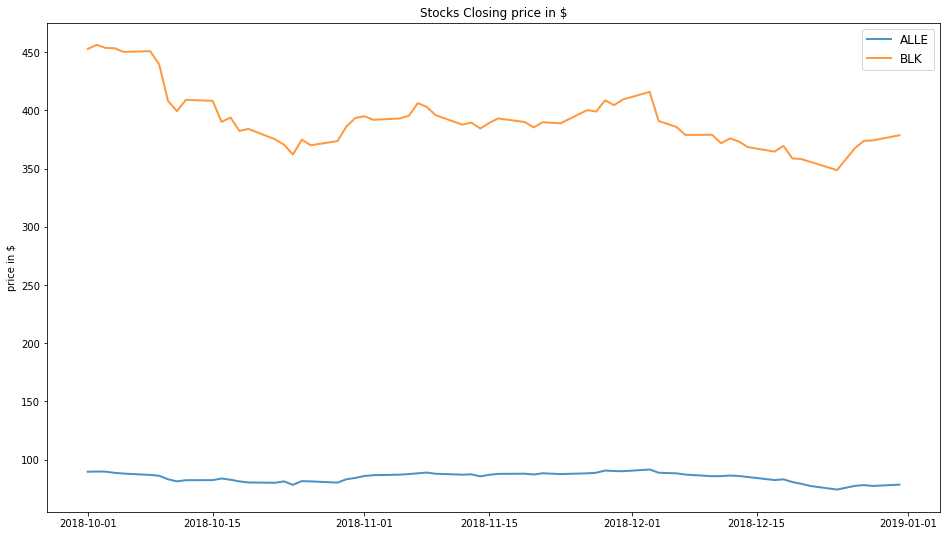

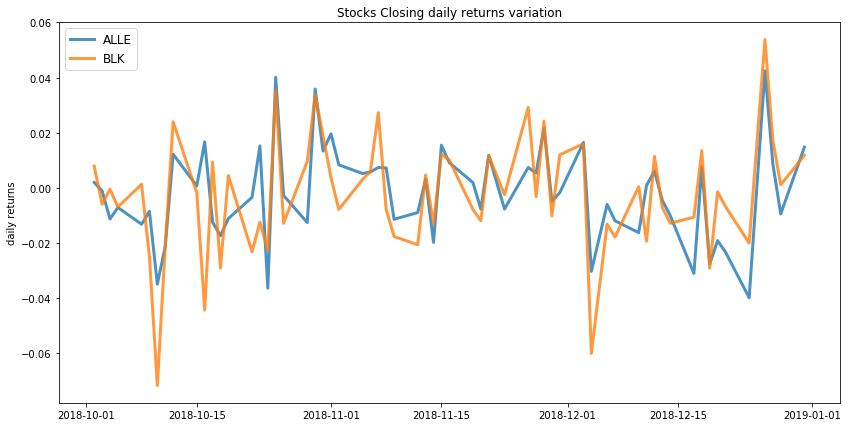

--------------------------------------------------------------------------------
Maximum Sharpe Ratio Portfolio Allocation

Annualised Return: -0.12
Annualised Volatility: 0.14


             ALLE  BLK
allocation  100.0  0.0
--------------------------------------------------------------------------------
Minimum Volatility Portfolio Allocation

Annualised Return: -0.13
Annualised Volatility: 0.14


             ALLE    BLK
allocation  82.68  17.32


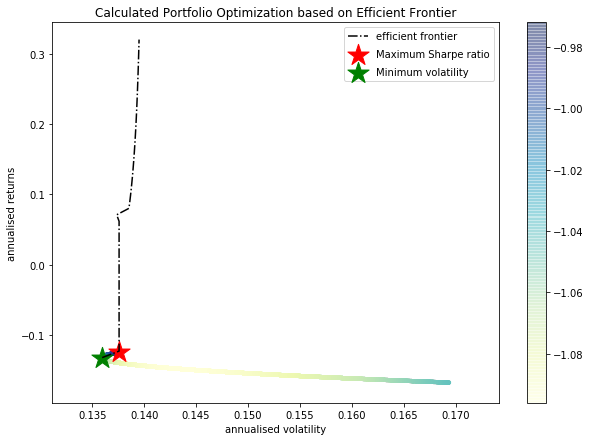

--------------------------------------------------------------------------------
Individual Stock Returns and Volatility

ALLE : annuaised return -0.12 , annualised volatility: 0.14
BLK : annuaised return -0.17 , annualised volatility: 0.17
--------------------------------------------------------------------------------


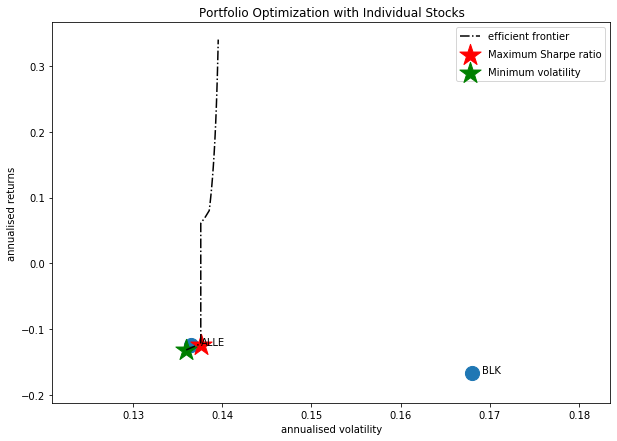

Companies listed in quarter 4 which is between 2019-01-01 and 2019-04-01
['BKNG' 'SHW' 'CMG' 'BLK' 'AZO' 'BHF' 'COTY']
perform efficient_frontier_stock_portfolio Pairs of the companies we got ['BKNG', 'CMG', 'AZO']


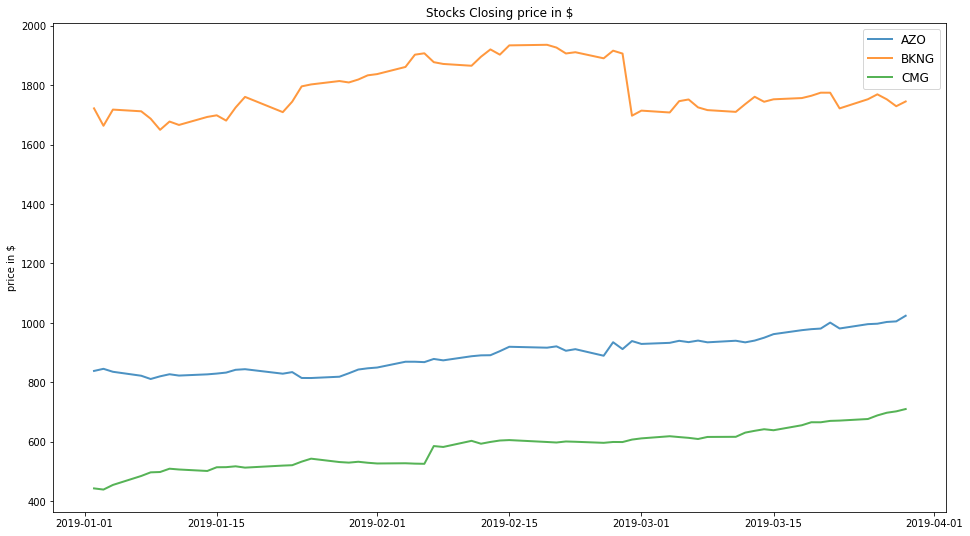

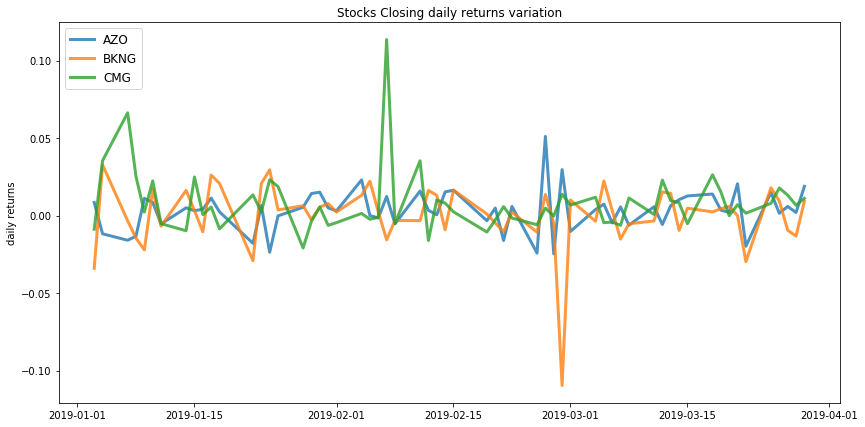

--------------------------------------------------------------------------------
Maximum Sharpe Ratio Portfolio Allocation

Annualised Return: 0.33
Annualised Volatility: 0.09


              AZO  BKNG    CMG
allocation  45.28  6.71  48.01
--------------------------------------------------------------------------------
Minimum Volatility Portfolio Allocation

Annualised Return: 0.23
Annualised Volatility: 0.07


              AZO   BKNG    CMG
allocation  51.11  24.32  24.58


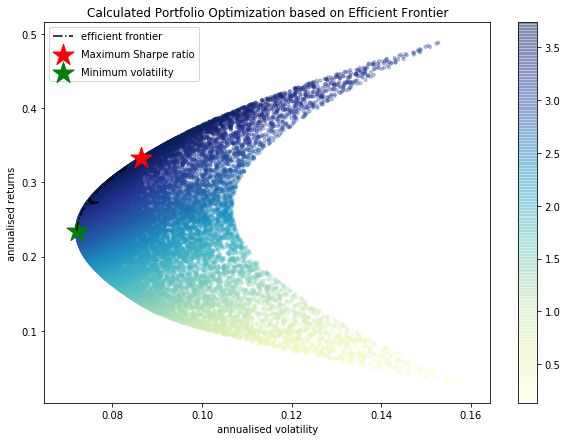

--------------------------------------------------------------------------------
Individual Stock Returns and Volatility

AZO : annuaised return 0.21 , annualised volatility: 0.1
BKNG : annuaised return 0.03 , annualised volatility: 0.16
CMG : annuaised return 0.49 , annualised volatility: 0.15
--------------------------------------------------------------------------------


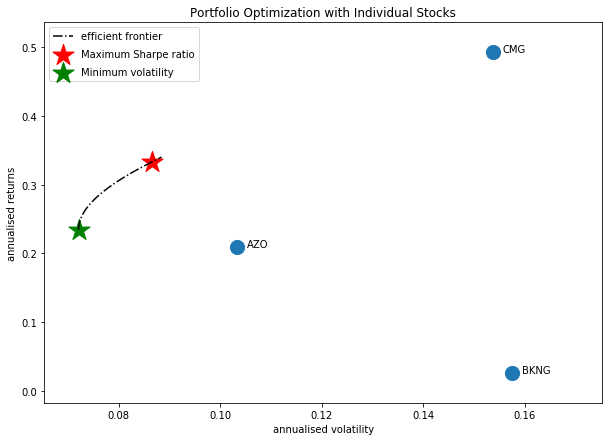

perform efficient_frontier_stock_portfolio Pairs of the companies we got ['BKNG', 'BHF']


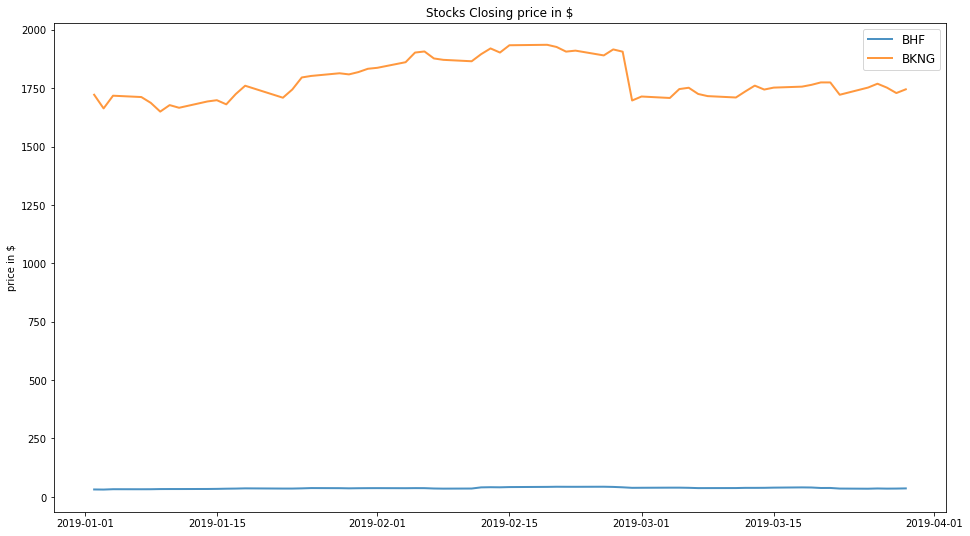

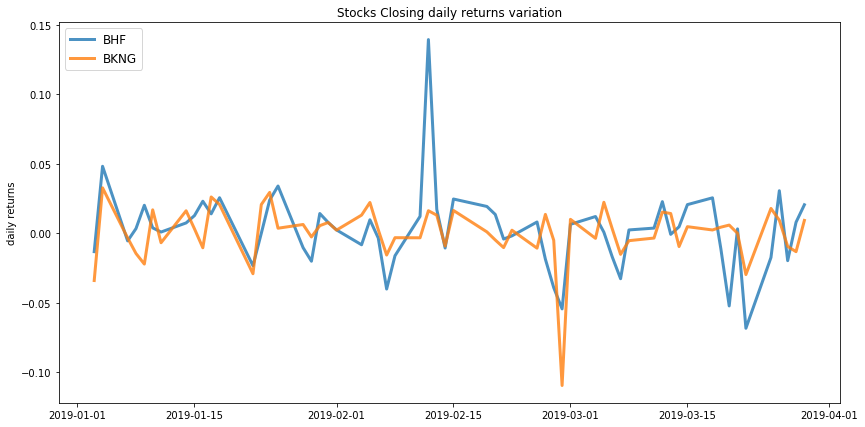

--------------------------------------------------------------------------------
Maximum Sharpe Ratio Portfolio Allocation

Annualised Return: 0.16
Annualised Volatility: 0.22


              BHF  BKNG
allocation  100.0   0.0
--------------------------------------------------------------------------------
Minimum Volatility Portfolio Allocation

Annualised Return: 0.05
Annualised Volatility: 0.15


              BHF   BKNG
allocation  20.14  79.86


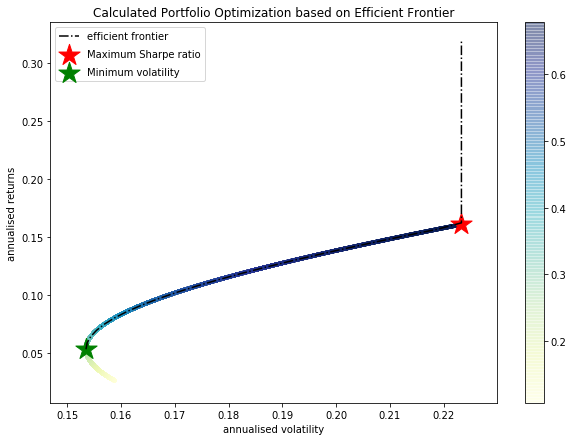

--------------------------------------------------------------------------------
Individual Stock Returns and Volatility

BHF : annuaised return 0.16 , annualised volatility: 0.22
BKNG : annuaised return 0.03 , annualised volatility: 0.16
--------------------------------------------------------------------------------


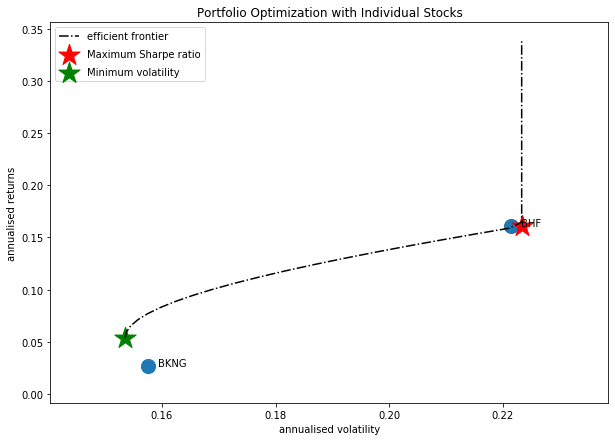

Companies listed in quarter 5 which is between 2019-04-01 and 2019-07-01
['EQIX' 'BKNG' 'BIIB' 'BA' 'AMZN' 'BDX' 'APC' 'AZO' 'CSX']
perform efficient_frontier_stock_portfolio Pairs of the companies we got ['EQIX', 'BKNG', 'BIIB', 'AMZN', 'BDX']


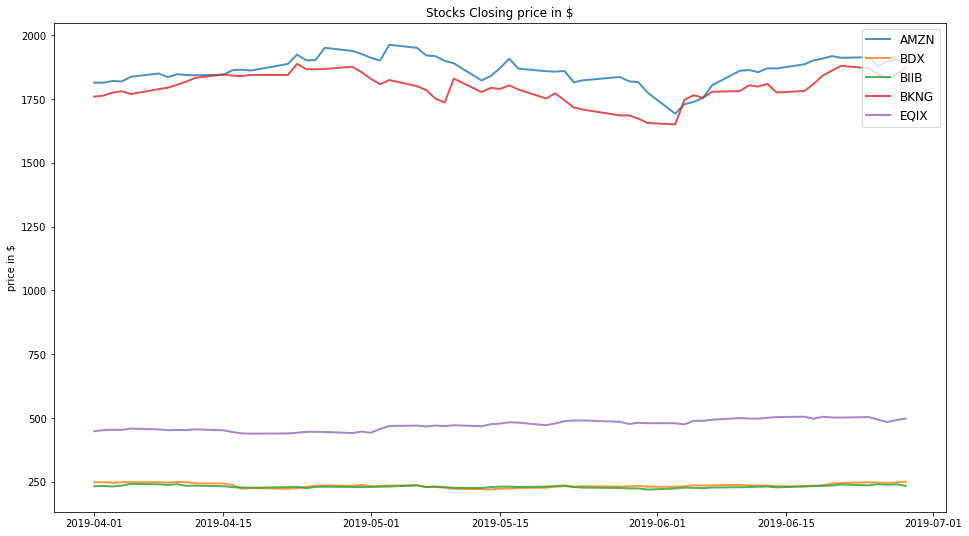

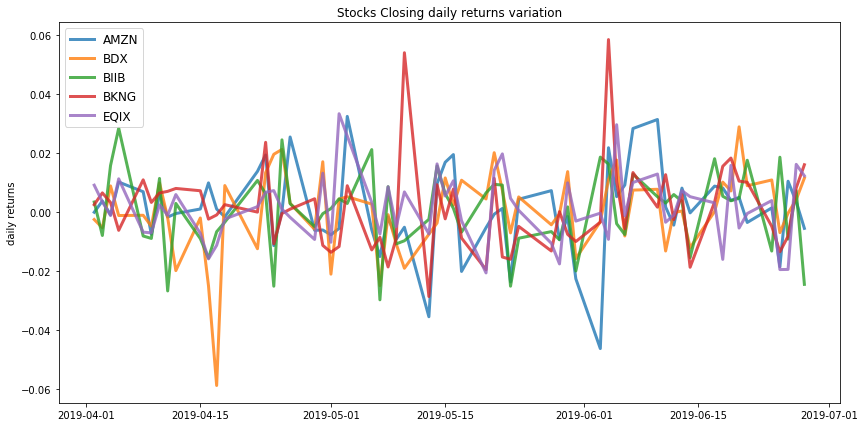

--------------------------------------------------------------------------------
Maximum Sharpe Ratio Portfolio Allocation

Annualised Return: 0.1
Annualised Volatility: 0.08


            AMZN  BDX  BIIB   BKNG   EQIX
allocation   0.0  0.0   0.0  22.96  77.04
--------------------------------------------------------------------------------
Minimum Volatility Portfolio Allocation

Annualised Return: 0.06
Annualised Volatility: 0.06


             AMZN    BDX   BIIB   BKNG   EQIX
allocation  10.08  13.59  24.09  18.65  33.59


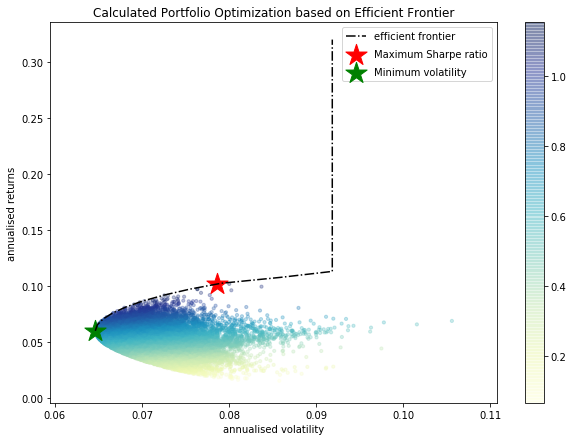

--------------------------------------------------------------------------------
Individual Stock Returns and Volatility

AMZN : annuaised return 0.05 , annualised volatility: 0.11
BDX : annuaised return 0.01 , annualised volatility: 0.11
BIIB : annuaised return 0.01 , annualised volatility: 0.1
BKNG : annuaised return 0.07 , annualised volatility: 0.12
EQIX : annuaised return 0.11 , annualised volatility: 0.09
--------------------------------------------------------------------------------


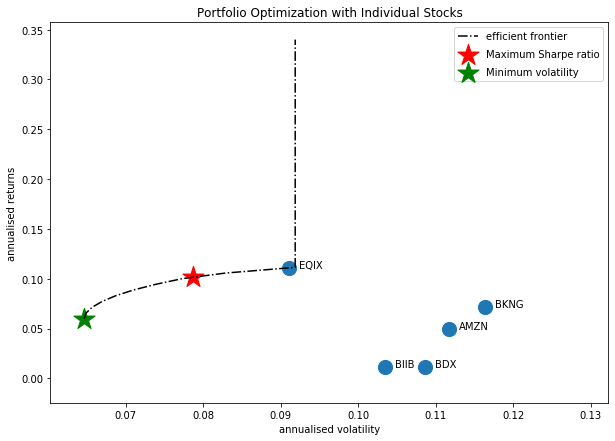

perform efficient_frontier_stock_portfolio Pairs of the companies we got ['EQIX', 'CSX']


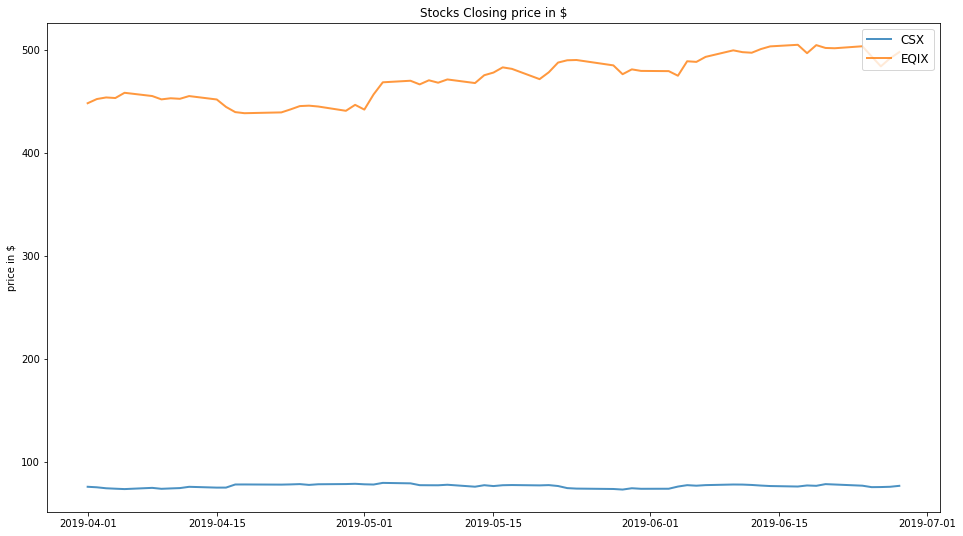

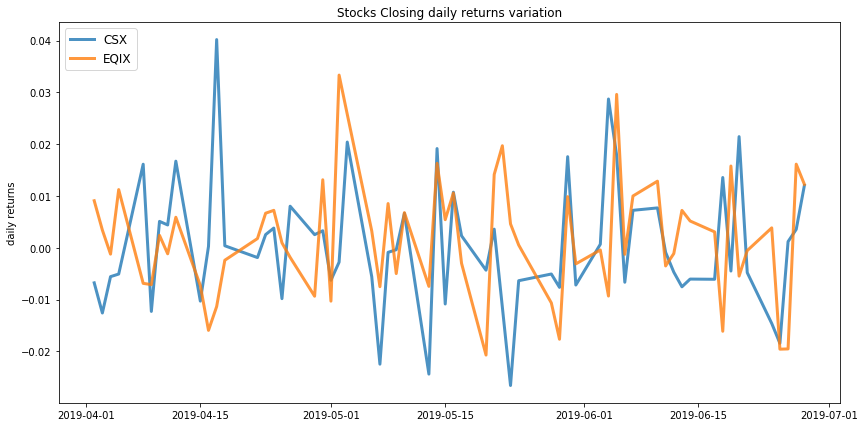

--------------------------------------------------------------------------------
Maximum Sharpe Ratio Portfolio Allocation

Annualised Return: 0.11
Annualised Volatility: 0.09


            CSX   EQIX
allocation  0.0  100.0
--------------------------------------------------------------------------------
Minimum Volatility Portfolio Allocation

Annualised Return: 0.07
Annualised Volatility: 0.07


              CSX   EQIX
allocation  45.93  54.07


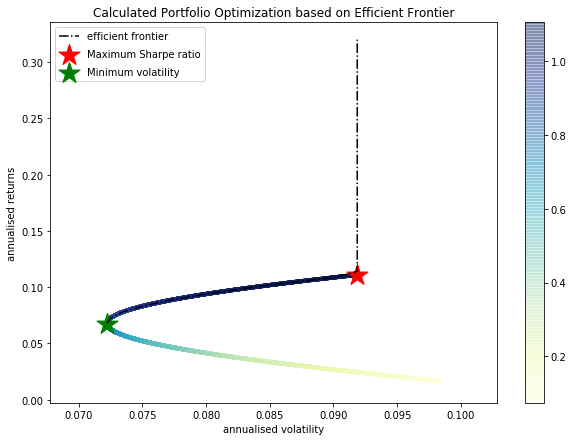

--------------------------------------------------------------------------------
Individual Stock Returns and Volatility

CSX : annuaised return 0.02 , annualised volatility: 0.1
EQIX : annuaised return 0.11 , annualised volatility: 0.09
--------------------------------------------------------------------------------


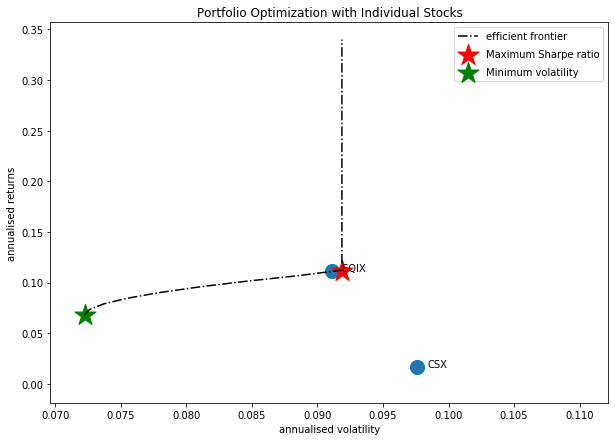

perform efficient_frontier_stock_portfolio Pairs of the companies we got ['BKNG', 'BA']


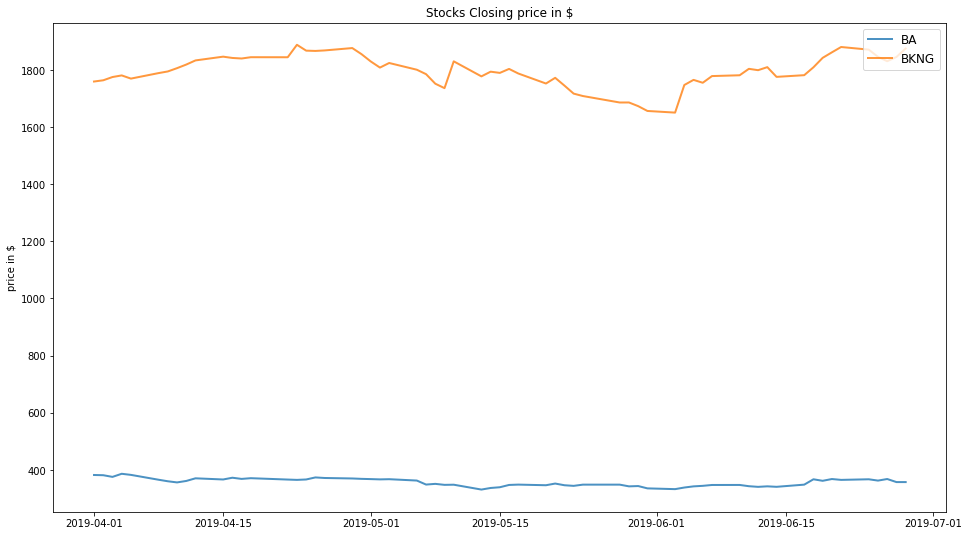

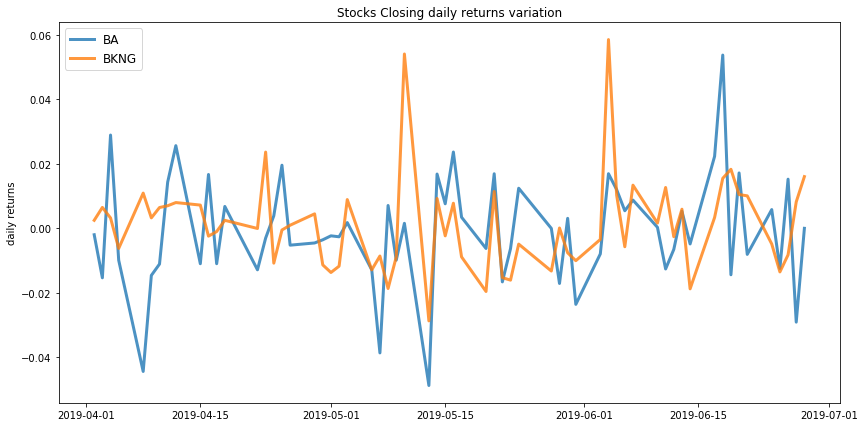

--------------------------------------------------------------------------------
Maximum Sharpe Ratio Portfolio Allocation

Annualised Return: 0.07
Annualised Volatility: 0.12


             BA   BKNG
allocation  0.0  100.0
--------------------------------------------------------------------------------
Minimum Volatility Portfolio Allocation

Annualised Return: 0.02
Annualised Volatility: 0.1


               BA   BKNG
allocation  38.87  61.13


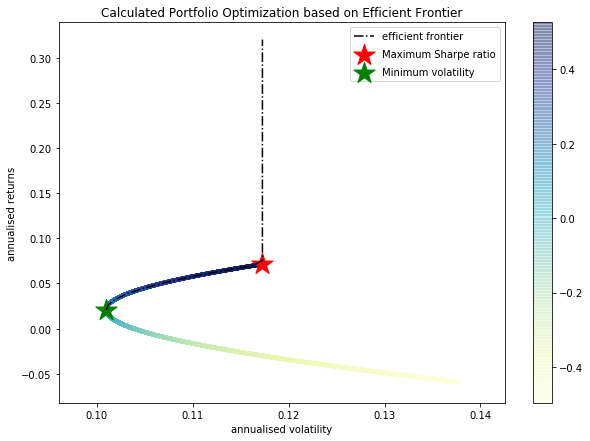

--------------------------------------------------------------------------------
Individual Stock Returns and Volatility

BA : annuaised return -0.06 , annualised volatility: 0.14
BKNG : annuaised return 0.07 , annualised volatility: 0.12
--------------------------------------------------------------------------------


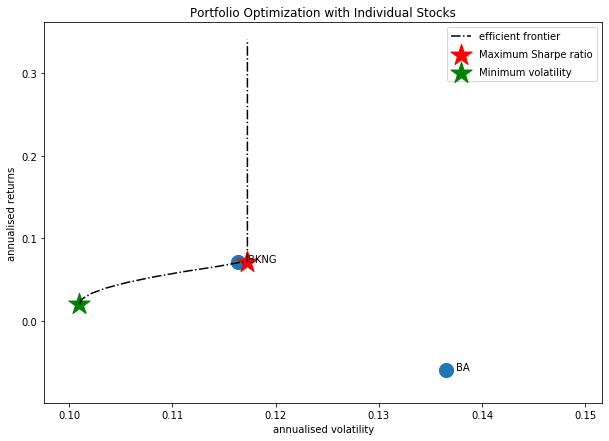

perform efficient_frontier_stock_portfolio Pairs of the companies we got ['BKNG', 'BIIB', 'AMZN', 'APC']


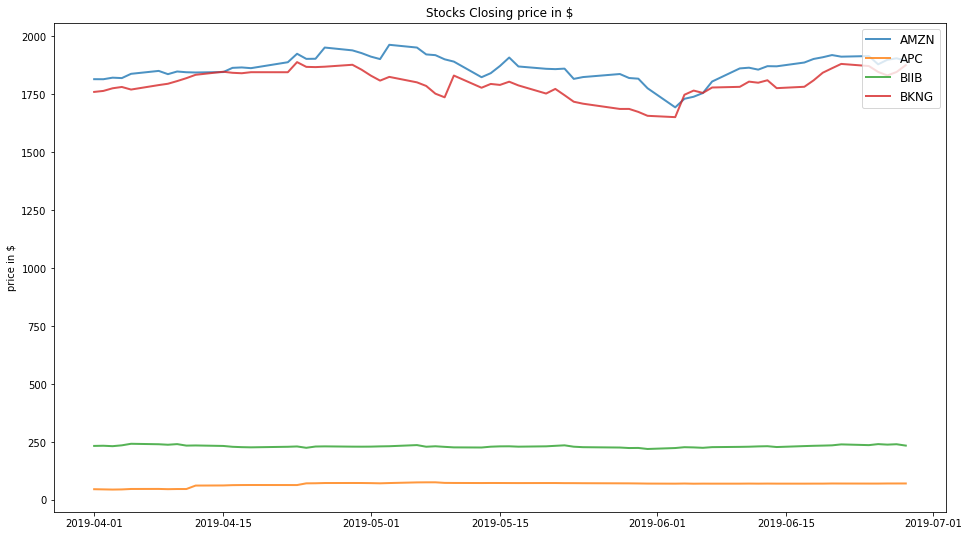

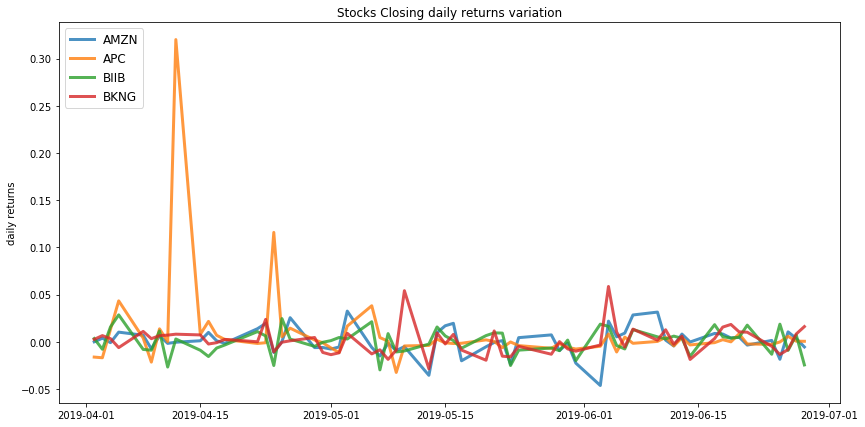

--------------------------------------------------------------------------------
Maximum Sharpe Ratio Portfolio Allocation

Annualised Return: 0.25
Annualised Volatility: 0.17


             AMZN    APC  BIIB   BKNG
allocation  15.71  43.85   0.0  40.45
--------------------------------------------------------------------------------
Minimum Volatility Portfolio Allocation

Annualised Return: 0.06
Annualised Volatility: 0.08


             AMZN   APC   BIIB   BKNG
allocation  24.74  3.97  43.71  27.57


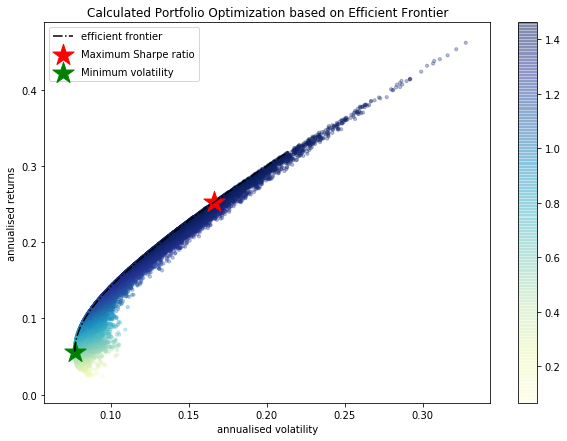

--------------------------------------------------------------------------------
Individual Stock Returns and Volatility

AMZN : annuaised return 0.05 , annualised volatility: 0.11
APC : annuaised return 0.49 , annualised volatility: 0.35
BIIB : annuaised return 0.01 , annualised volatility: 0.1
BKNG : annuaised return 0.07 , annualised volatility: 0.12
--------------------------------------------------------------------------------


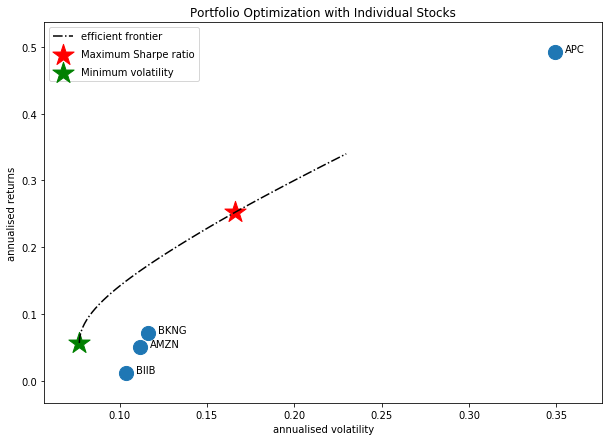

perform efficient_frontier_stock_portfolio Pairs of the companies we got ['BKNG', 'AZO']


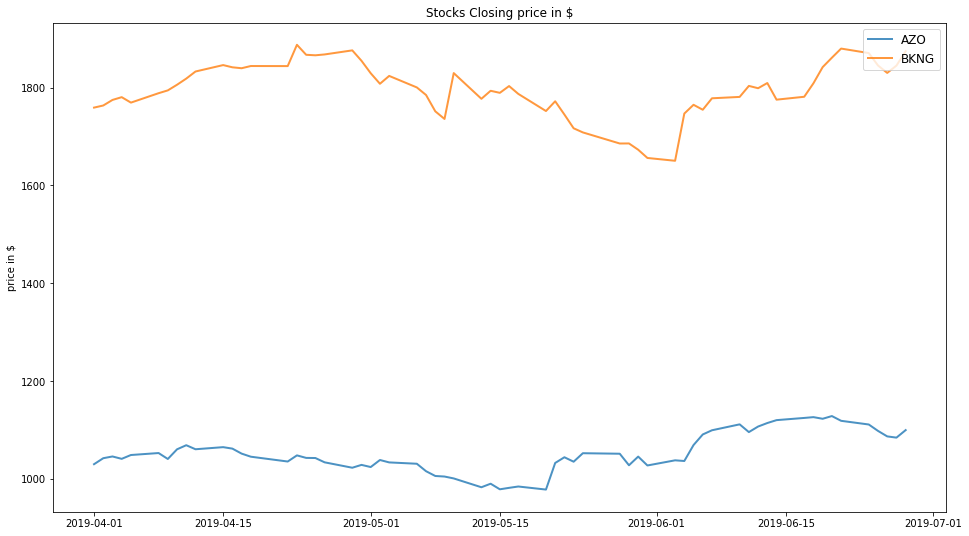

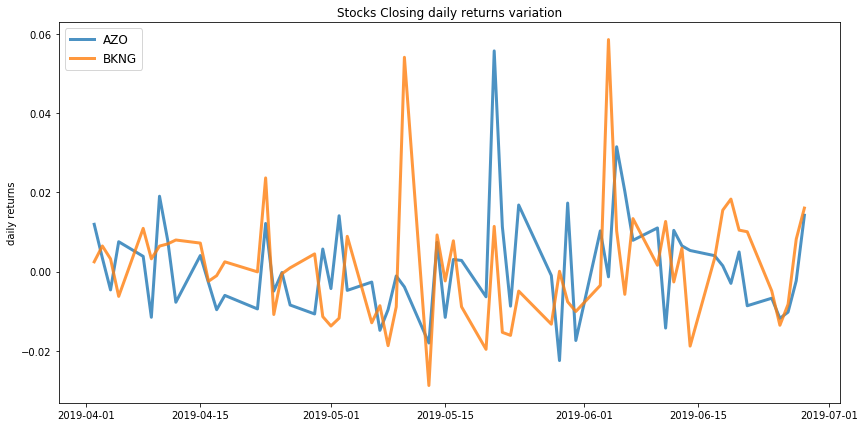

--------------------------------------------------------------------------------
Maximum Sharpe Ratio Portfolio Allocation

Annualised Return: 0.07
Annualised Volatility: 0.08


              AZO   BKNG
allocation  58.89  41.11
--------------------------------------------------------------------------------
Minimum Volatility Portfolio Allocation

Annualised Return: 0.07
Annualised Volatility: 0.08


              AZO   BKNG
allocation  58.76  41.24


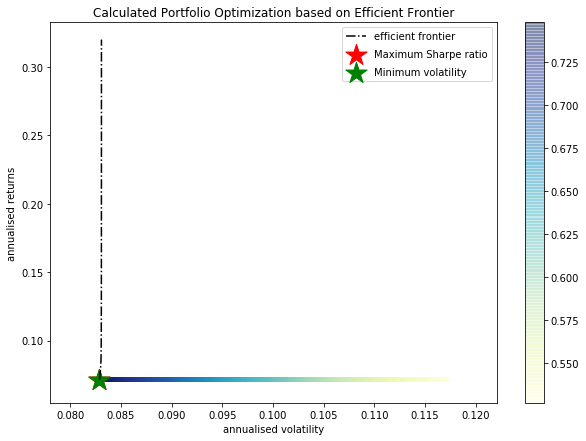

--------------------------------------------------------------------------------
Individual Stock Returns and Volatility

AZO : annuaised return 0.07 , annualised volatility: 0.1
BKNG : annuaised return 0.07 , annualised volatility: 0.12
--------------------------------------------------------------------------------


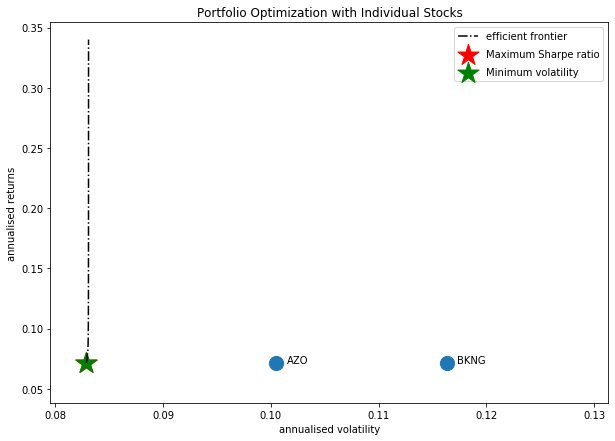

Companies listed in quarter 6 which is between 2019-07-01 and 2019-10-01
['BKNG' 'EQIX' 'BLK' 'CMG' 'DHI' 'CTXS']
perform efficient_frontier_stock_portfolio Pairs of the companies we got ['BKNG', 'BLK', 'CMG']


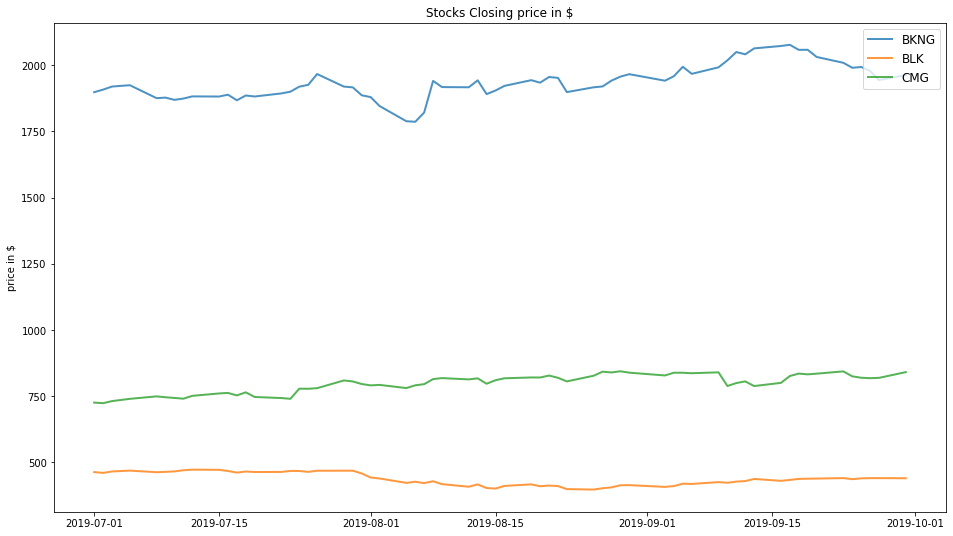

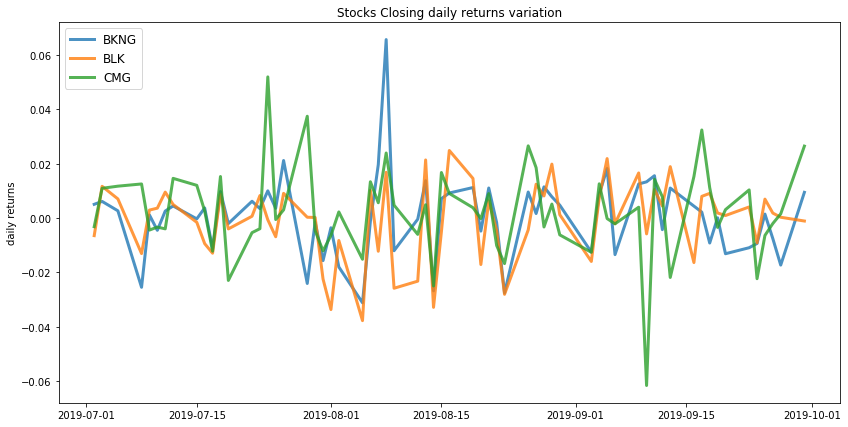

--------------------------------------------------------------------------------
Maximum Sharpe Ratio Portfolio Allocation

Annualised Return: 0.16
Annualised Volatility: 0.13


            BKNG  BLK    CMG
allocation   0.0  0.0  100.0
--------------------------------------------------------------------------------
Minimum Volatility Portfolio Allocation

Annualised Return: 0.05
Annualised Volatility: 0.09


             BKNG    BLK    CMG
allocation  34.05  34.06  31.89


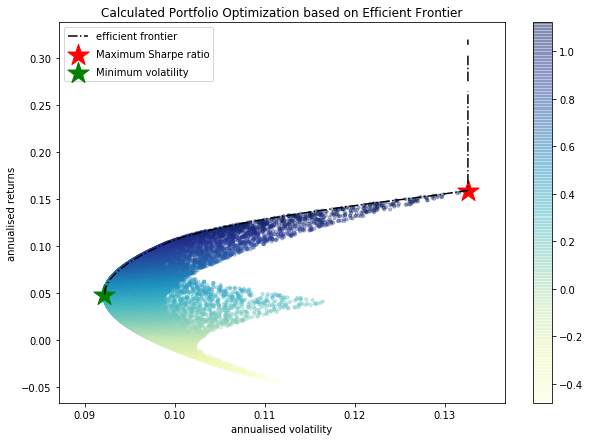

--------------------------------------------------------------------------------
Individual Stock Returns and Volatility

BKNG : annuaised return 0.04 , annualised volatility: 0.12
BLK : annuaised return -0.05 , annualised volatility: 0.11
CMG : annuaised return 0.16 , annualised volatility: 0.13
--------------------------------------------------------------------------------


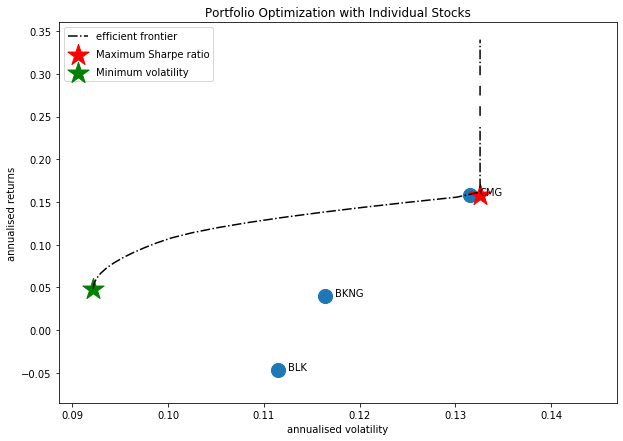

perform efficient_frontier_stock_portfolio Pairs of the companies we got ['BKNG', 'CTXS']


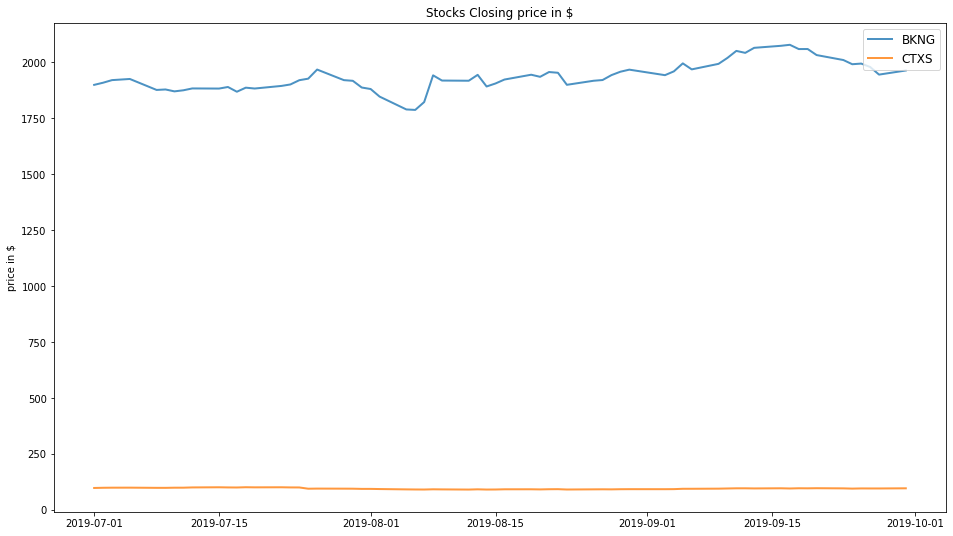

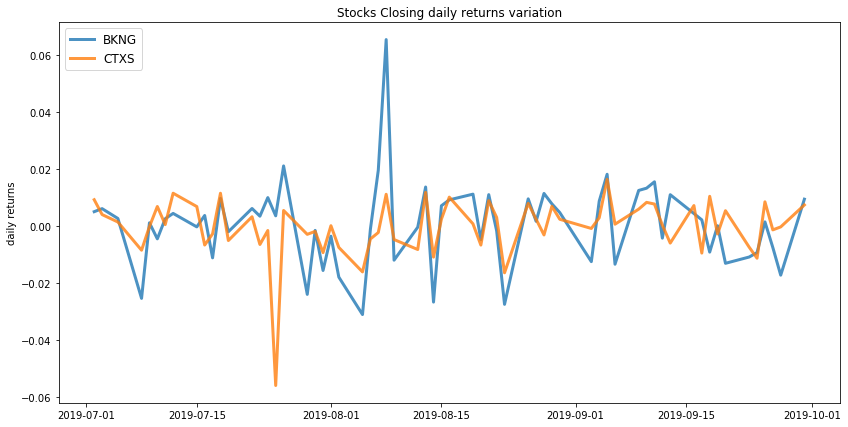

--------------------------------------------------------------------------------
Maximum Sharpe Ratio Portfolio Allocation

Annualised Return: 0.04
Annualised Volatility: 0.12


             BKNG  CTXS
allocation  100.0   0.0
--------------------------------------------------------------------------------
Minimum Volatility Portfolio Allocation

Annualised Return: -0.0
Annualised Volatility: 0.08


             BKNG   CTXS
allocation  21.57  78.43


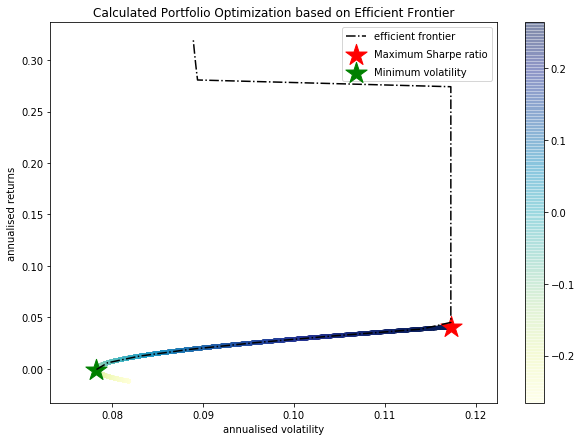

--------------------------------------------------------------------------------
Individual Stock Returns and Volatility

BKNG : annuaised return 0.04 , annualised volatility: 0.12
CTXS : annuaised return -0.01 , annualised volatility: 0.08
--------------------------------------------------------------------------------


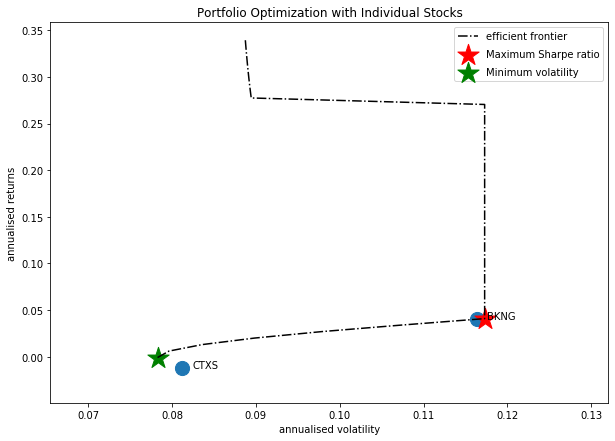

perform efficient_frontier_stock_portfolio Pairs of the companies we got ['EQIX', 'BLK']


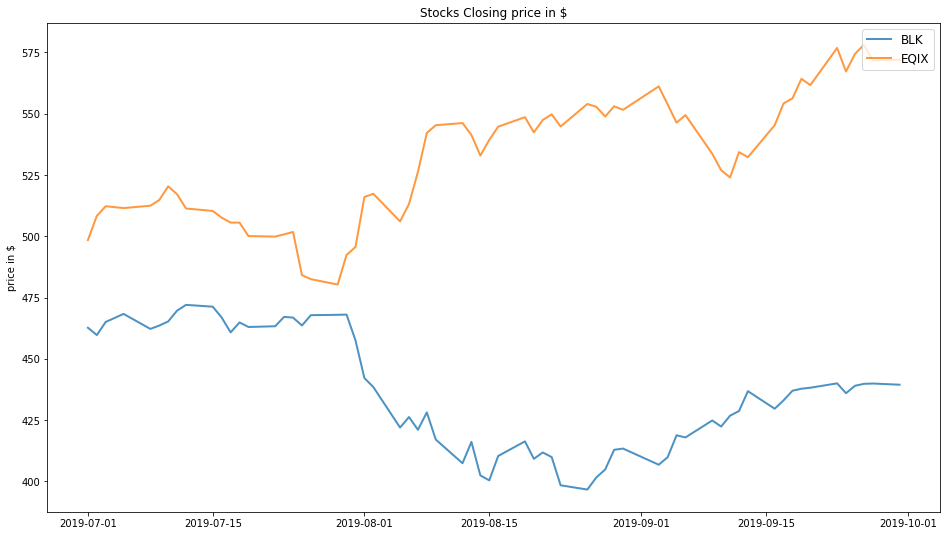

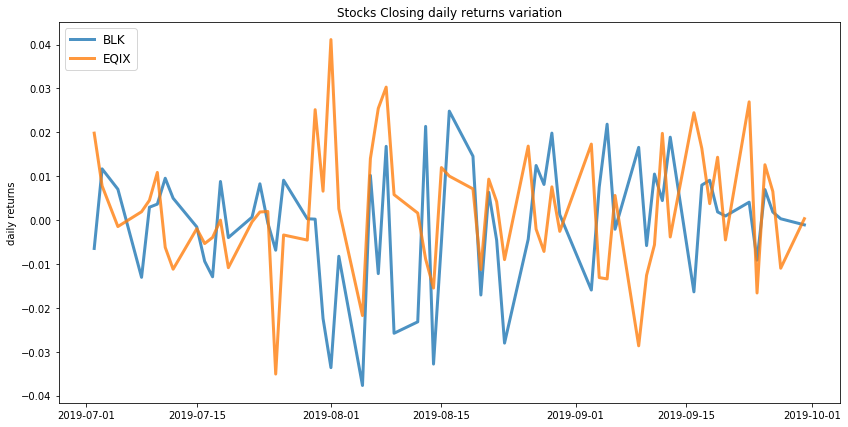

--------------------------------------------------------------------------------
Maximum Sharpe Ratio Portfolio Allocation

Annualised Return: 0.15
Annualised Volatility: 0.11


            BLK   EQIX
allocation  0.0  100.0
--------------------------------------------------------------------------------
Minimum Volatility Portfolio Allocation

Annualised Return: 0.05
Annualised Volatility: 0.08


             BLK  EQIX
allocation  50.0  50.0


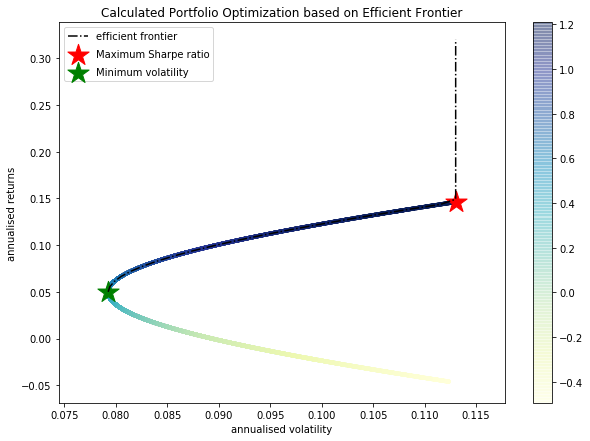

--------------------------------------------------------------------------------
Individual Stock Returns and Volatility

BLK : annuaised return -0.05 , annualised volatility: 0.11
EQIX : annuaised return 0.15 , annualised volatility: 0.11
--------------------------------------------------------------------------------


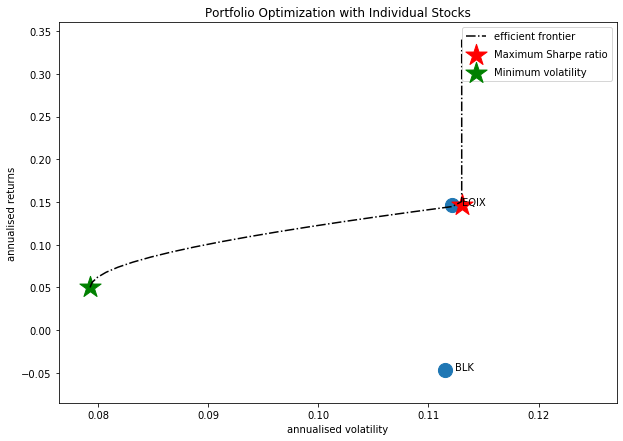

Companies listed in quarter 7 which is between 2019-10-01 and 2020-01-01
['BKNG' 'BIIB' 'EQIX' 'BLK' 'SHW' 'GOOGL' 'AMD' 'DVN']
perform efficient_frontier_stock_portfolio Pairs of the companies we got ['BKNG', 'BIIB']


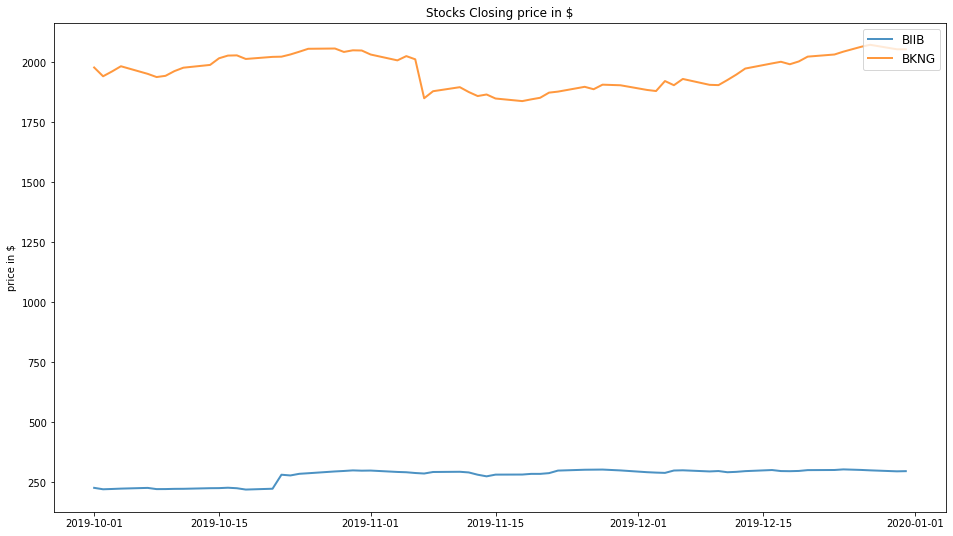

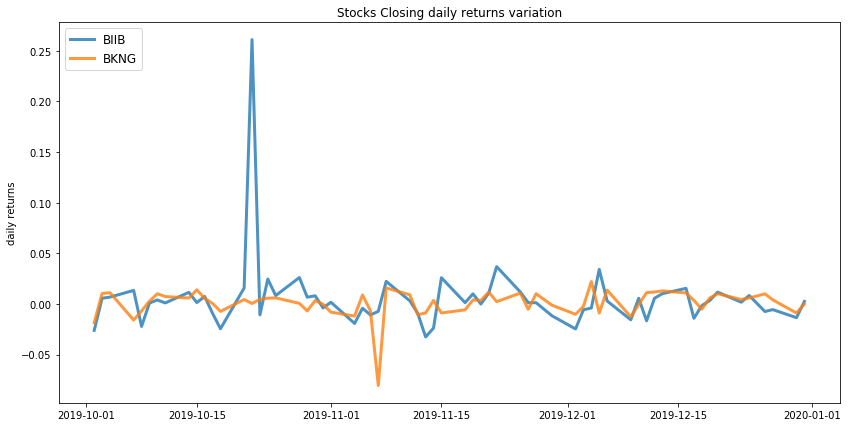

--------------------------------------------------------------------------------
Maximum Sharpe Ratio Portfolio Allocation

Annualised Return: 0.21
Annualised Volatility: 0.19


             BIIB   BKNG
allocation  64.29  35.71
--------------------------------------------------------------------------------
Minimum Volatility Portfolio Allocation

Annualised Return: 0.07
Annualised Volatility: 0.1


            BIIB   BKNG
allocation  9.65  90.35


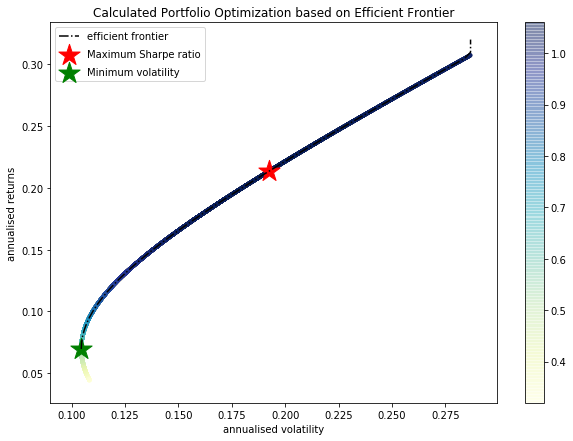

--------------------------------------------------------------------------------
Individual Stock Returns and Volatility

BIIB : annuaised return 0.31 , annualised volatility: 0.28
BKNG : annuaised return 0.04 , annualised volatility: 0.11
--------------------------------------------------------------------------------


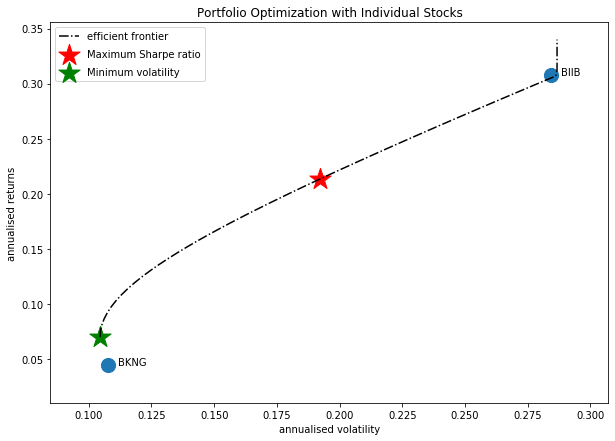

perform efficient_frontier_stock_portfolio Pairs of the companies we got ['BIIB', 'EQIX', 'GOOGL']


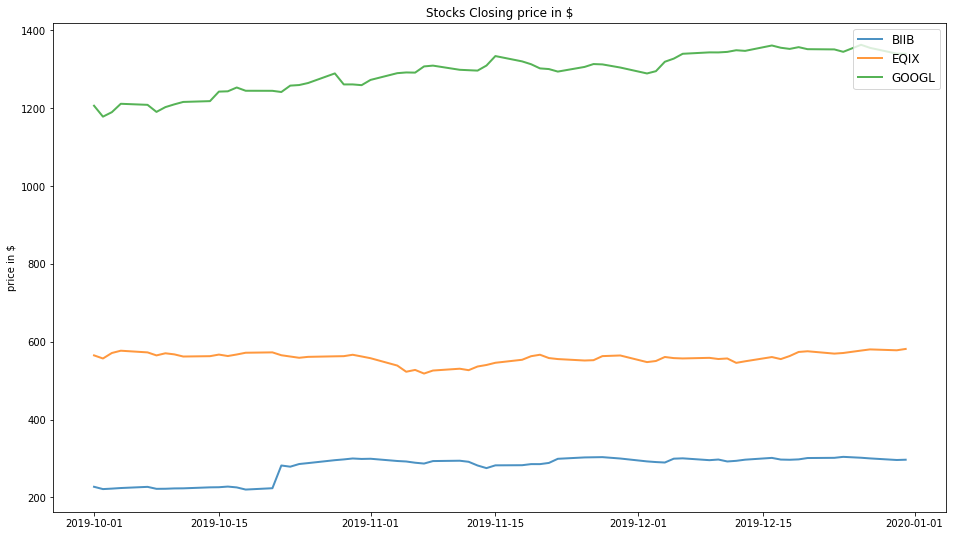

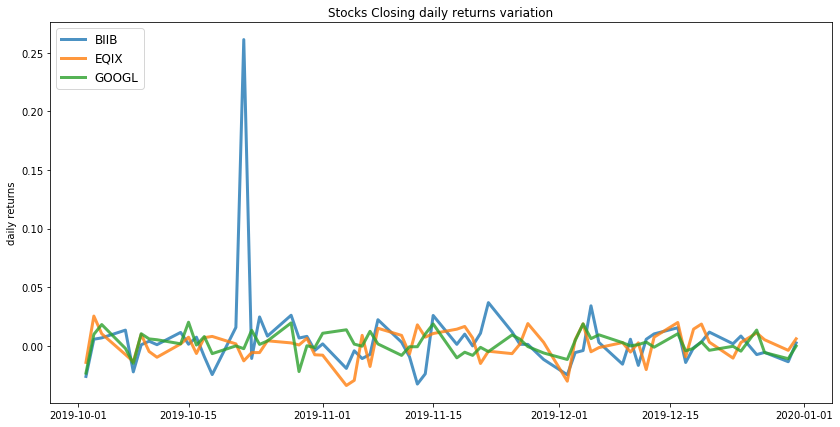

--------------------------------------------------------------------------------
Maximum Sharpe Ratio Portfolio Allocation

Annualised Return: 0.14
Annualised Volatility: 0.08


             BIIB  EQIX  GOOGL
allocation  15.77  3.96  80.26
--------------------------------------------------------------------------------
Minimum Volatility Portfolio Allocation

Annualised Return: 0.09
Annualised Volatility: 0.06


            BIIB   EQIX  GOOGL
allocation  4.68  31.89  63.43


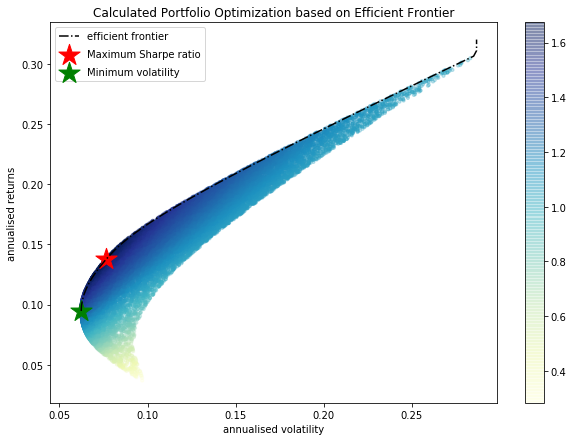

--------------------------------------------------------------------------------
Individual Stock Returns and Volatility

BIIB : annuaised return 0.31 , annualised volatility: 0.28
EQIX : annuaised return 0.03 , annualised volatility: 0.1
GOOGL : annuaised return 0.11 , annualised volatility: 0.07
--------------------------------------------------------------------------------


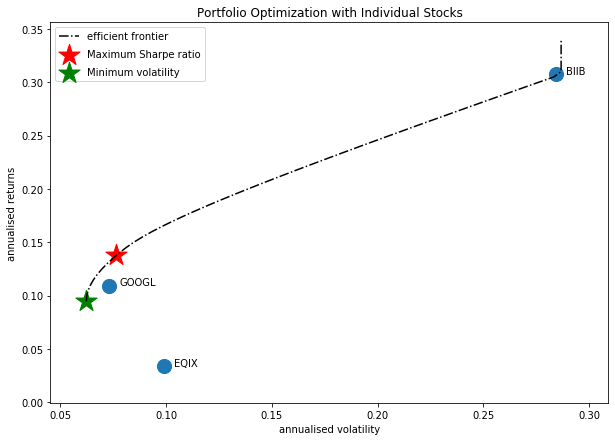

perform efficient_frontier_stock_portfolio Pairs of the companies we got ['BIIB', 'BLK']


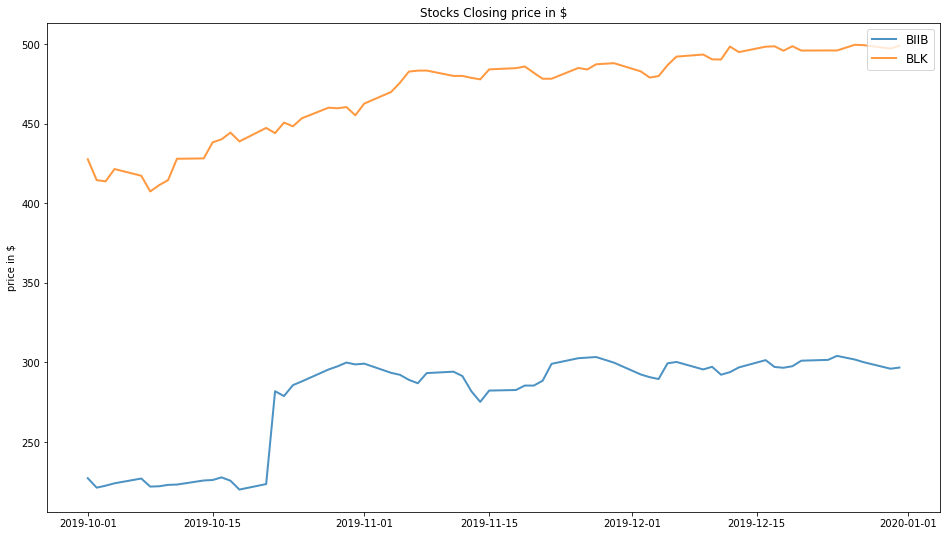

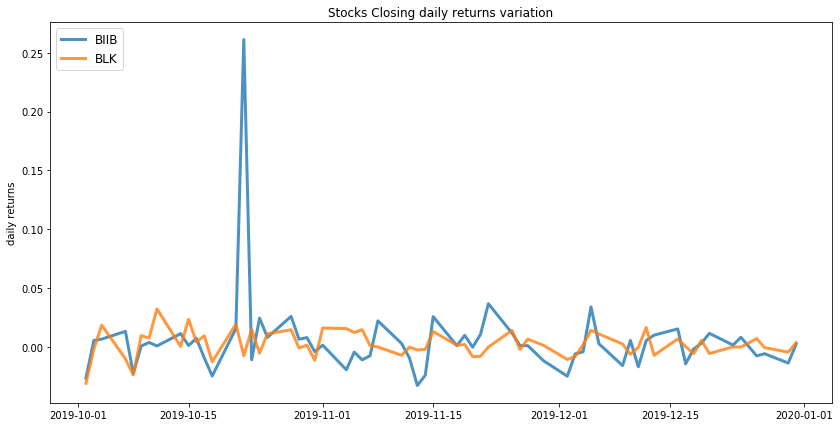

--------------------------------------------------------------------------------
Maximum Sharpe Ratio Portfolio Allocation

Annualised Return: 0.18
Annualised Volatility: 0.09


             BIIB    BLK
allocation  15.09  84.91
--------------------------------------------------------------------------------
Minimum Volatility Portfolio Allocation

Annualised Return: 0.17
Annualised Volatility: 0.08


            BIIB    BLK
allocation  7.95  92.05


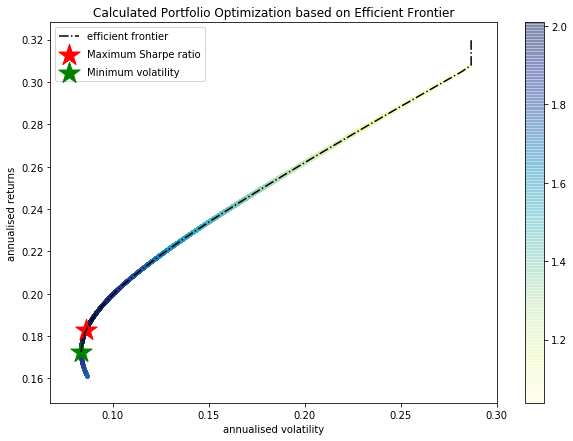

--------------------------------------------------------------------------------
Individual Stock Returns and Volatility

BIIB : annuaised return 0.31 , annualised volatility: 0.28
BLK : annuaised return 0.16 , annualised volatility: 0.09
--------------------------------------------------------------------------------


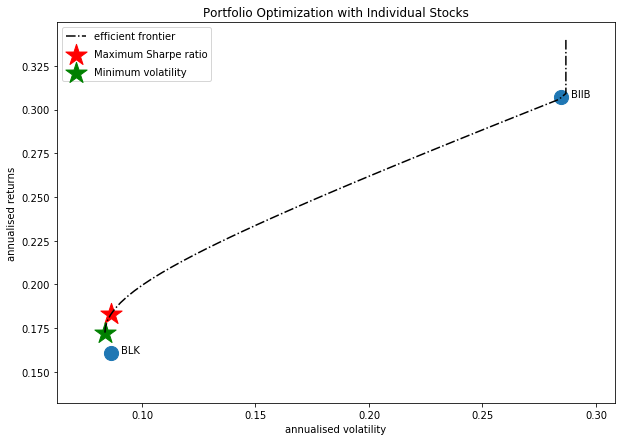

perform efficient_frontier_stock_portfolio Pairs of the companies we got ['BIIB', 'AMD']


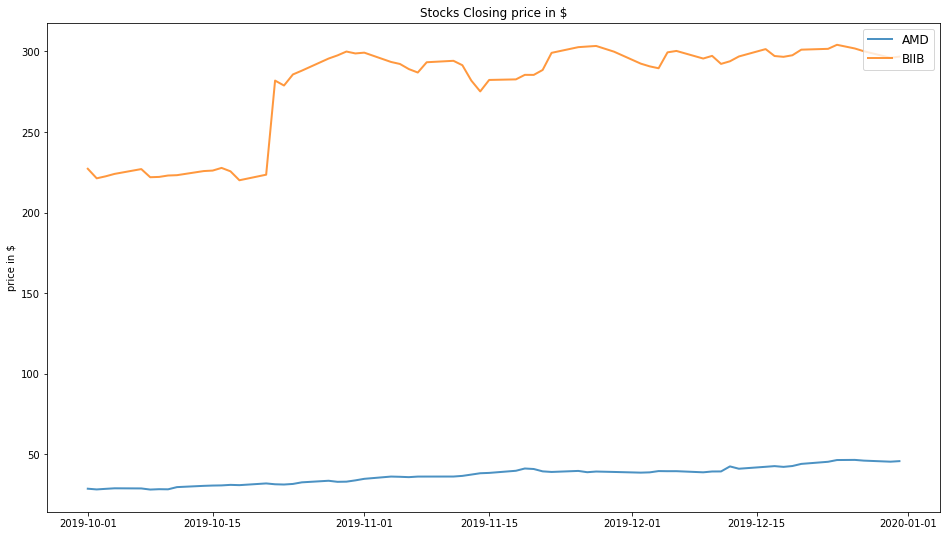

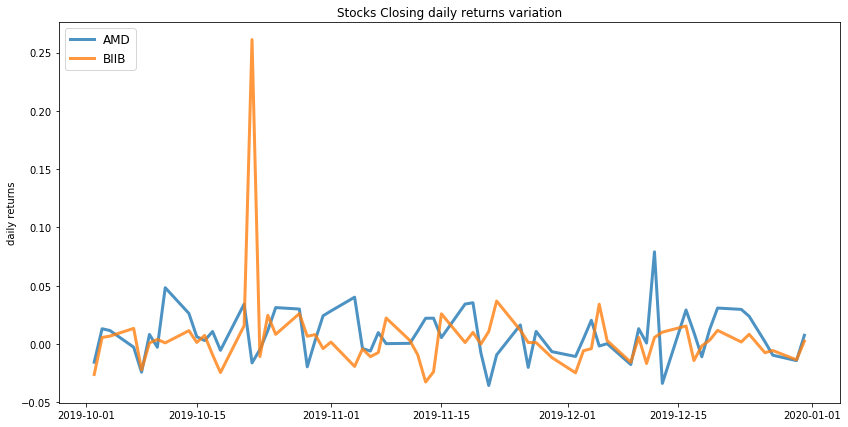

--------------------------------------------------------------------------------
Maximum Sharpe Ratio Portfolio Allocation

Annualised Return: 0.45
Annualised Volatility: 0.14


              AMD   BIIB
allocation  80.59  19.41
--------------------------------------------------------------------------------
Minimum Volatility Portfolio Allocation

Annualised Return: 0.44
Annualised Volatility: 0.14


              AMD   BIIB
allocation  73.81  26.19


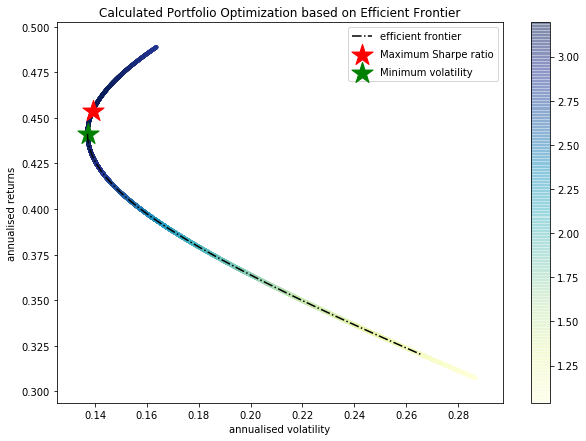

--------------------------------------------------------------------------------
Individual Stock Returns and Volatility

AMD : annuaised return 0.49 , annualised volatility: 0.16
BIIB : annuaised return 0.31 , annualised volatility: 0.28
--------------------------------------------------------------------------------


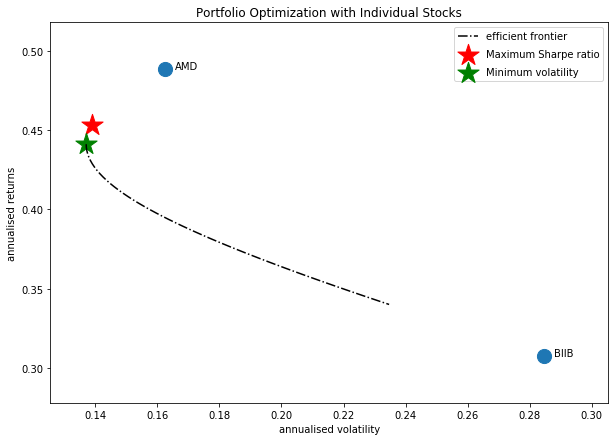

Companies listed in quarter 8 which is between 2020-01-01 and 2020-04-01
['EQIX' 'AMZN' 'BA' 'CTXS' 'BXP']
perform efficient_frontier_stock_portfolio Pairs of the companies we got ['EQIX', 'BA']


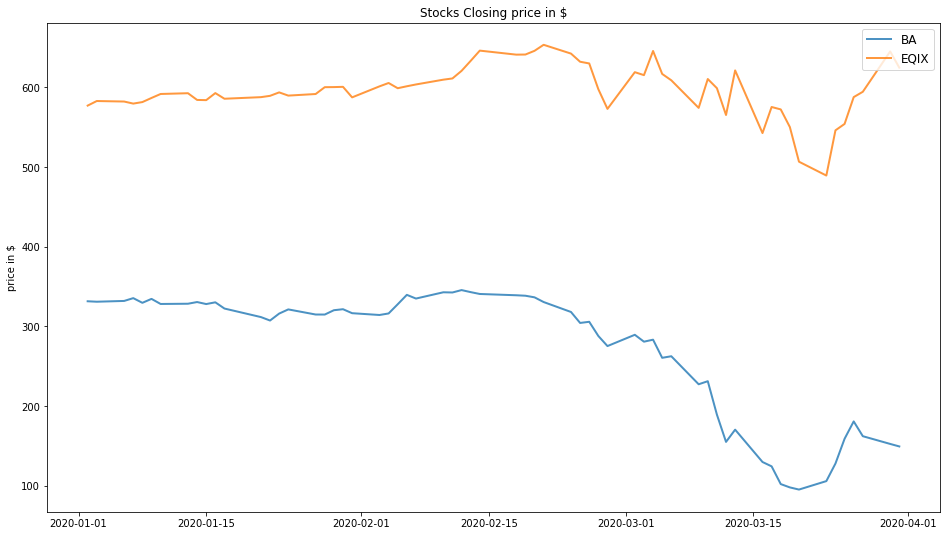

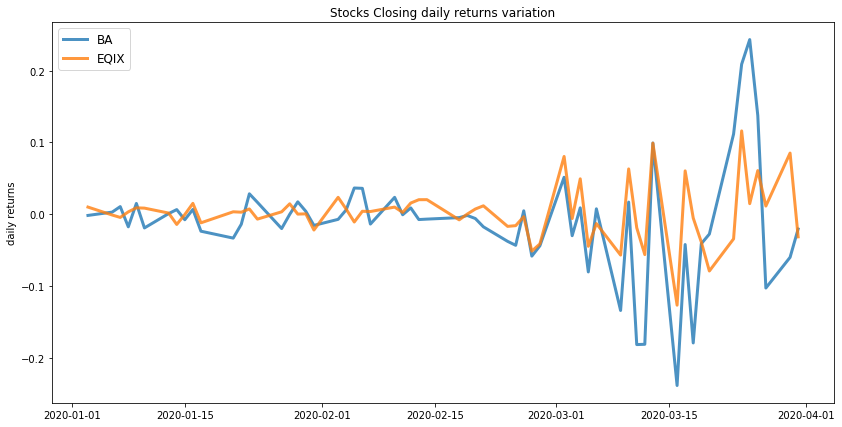

--------------------------------------------------------------------------------
Maximum Sharpe Ratio Portfolio Allocation

Annualised Return: 0.13
Annualised Volatility: 0.31


             BA   EQIX
allocation  0.0  100.0
--------------------------------------------------------------------------------
Minimum Volatility Portfolio Allocation

Annualised Return: 0.13
Annualised Volatility: 0.31


             BA   EQIX
allocation  0.0  100.0


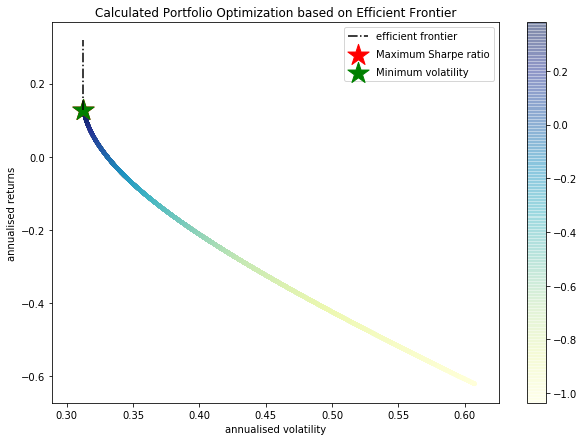

--------------------------------------------------------------------------------
Individual Stock Returns and Volatility

BA : annuaised return -0.62 , annualised volatility: 0.6
EQIX : annuaised return 0.13 , annualised volatility: 0.31
--------------------------------------------------------------------------------


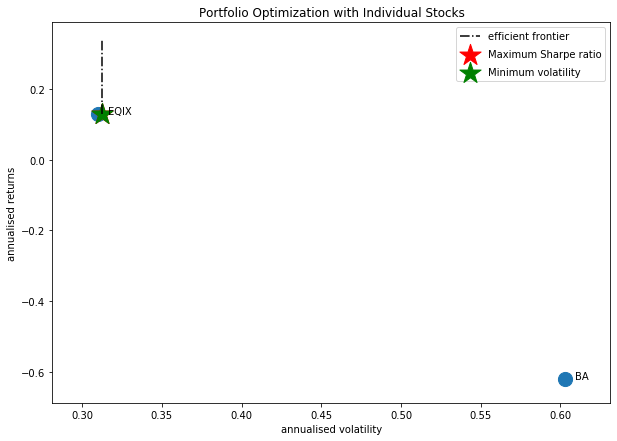

perform efficient_frontier_stock_portfolio Pairs of the companies we got ['EQIX', 'CTXS']


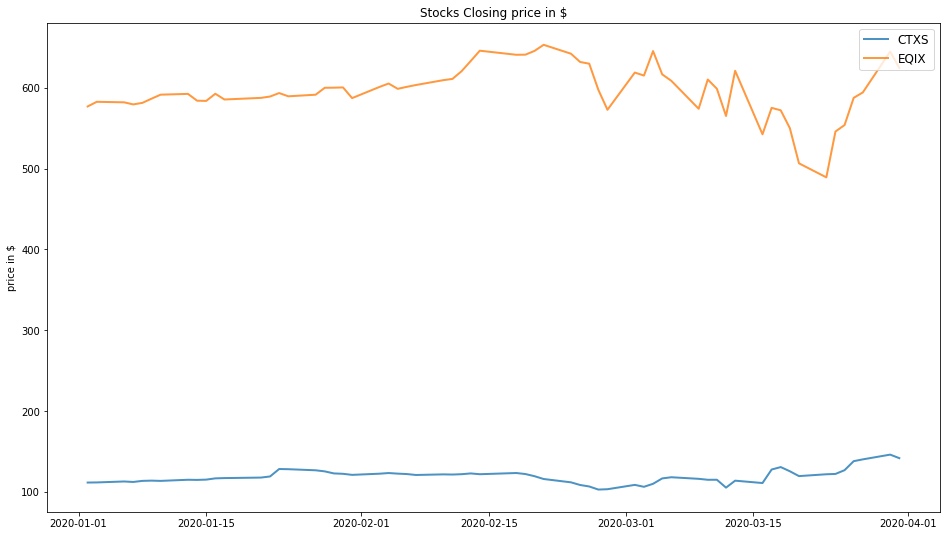

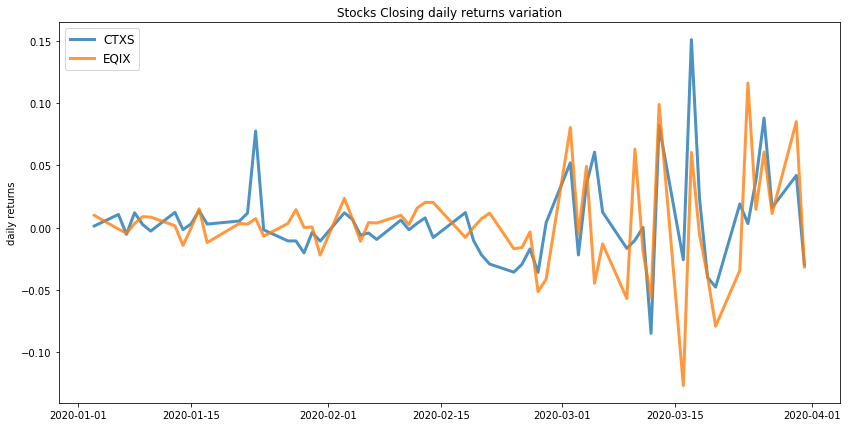

--------------------------------------------------------------------------------
Maximum Sharpe Ratio Portfolio Allocation

Annualised Return: 0.28
Annualised Volatility: 0.28


             CTXS  EQIX
allocation  100.0   0.0
--------------------------------------------------------------------------------
Minimum Volatility Portfolio Allocation

Annualised Return: 0.22
Annualised Volatility: 0.26


             CTXS   EQIX
allocation  62.96  37.04


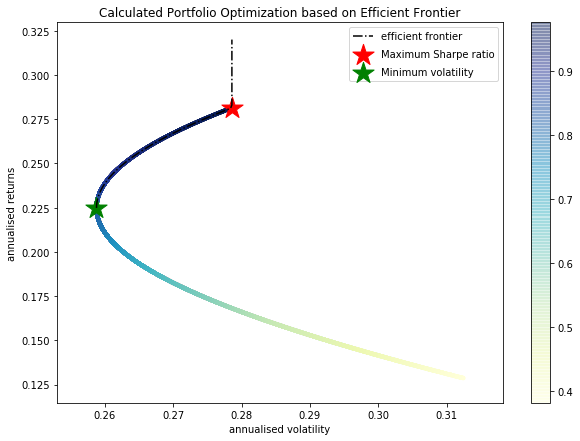

--------------------------------------------------------------------------------
Individual Stock Returns and Volatility

CTXS : annuaised return 0.28 , annualised volatility: 0.28
EQIX : annuaised return 0.13 , annualised volatility: 0.31
--------------------------------------------------------------------------------


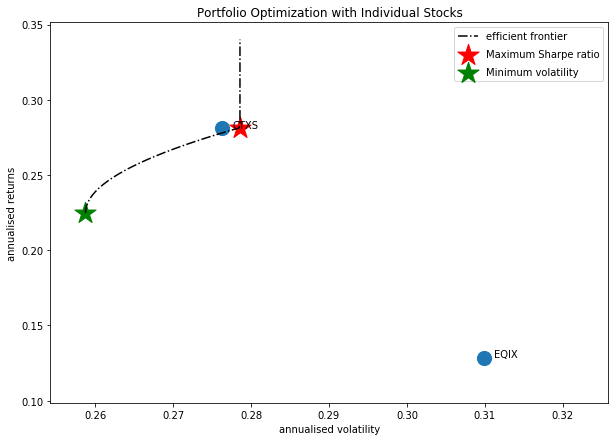

perform efficient_frontier_stock_portfolio Pairs of the companies we got ['EQIX', 'BXP']


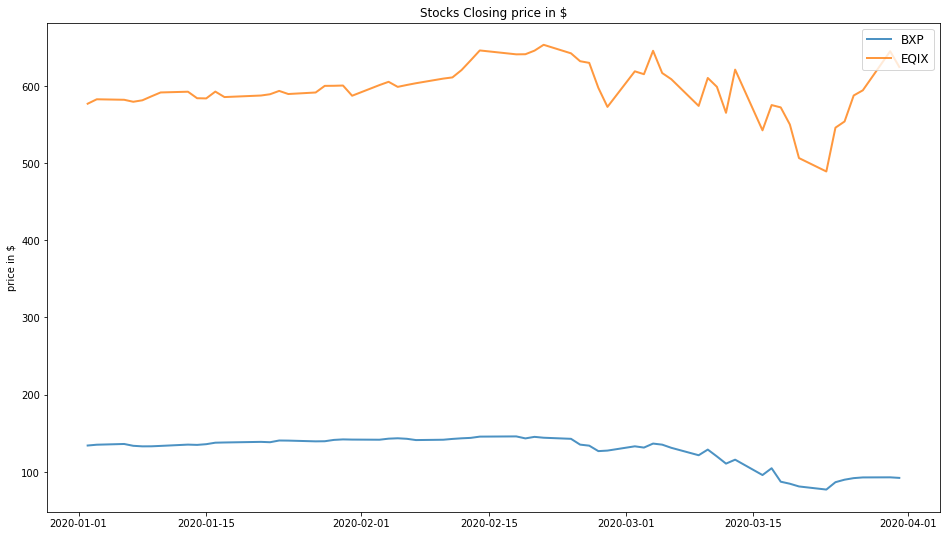

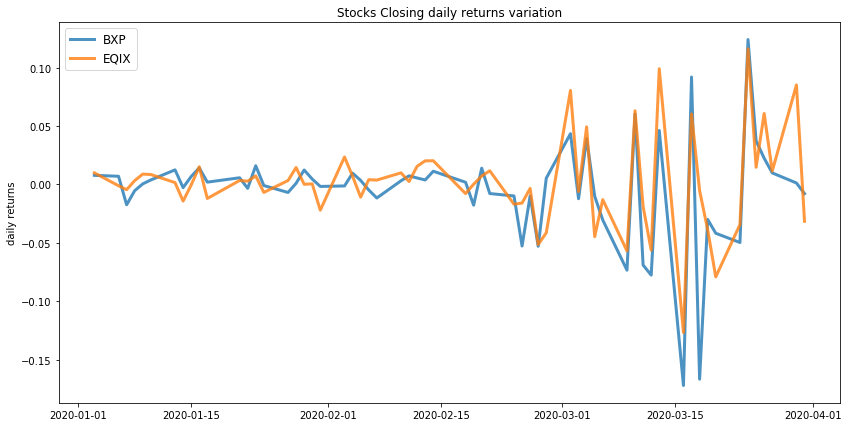

--------------------------------------------------------------------------------
Maximum Sharpe Ratio Portfolio Allocation

Annualised Return: 0.13
Annualised Volatility: 0.31


            BXP   EQIX
allocation  0.0  100.0
--------------------------------------------------------------------------------
Minimum Volatility Portfolio Allocation

Annualised Return: 0.02
Annualised Volatility: 0.31


              BXP   EQIX
allocation  25.19  74.81


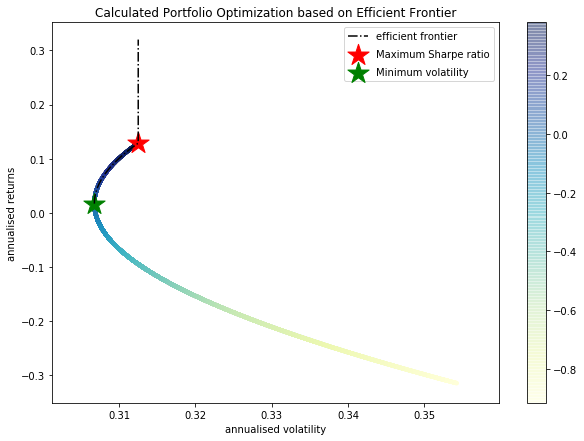

--------------------------------------------------------------------------------
Individual Stock Returns and Volatility

BXP : annuaised return -0.32 , annualised volatility: 0.35
EQIX : annuaised return 0.13 , annualised volatility: 0.31
--------------------------------------------------------------------------------


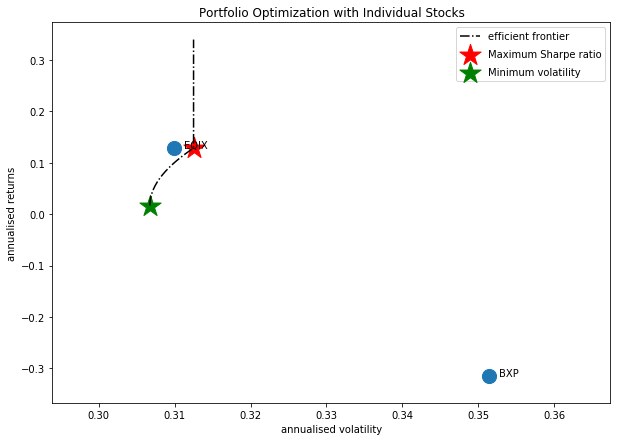

perform efficient_frontier_stock_portfolio Pairs of the companies we got ['AMZN', 'CTXS']


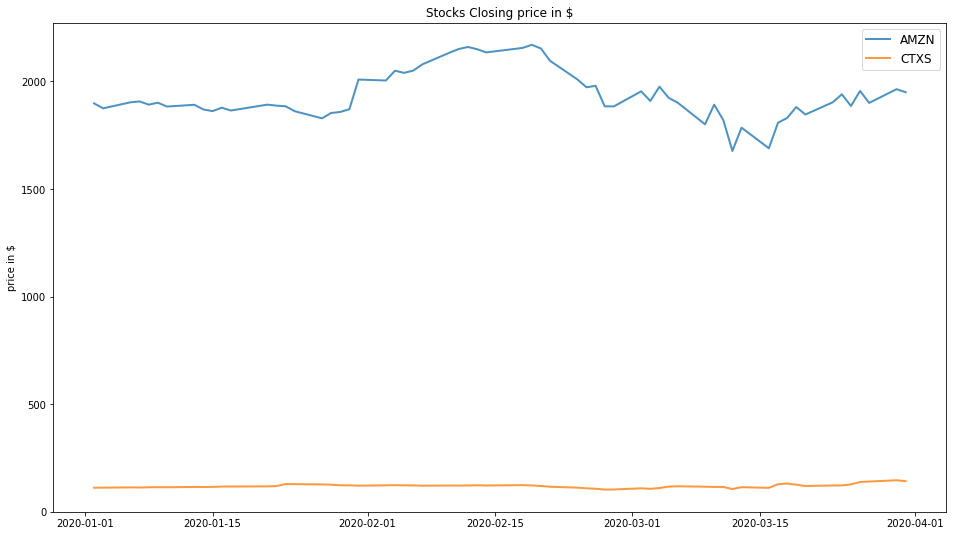

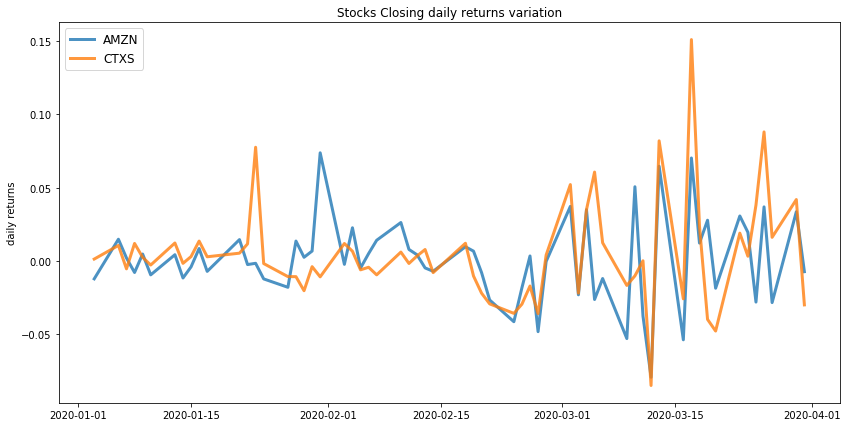

--------------------------------------------------------------------------------
Maximum Sharpe Ratio Portfolio Allocation

Annualised Return: 0.28
Annualised Volatility: 0.28


            AMZN   CTXS
allocation   0.0  100.0
--------------------------------------------------------------------------------
Minimum Volatility Portfolio Allocation

Annualised Return: 0.12
Annualised Volatility: 0.22


             AMZN   CTXS
allocation  72.51  27.49


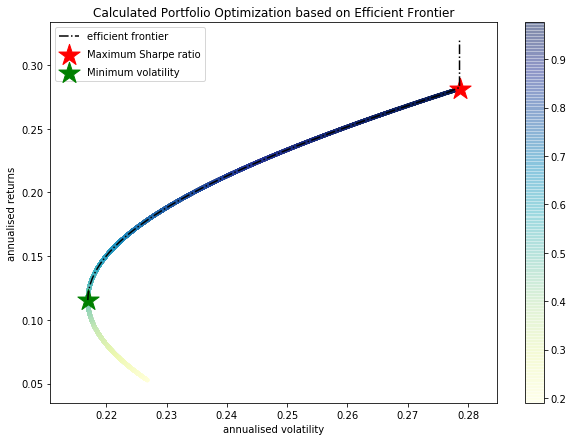

--------------------------------------------------------------------------------
Individual Stock Returns and Volatility

AMZN : annuaised return 0.05 , annualised volatility: 0.22
CTXS : annuaised return 0.28 , annualised volatility: 0.28
--------------------------------------------------------------------------------


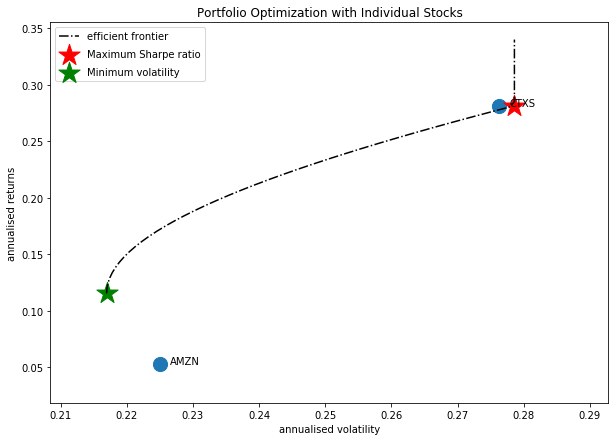

[[0.48191032767011616, 0.06, 0.11, ['EQIX', 'BLK'], array([[  0., 100.]]), '2018-04-01'], [2.0216826797934853, 0.38, 0.18, ['EQIX', 'AMD'], array([[73.06, 26.94]]), '2018-04-01'], [0.6621241369635111, 0.1, 0.14, ['AZO', 'BLK'], array([[100.,   0.]]), '2018-04-01'], [1.4797947116474717, 0.16, 0.1, ['AMZN', 'CMG'], array([[95.51,  4.49]]), '2018-07-01'], [1.6317567031446052, 0.15, 0.08, ['AZO', 'CMG'], array([[91.62,  8.38]]), '2018-07-01'], [0.18439895511659182, 0.04, 0.16, ['CMG', 'BLK'], array([[  0., 100.]]), '2018-07-01'], [0.5720921720594092, 0.1, 0.15, ['AZO', 'GOOG'], array([[100.,   0.]]), '2018-10-01'], [-0.8963456103259252, -0.13, 0.16, ['BLK', 'BKNG'], array([[100.,   0.]]), '2018-10-01'], [-0.9719786489720307, -0.12, 0.14, ['BLK', 'ALLE'], array([[100.,   0.]]), '2018-10-01'], [3.7372800402000035, 0.33, 0.09, ['BKNG', 'CMG', 'AZO'], array([[45.28,  6.71, 48.01]]), '2019-01-01'], [0.6781242777567857, 0.16, 0.22, ['BKNG', 'BHF'], array([[100.,   0.]]), '2019-01-01'], [1.174880

In [15]:
quarter_list=["2018-04-01", "2018-07-01", "2018-10-01", "2019-01-01", "2019-04-01", "2019-07-01", "2019-10-01", "2020-01-01", "2020-04-01"]
## Taken from
# https://www.treasury.gov/resource-center/data-chart-center/interest-rates/Pages/TextView.aspx?data=billRatesYear&year=2018
# 13 weeks period, COUPON EQUIVALENT, based on last possible date of each quarter
risk_free_rates = [1.93, 2.19, 2.45, 2.40, 2.13, 1.88, 1.55, 0.03]

returns_sharpe_company_list = []
for idx in range(1, len(quarter_list)):
    df_quarter_data = new_df[(new_df["start_date"] >= quarter_list[idx-1]) & (new_df["start_date"]< quarter_list[idx])]
    print("Companies listed in quarter {} which is between {} and {}".format(idx, quarter_list[idx-1], quarter_list[idx]))
    list_of_companies = df_quarter_data["symbol"].unique()
    #generate the stocks pairs which are uncorrelated and having covariance less than mean covariance 
    stocks_pair = get_portfolio_pairs(list_of_companies)
    #print(stocks_pair)
    for stock_list in stocks_pair:
        print("perform efficient_frontier_stock_portfolio Pairs of the companies we got {}".format(stock_list))
        pos_sharpe, Annualised_Return, Annualised_Volatility, allocation_weights = efficient_frontier_stock_portfolio(stock_list, len(stock_list), risk_free_rates[idx-1], quarter_list[idx-1], quarter_list[idx])
        returns_sharpe_company_list.append([pos_sharpe, Annualised_Return, Annualised_Volatility, stock_list, allocation_weights, quarter_list[idx-1]])
print(returns_sharpe_company_list)

In [16]:
shortlisted_portfolio_df = pd.DataFrame(returns_sharpe_company_list)

In [17]:
shortlisted_portfolio_df.columns = ["Sharpe Ratio", "Portfolio Annualised Return", "Portfolio Annualised_Volatility", "Stock Portfolio", "Stocks Weight Allocation", "Quarter Start Date"]

### we know that higher the sharpe ratio value the stocks have a good returns with consideration of the risk in  the investment and for the portfolio we tag quantitative values such as below for the portfolio generated:

#### Sharpe Ratio >=  3 ---> "Excellent Portfolio"

#### Sharpe Ratio >=  2 ---> "Very Good Portfolio"

#### Sharpe Ratio >= 1 ---> "Good Portfolio"

#### Sharpe Ratio < 1 ---> "Bad Portfolio"

In [18]:
# creating a blank series 
Portfolio_Tag = pd.Series([]) 

for row in range(len(shortlisted_portfolio_df)):
    if (shortlisted_portfolio_df["Sharpe Ratio"][row] >= 3):
        Portfolio_Tag[row] = "Excellent"
    elif (shortlisted_portfolio_df["Sharpe Ratio"][row] >= 2 and (shortlisted_portfolio_df["Sharpe Ratio"][row] < 3)):
        Portfolio_Tag[row] = "Very Good"
    elif ((shortlisted_portfolio_df["Sharpe Ratio"][row] >= 1)  and (shortlisted_portfolio_df["Sharpe Ratio"][row] < 2)):
        Portfolio_Tag[row] = "Good"
    else:
        Portfolio_Tag[row] = "Bad"
        
# inserting new column with values of list made above         
shortlisted_portfolio_df.insert(5, "Portfolio Tag", Portfolio_Tag) 

## Possible combinations of the company from which we will take the final Portfolio list

In [19]:
shortlisted_portfolio_df

,Sharpe Ratio,Portfolio Annualised Return,Portfolio Annualised_Volatility,Stock Portfolio,Stocks Weight Allocation,Portfolio Tag,Quarter Start Date
0,0.481910,0.06,0.11,"[EQIX, BLK]","[[0.0, 100.0]]",Bad,2018-04-01
1,2.021683,0.38,0.18,"[EQIX, AMD]","[[73.06, 26.94]]",Very Good,2018-04-01
2,0.662124,0.10,0.14,"[AZO, BLK]","[[100.0, 0.0]]",Bad,2018-04-01
3,1.479795,0.16,0.10,"[AMZN, CMG]","[[95.51, 4.49]]",Good,2018-07-01
4,1.631757,0.15,0.08,"[AZO, CMG]","[[91.62, 8.38]]",Good,2018-07-01
5,0.184399,0.04,0.16,"[CMG, BLK]","[[0.0, 100.0]]",Bad,2018-07-01
6,0.572092,0.10,0.15,"[AZO, GOOG]","[[100.0, 0.0]]",Bad,2018-10-01
7,-0.896346,-0.13,0.16,"[BLK, BKNG]","[[100.0, 0.0]]",Bad,2018-10-01
8,-0.971979,-0.12,0.14,"[BLK, ALLE]","[[100.0, 0.0]]",Bad,2018-10-01
9,3.737280,0.33,0.09,"[BKNG, CMG, AZO]","[[45.28, 6.71, 48.01]]",Excellent,2019-01-01


In [20]:
shortlisted_portfolio = shortlisted_portfolio_df[(shortlisted_portfolio_df["Portfolio Tag"] == "Excellent") | (shortlisted_portfolio_df["Portfolio Tag"] == "Very Good") |
                                                    (shortlisted_portfolio_df["Portfolio Tag"] == "Good")]

In [21]:
shortlisted_portfolio = shortlisted_portfolio.sort_values(by="Sharpe Ratio", ascending=False)

In [22]:
shortlisted_portfolio

,Sharpe Ratio,Portfolio Annualised Return,Portfolio Annualised_Volatility,Stock Portfolio,Stocks Weight Allocation,Portfolio Tag,Quarter Start Date
9,3.737280,0.33,0.09,"[BKNG, CMG, AZO]","[[45.28, 6.71, 48.01]]",Excellent,2019-01-01
22,3.194284,0.45,0.14,"[BIIB, AMD]","[[80.59, 19.41]]",Excellent,2019-10-01
1,2.021683,0.38,0.18,"[EQIX, AMD]","[[73.06, 26.94]]",Very Good,2018-04-01
21,2.009201,0.18,0.09,"[BIIB, BLK]","[[15.09, 84.91]]",Very Good,2019-10-01
20,1.674265,0.14,0.08,"[BIIB, EQIX, GOOGL]","[[15.77, 3.96, 80.26]]",Good,2019-10-01
4,1.631757,0.15,0.08,"[AZO, CMG]","[[91.62, 8.38]]",Good,2018-07-01
3,1.479795,0.16,0.10,"[AMZN, CMG]","[[95.51, 4.49]]",Good,2018-07-01
14,1.462201,0.25,0.17,"[BKNG, BIIB, AMZN, APC]","[[15.71, 43.85, 0.0, 40.45]]",Good,2019-04-01
18,1.209055,0.15,0.11,"[EQIX, BLK]","[[0.0, 100.0]]",Good,2019-07-01
11,1.174881,0.10,0.08,"[EQIX, BKNG, BIIB, AMZN, BDX]","[[0.0, 0.0, 0.0, 22.96, 77.04]]",Good,2019-04-01


# Top 5 stock portfolios to be taken from the data (User to choose)

In [23]:
shortlisted_portfolio[:5]

,Sharpe Ratio,Portfolio Annualised Return,Portfolio Annualised_Volatility,Stock Portfolio,Stocks Weight Allocation,Portfolio Tag,Quarter Start Date
9,3.737280,0.33,0.09,"[BKNG, CMG, AZO]","[[45.28, 6.71, 48.01]]",Excellent,2019-01-01
22,3.194284,0.45,0.14,"[BIIB, AMD]","[[80.59, 19.41]]",Excellent,2019-10-01
1,2.021683,0.38,0.18,"[EQIX, AMD]","[[73.06, 26.94]]",Very Good,2018-04-01
21,2.009201,0.18,0.09,"[BIIB, BLK]","[[15.09, 84.91]]",Very Good,2019-10-01
20,1.674265,0.14,0.08,"[BIIB, EQIX, GOOGL]","[[15.77, 3.96, 80.26]]",Good,2019-10-01


## portfolio generated quarterwise from 2018 - 2020

In [24]:
shortlisted_portfolio_quarterwise_max_df = shortlisted_portfolio_df.groupby("Quarter Start Date")["Sharpe Ratio"].max().reset_index()

In [25]:
portfolio_quarterwise_max = pd.merge(left=shortlisted_portfolio_quarterwise_max_df, right=shortlisted_portfolio_df,left_on='Sharpe Ratio', right_on='Sharpe Ratio').drop(["Quarter Start Date_y"], axis=1)

In [26]:
portfolio_quarterwise_max

,Quarter Start Date_x,Sharpe Ratio,Portfolio Annualised Return,Portfolio Annualised_Volatility,Stock Portfolio,Stocks Weight Allocation,Portfolio Tag
0,2018-04-01,2.021683,0.38,0.18,"[EQIX, AMD]","[[73.06, 26.94]]",Very Good
1,2018-07-01,1.631757,0.15,0.08,"[AZO, CMG]","[[91.62, 8.38]]",Good
2,2018-10-01,0.572092,0.10,0.15,"[AZO, GOOG]","[[100.0, 0.0]]",Bad
3,2019-01-01,3.737280,0.33,0.09,"[BKNG, CMG, AZO]","[[45.28, 6.71, 48.01]]",Excellent
4,2019-04-01,1.462201,0.25,0.17,"[BKNG, BIIB, AMZN, APC]","[[15.71, 43.85, 0.0, 40.45]]",Good
5,2019-07-01,1.209055,0.15,0.11,"[EQIX, BLK]","[[0.0, 100.0]]",Good
6,2019-10-01,3.194284,0.45,0.14,"[BIIB, AMD]","[[80.59, 19.41]]",Excellent
7,2020-01-01,0.976113,0.28,0.28,"[EQIX, CTXS]","[[100.0, 0.0]]",Bad
8,2020-01-01,0.976113,0.28,0.28,"[AMZN, CTXS]","[[0.0, 100.0]]",Bad


## portfolio generated for the shortlisted companies for overall 2 yr period

In [27]:
portfolio_list

array(['EQIX', 'AMZN', 'AZO', 'CMG', 'BKNG', 'SHW', 'BIIB', 'BLK', 'BA',
       'BDX', 'ADSK', 'AMD', 'BHF', 'NEM', 'COTY', 'APC', 'CSX', 'DHI',
       'GOOGL', 'DVN', 'CTXS', 'ALLE', 'GOOG', 'BXP'], dtype=object)

['EQIX' 'AMZN' 'AZO' 'CMG' 'BKNG' 'SHW' 'BIIB' 'BLK' 'BA' 'BDX' 'ADSK'
 'AMD' 'BHF' 'NEM' 'COTY' 'APC' 'CSX' 'DHI' 'GOOGL' 'DVN' 'CTXS' 'ALLE'
 'GOOG' 'BXP']
perform efficient_frontier_stock_portfolio Pairs of the companies we got ['EQIX', 'SHW']


/home/abhishek/anaconda3/anaconda/lib/python3.7/site-packages/ipykernel_launcher.py:184: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



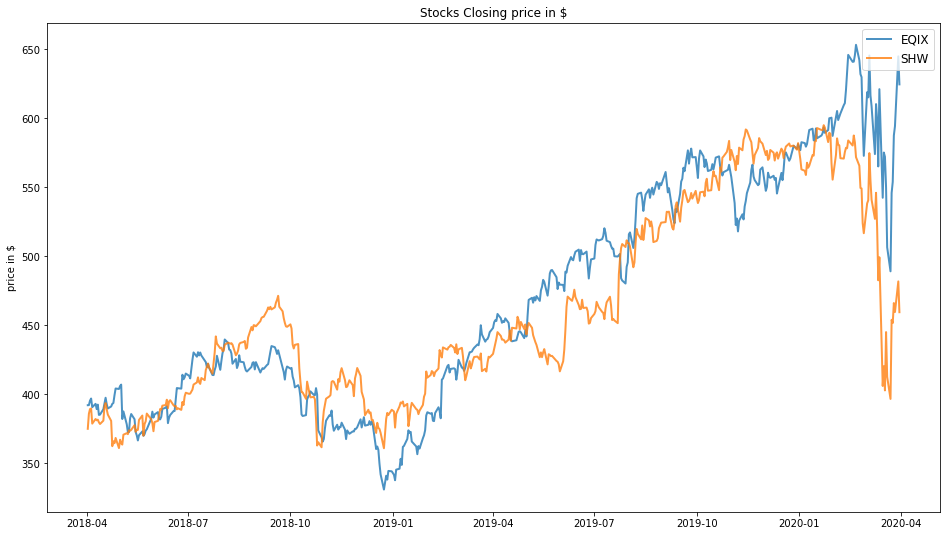

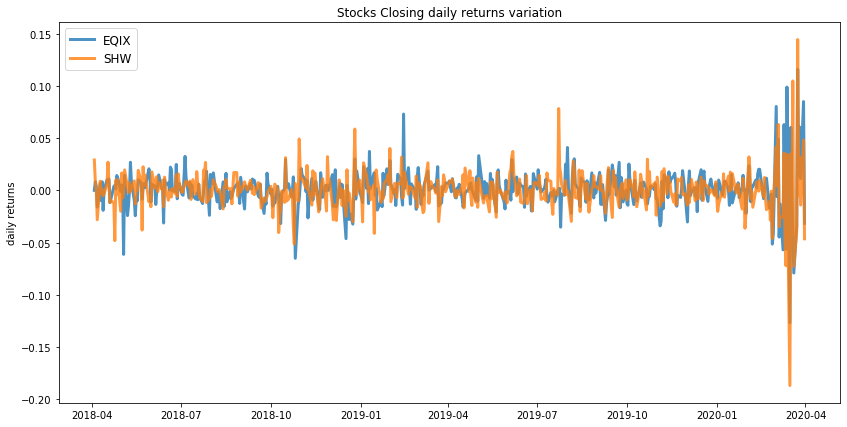

--------------------------------------------------------------------------------
Maximum Sharpe Ratio Portfolio Allocation

Annualised Return: 0.56
Annualised Volatility: 0.42


             EQIX  SHW
allocation  100.0  0.0
--------------------------------------------------------------------------------
Minimum Volatility Portfolio Allocation

Annualised Return: 0.44
Annualised Volatility: 0.38


             EQIX    SHW
allocation  55.55  44.45


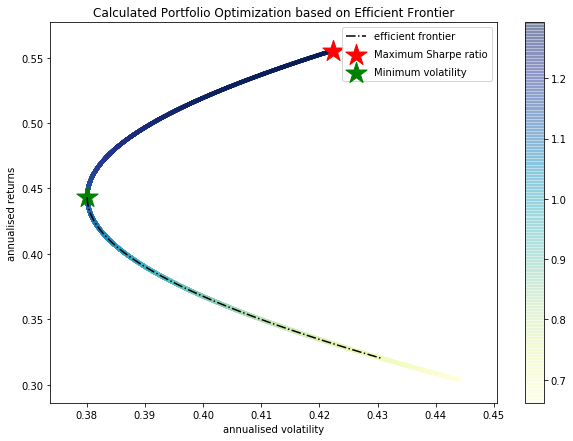

--------------------------------------------------------------------------------
Individual Stock Returns and Volatility

EQIX : annuaised return 0.56 , annualised volatility: 0.42
SHW : annuaised return 0.3 , annualised volatility: 0.44
--------------------------------------------------------------------------------


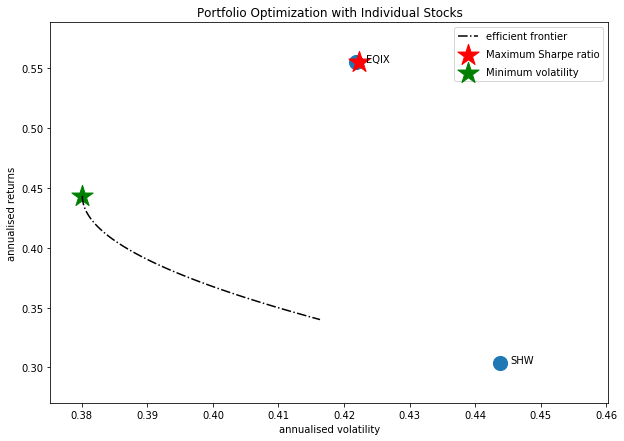

perform efficient_frontier_stock_portfolio Pairs of the companies we got ['EQIX', 'DHI']


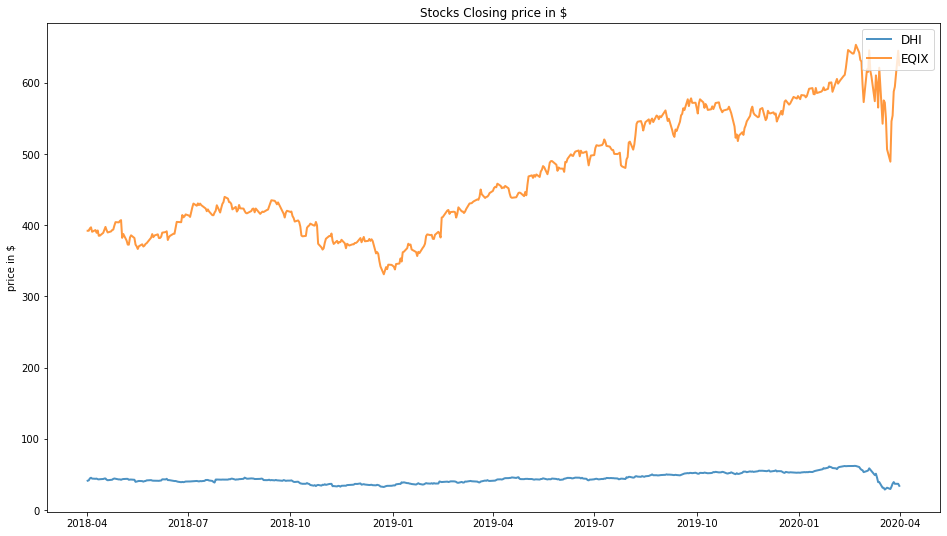

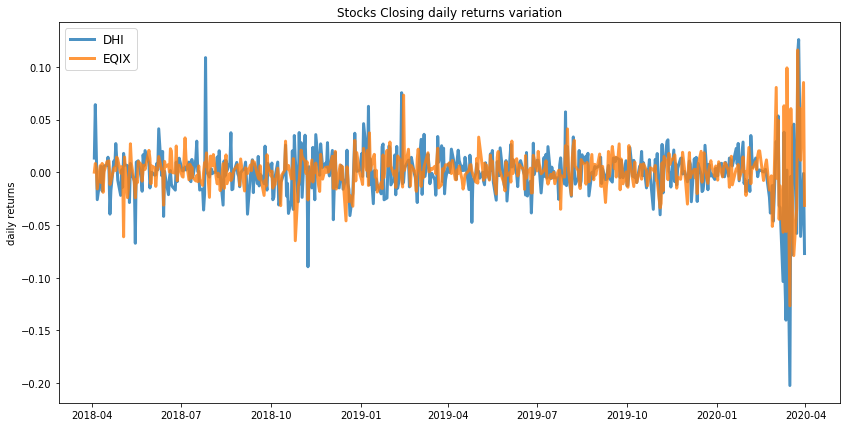

--------------------------------------------------------------------------------
Maximum Sharpe Ratio Portfolio Allocation

Annualised Return: 0.56
Annualised Volatility: 0.42


            DHI   EQIX
allocation  0.0  100.0
--------------------------------------------------------------------------------
Minimum Volatility Portfolio Allocation

Annualised Return: 0.39
Annualised Volatility: 0.4


              DHI   EQIX
allocation  27.48  72.52


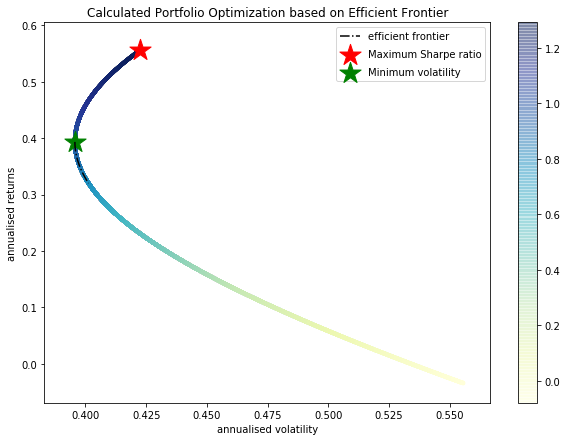

--------------------------------------------------------------------------------
Individual Stock Returns and Volatility

DHI : annuaised return -0.03 , annualised volatility: 0.55
EQIX : annuaised return 0.56 , annualised volatility: 0.42
--------------------------------------------------------------------------------


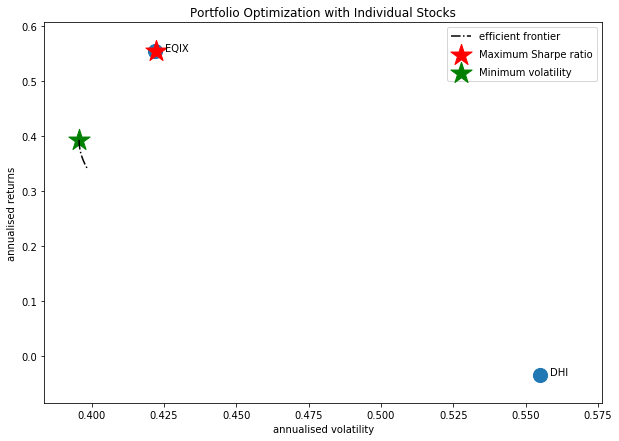

perform efficient_frontier_stock_portfolio Pairs of the companies we got ['EQIX', 'GOOG']


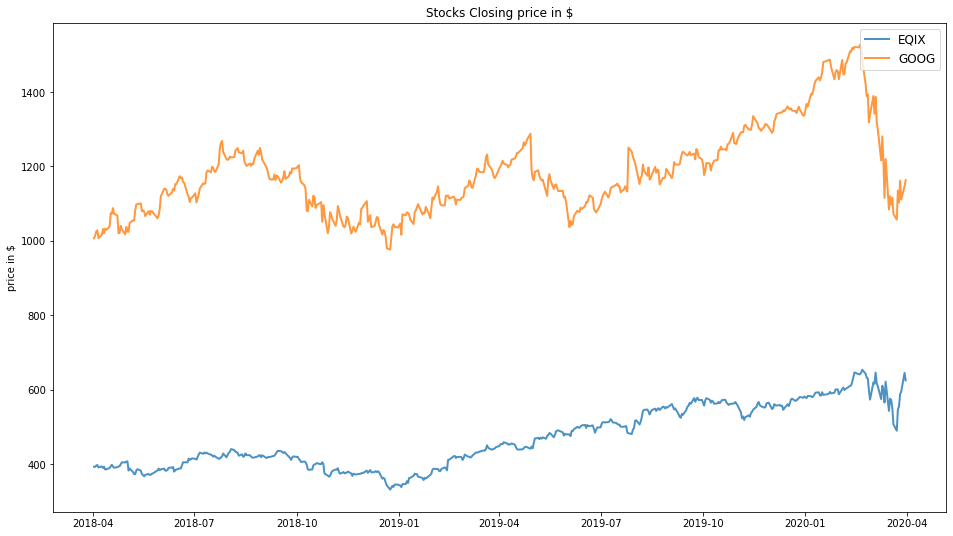

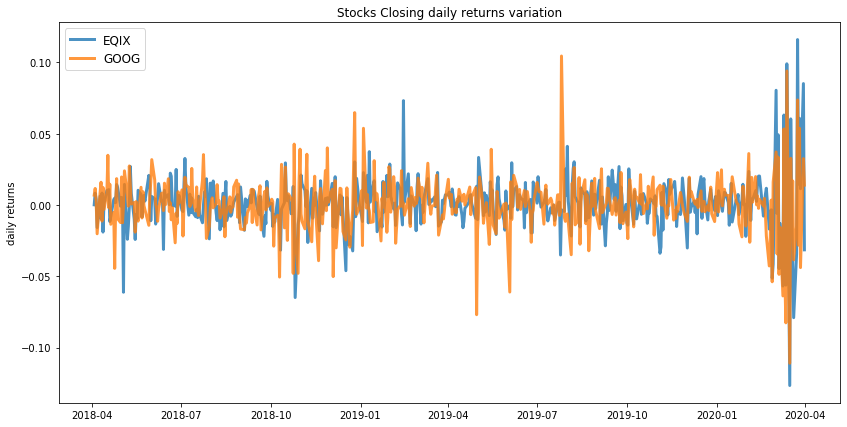

--------------------------------------------------------------------------------
Maximum Sharpe Ratio Portfolio Allocation

Annualised Return: 0.56
Annualised Volatility: 0.42


             EQIX  GOOG
allocation  100.0   0.0
--------------------------------------------------------------------------------
Minimum Volatility Portfolio Allocation

Annualised Return: 0.4
Annualised Volatility: 0.37


             EQIX   GOOG
allocation  51.67  48.33


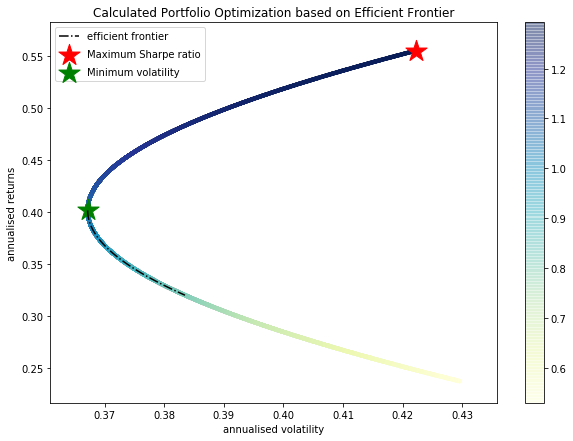

--------------------------------------------------------------------------------
Individual Stock Returns and Volatility

EQIX : annuaised return 0.56 , annualised volatility: 0.42
GOOG : annuaised return 0.24 , annualised volatility: 0.43
--------------------------------------------------------------------------------


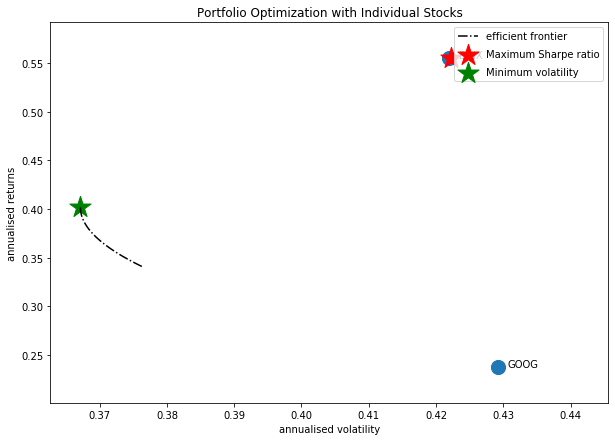

perform efficient_frontier_stock_portfolio Pairs of the companies we got ['AMZN', 'CMG', 'BDX', 'BHF', 'NEM']


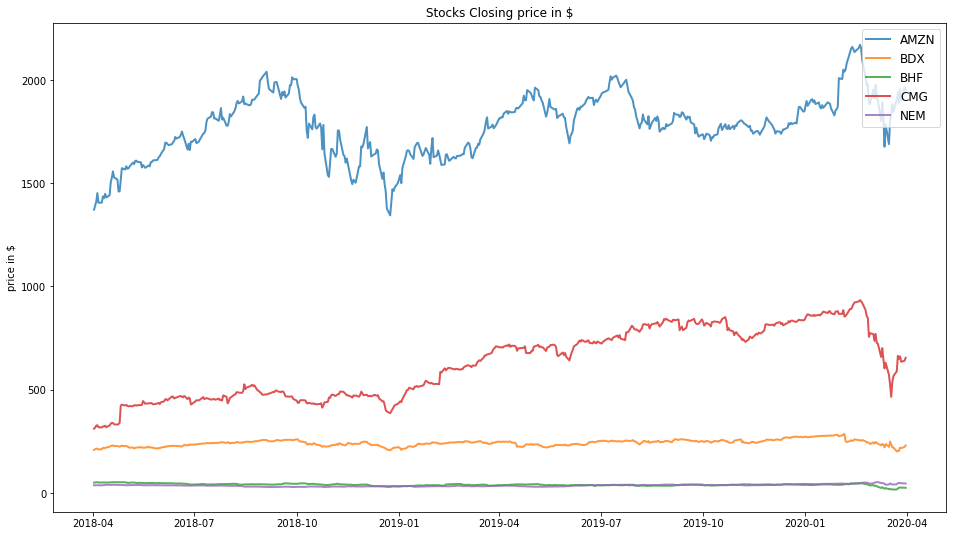

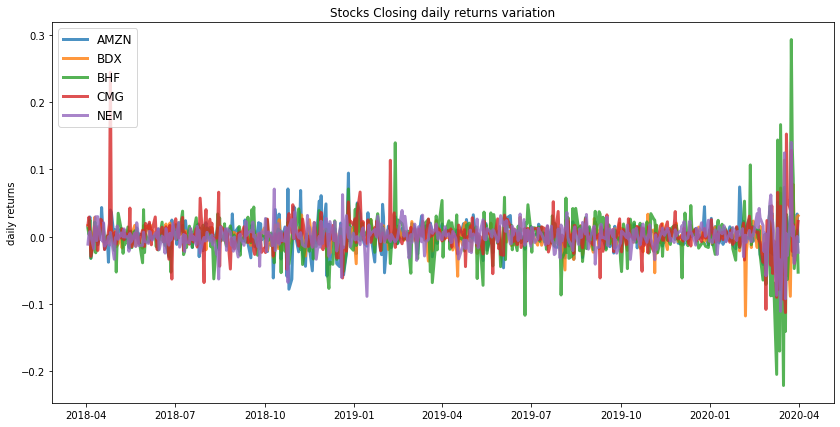

--------------------------------------------------------------------------------
Maximum Sharpe Ratio Portfolio Allocation

Annualised Return: 0.65
Annualised Volatility: 0.38


             AMZN  BDX  BHF    CMG    NEM
allocation  22.98  0.0  0.0  52.44  24.58
--------------------------------------------------------------------------------
Minimum Volatility Portfolio Allocation

Annualised Return: 0.36
Annualised Volatility: 0.28


             AMZN    BDX  BHF    CMG    NEM
allocation  18.28  36.98  0.0  12.19  32.54


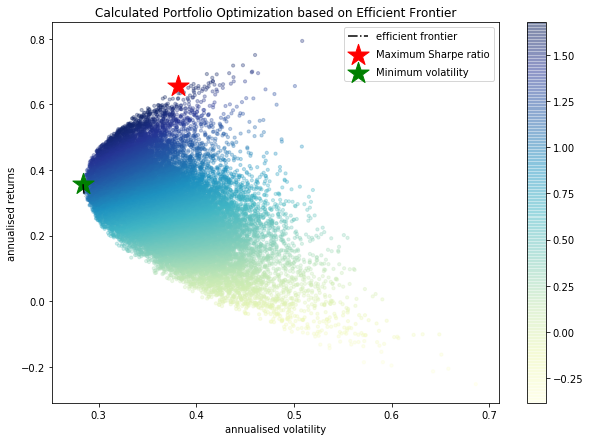

--------------------------------------------------------------------------------
Individual Stock Returns and Volatility

AMZN : annuaised return 0.46 , annualised volatility: 0.45
BDX : annuaised return 0.17 , annualised volatility: 0.38
BHF : annuaised return -0.41 , annualised volatility: 0.8
CMG : annuaised return 0.91 , annualised volatility: 0.58
NEM : annuaised return 0.3 , annualised volatility: 0.46
--------------------------------------------------------------------------------


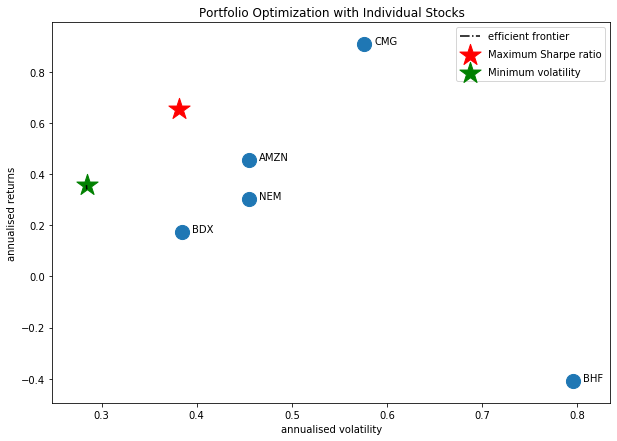

perform efficient_frontier_stock_portfolio Pairs of the companies we got ['AMZN', 'BKNG', 'BDX', 'BHF', 'NEM']


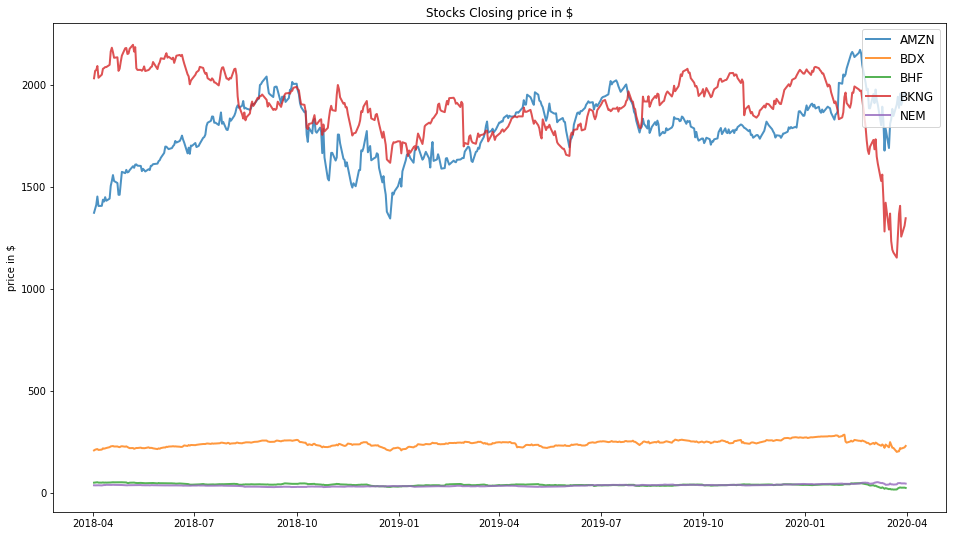

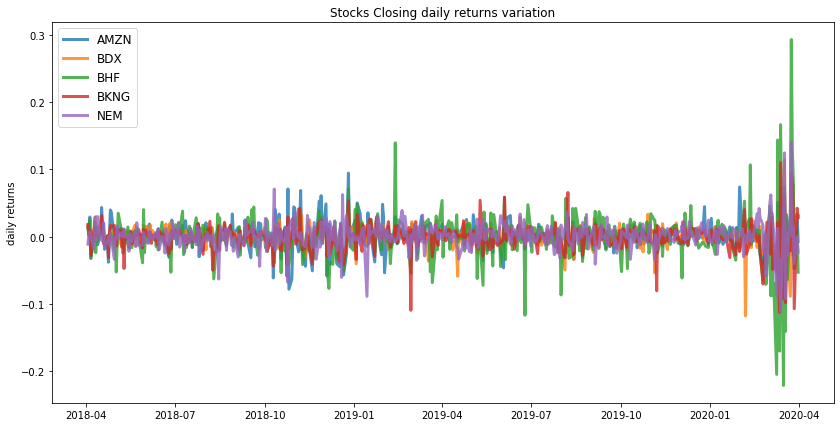

--------------------------------------------------------------------------------
Maximum Sharpe Ratio Portfolio Allocation

Annualised Return: 0.4
Annualised Volatility: 0.34


             AMZN  BDX  BHF  BKNG    NEM
allocation  61.51  0.0  0.0   0.0  38.49
--------------------------------------------------------------------------------
Minimum Volatility Portfolio Allocation

Annualised Return: 0.23
Annualised Volatility: 0.29


             AMZN    BDX  BHF   BKNG   NEM
allocation  20.79  34.91  0.0  10.01  34.3


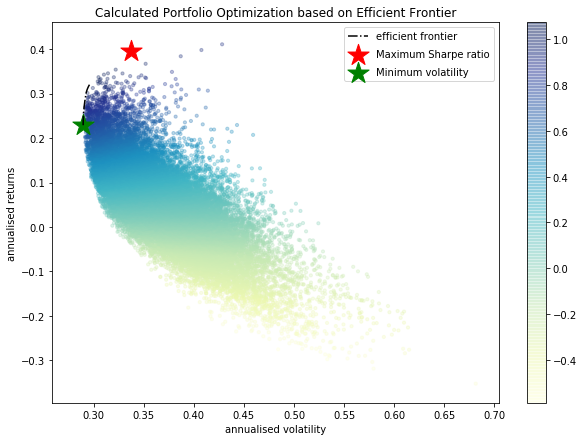

--------------------------------------------------------------------------------
Individual Stock Returns and Volatility

AMZN : annuaised return 0.46 , annualised volatility: 0.45
BDX : annuaised return 0.17 , annualised volatility: 0.38
BHF : annuaised return -0.41 , annualised volatility: 0.8
BKNG : annuaised return -0.3 , annualised volatility: 0.47
NEM : annuaised return 0.3 , annualised volatility: 0.46
--------------------------------------------------------------------------------


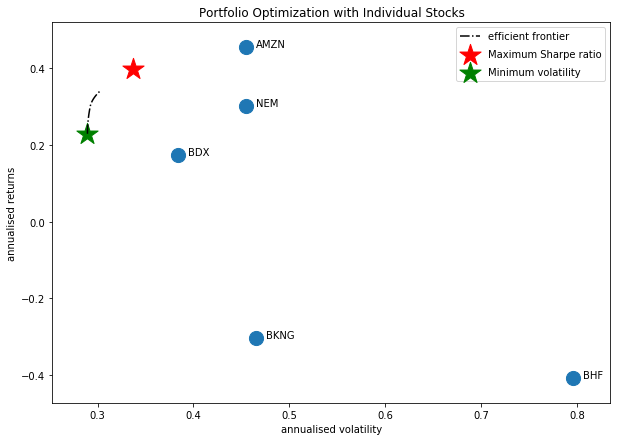

perform efficient_frontier_stock_portfolio Pairs of the companies we got ['AMZN', 'CMG', 'BKNG', 'SHW', 'BLK', 'BDX', 'NEM']


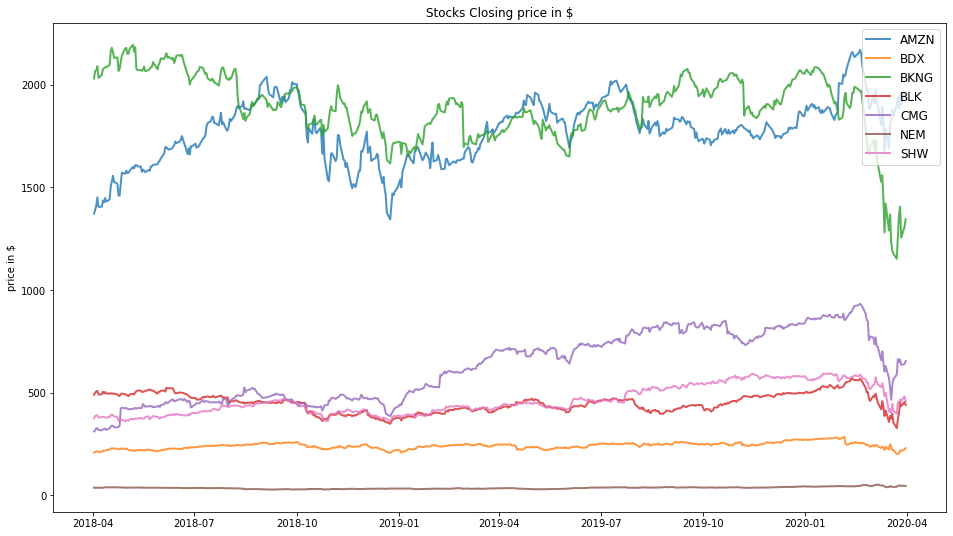

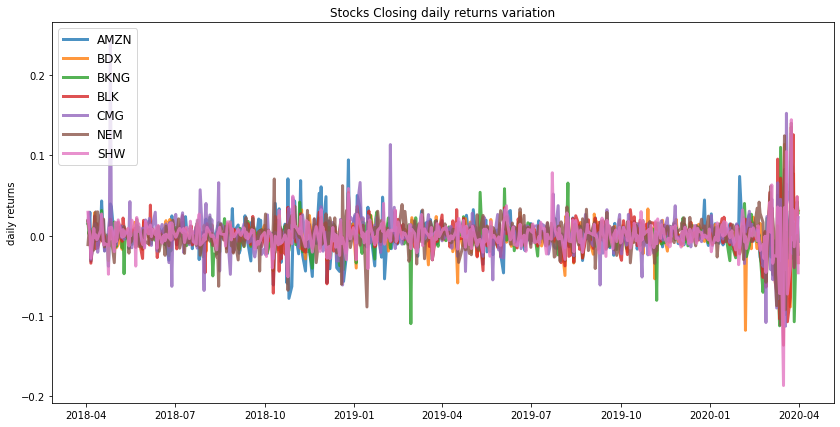

--------------------------------------------------------------------------------
Maximum Sharpe Ratio Portfolio Allocation

Annualised Return: 0.65
Annualised Volatility: 0.38


             AMZN  BDX  BKNG  BLK    CMG    NEM  SHW
allocation  23.02  0.0   0.0  0.0  52.43  24.56  0.0
--------------------------------------------------------------------------------
Minimum Volatility Portfolio Allocation

Annualised Return: 0.32
Annualised Volatility: 0.28


             AMZN    BDX  BKNG  BLK   CMG    NEM   SHW
allocation  14.88  32.32   4.7  0.0  9.98  30.59  7.53


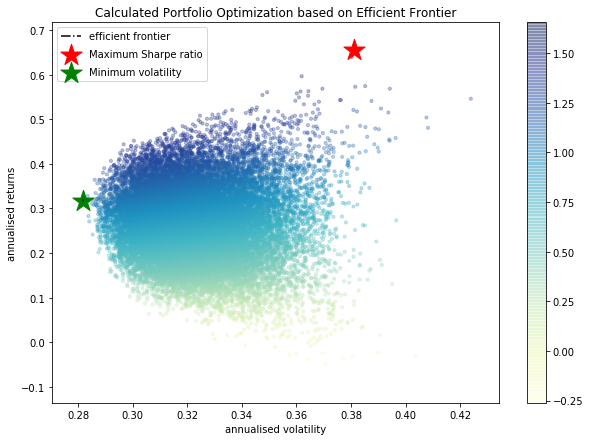

--------------------------------------------------------------------------------
Individual Stock Returns and Volatility

AMZN : annuaised return 0.46 , annualised volatility: 0.45
BDX : annuaised return 0.17 , annualised volatility: 0.38
BKNG : annuaised return -0.3 , annualised volatility: 0.47
BLK : annuaised return 0.01 , annualised volatility: 0.49
CMG : annuaised return 0.91 , annualised volatility: 0.58
NEM : annuaised return 0.3 , annualised volatility: 0.46
SHW : annuaised return 0.3 , annualised volatility: 0.44
--------------------------------------------------------------------------------


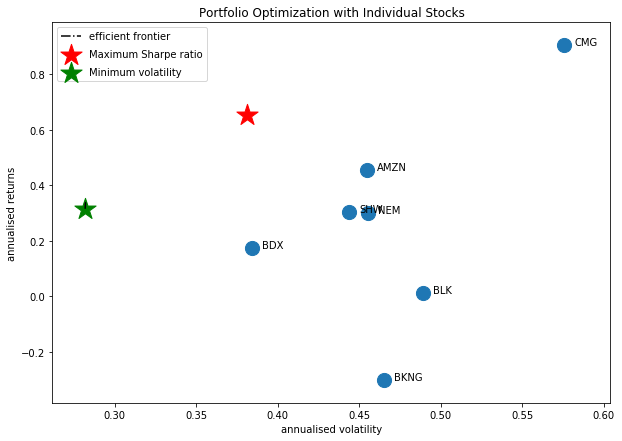

perform efficient_frontier_stock_portfolio Pairs of the companies we got ['AMZN', 'GOOG']


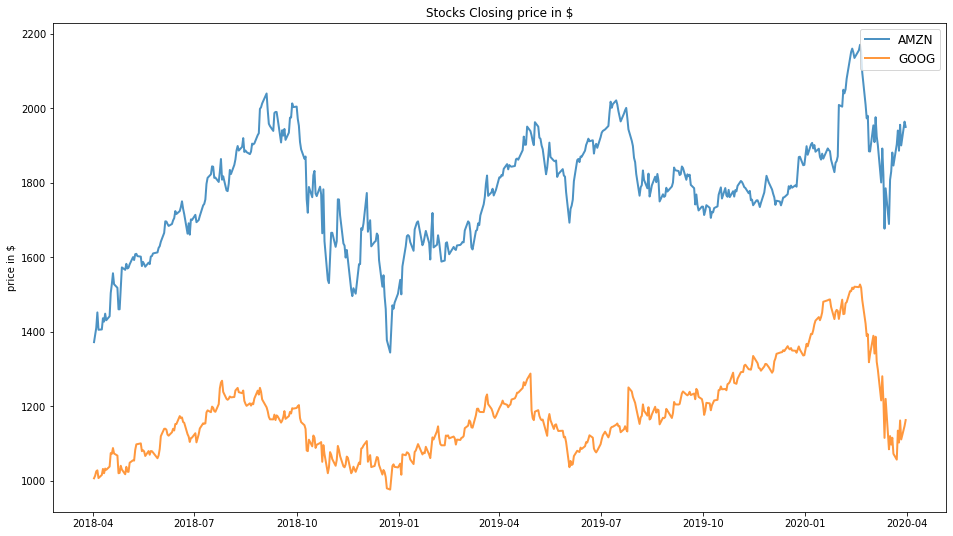

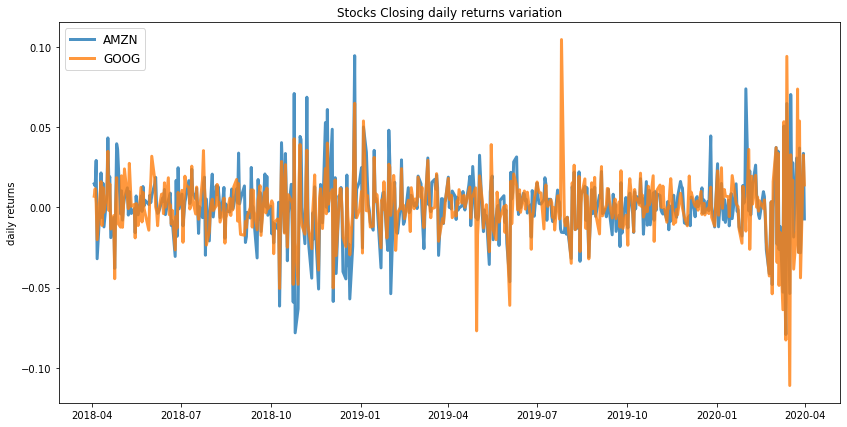

--------------------------------------------------------------------------------
Maximum Sharpe Ratio Portfolio Allocation

Annualised Return: 0.46
Annualised Volatility: 0.46


             AMZN  GOOG
allocation  100.0   0.0
--------------------------------------------------------------------------------
Minimum Volatility Portfolio Allocation

Annualised Return: 0.32
Annualised Volatility: 0.41


             AMZN   GOOG
allocation  39.69  60.31


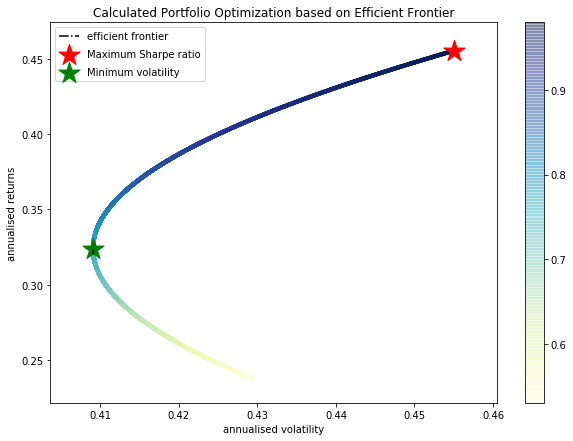

--------------------------------------------------------------------------------
Individual Stock Returns and Volatility

AMZN : annuaised return 0.46 , annualised volatility: 0.45
GOOG : annuaised return 0.24 , annualised volatility: 0.43
--------------------------------------------------------------------------------


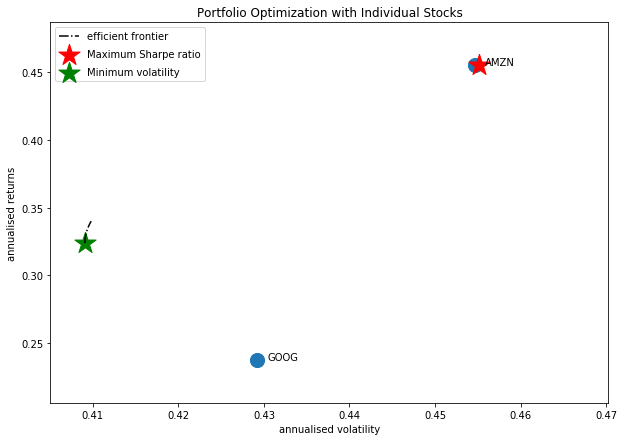

perform efficient_frontier_stock_portfolio Pairs of the companies we got ['CMG', 'SHW', 'BLK', 'BDX', 'NEM']


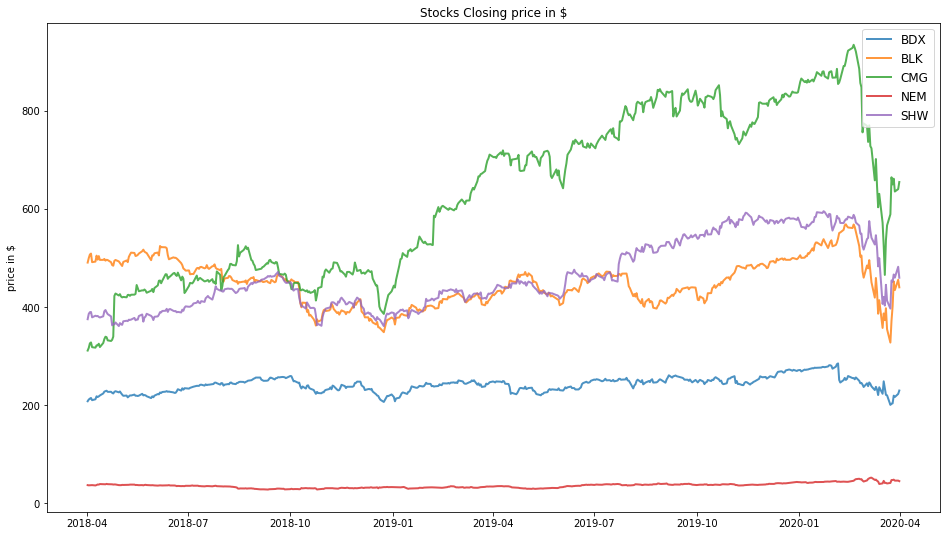

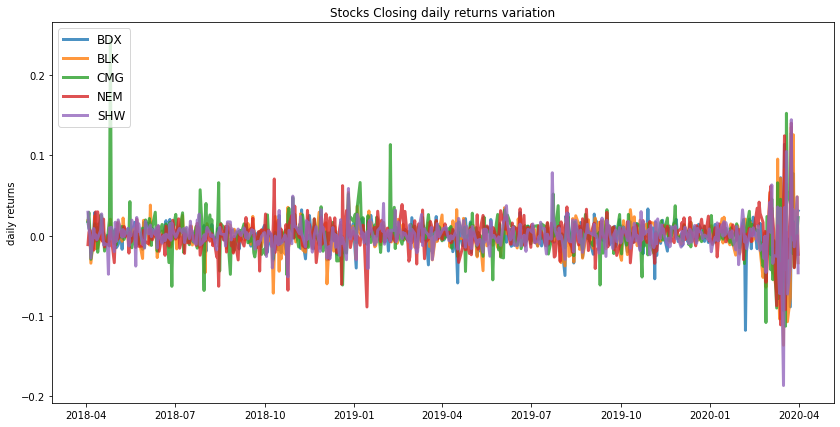

--------------------------------------------------------------------------------
Maximum Sharpe Ratio Portfolio Allocation

Annualised Return: 0.69
Annualised Volatility: 0.42


             BDX  BLK    CMG    NEM  SHW
allocation  6.19  0.0  66.19  27.62  0.0
--------------------------------------------------------------------------------
Minimum Volatility Portfolio Allocation

Annualised Return: 0.33
Annualised Volatility: 0.29


             BDX  BLK    CMG    NEM    SHW
allocation  41.7  0.0  14.12  31.22  12.97


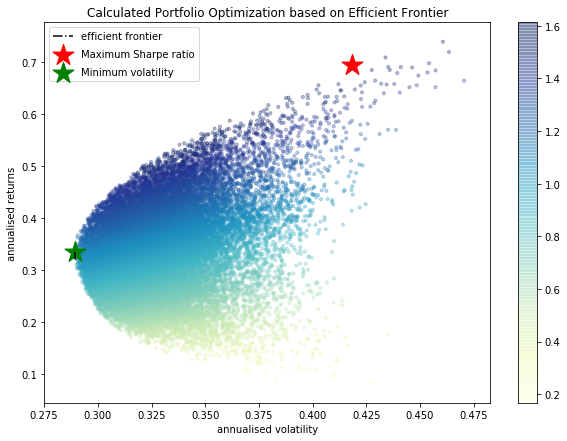

--------------------------------------------------------------------------------
Individual Stock Returns and Volatility

BDX : annuaised return 0.17 , annualised volatility: 0.38
BLK : annuaised return 0.01 , annualised volatility: 0.49
CMG : annuaised return 0.91 , annualised volatility: 0.58
NEM : annuaised return 0.3 , annualised volatility: 0.46
SHW : annuaised return 0.3 , annualised volatility: 0.44
--------------------------------------------------------------------------------


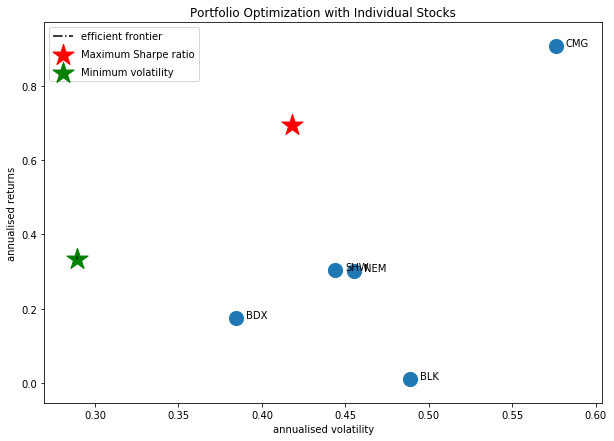

perform efficient_frontier_stock_portfolio Pairs of the companies we got ['BDX', 'CMG', 'BHF', 'NEM']


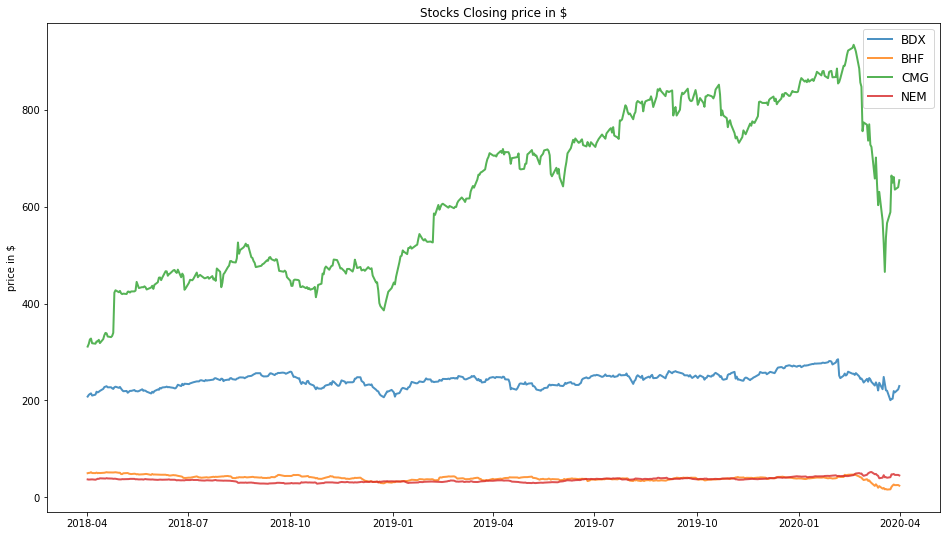

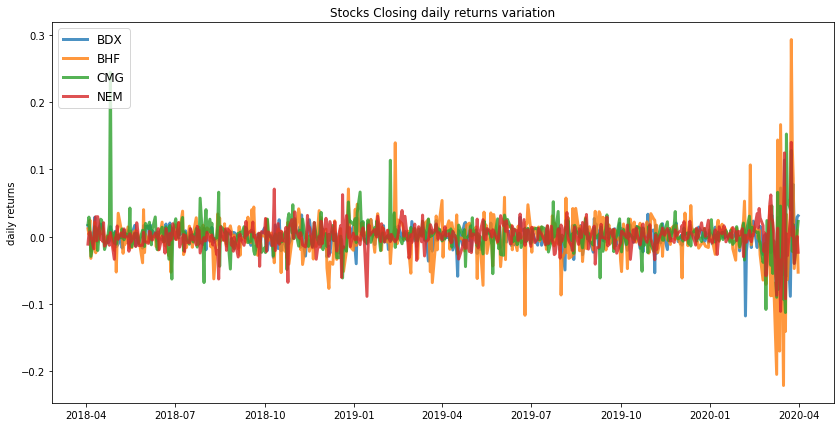

--------------------------------------------------------------------------------
Maximum Sharpe Ratio Portfolio Allocation

Annualised Return: 0.69
Annualised Volatility: 0.42


             BDX  BHF    CMG    NEM
allocation  6.19  0.0  66.19  27.62
--------------------------------------------------------------------------------
Minimum Volatility Portfolio Allocation

Annualised Return: 0.35
Annualised Volatility: 0.29


             BDX  BHF    CMG    NEM
allocation  48.2  0.0  17.61  34.19


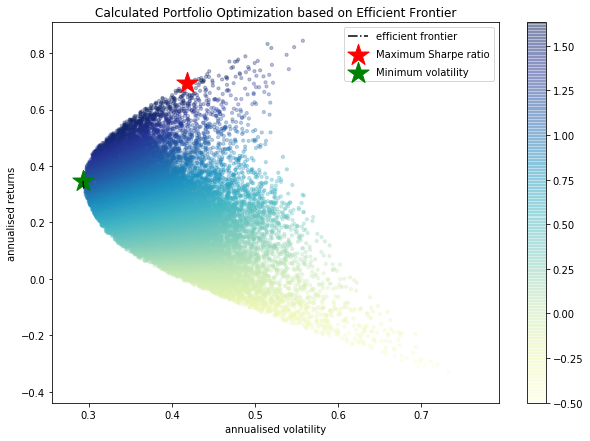

--------------------------------------------------------------------------------
Individual Stock Returns and Volatility

BDX : annuaised return 0.17 , annualised volatility: 0.38
BHF : annuaised return -0.41 , annualised volatility: 0.8
CMG : annuaised return 0.91 , annualised volatility: 0.58
NEM : annuaised return 0.3 , annualised volatility: 0.46
--------------------------------------------------------------------------------


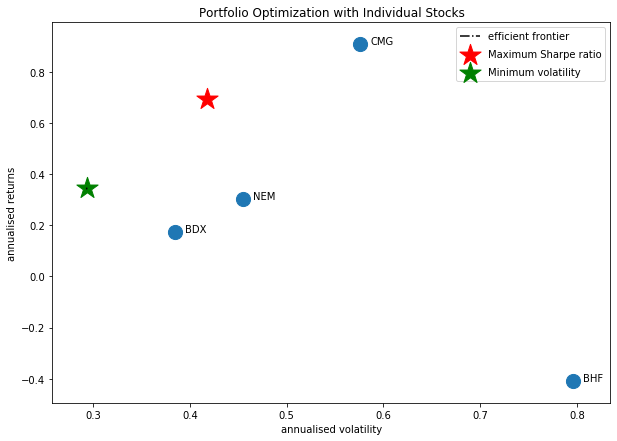

perform efficient_frontier_stock_portfolio Pairs of the companies we got ['CMG', 'COTY']


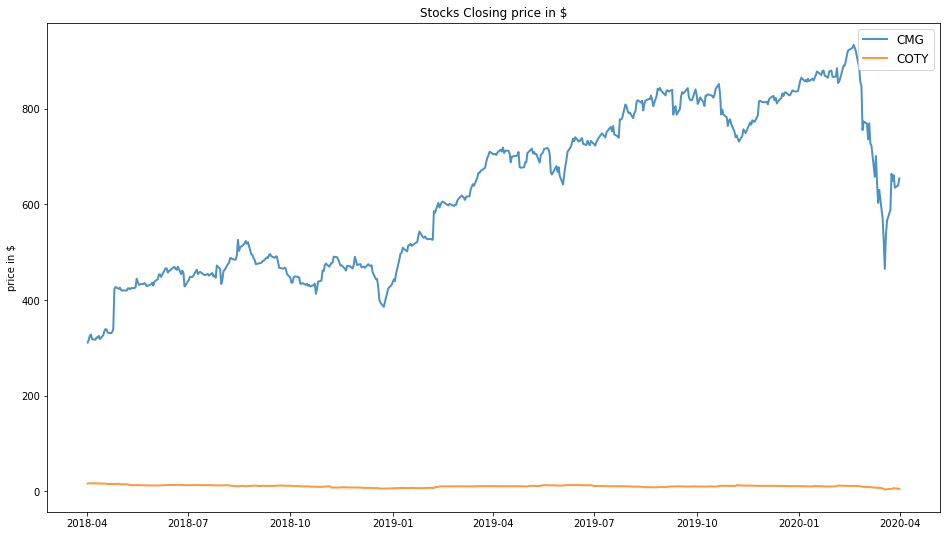

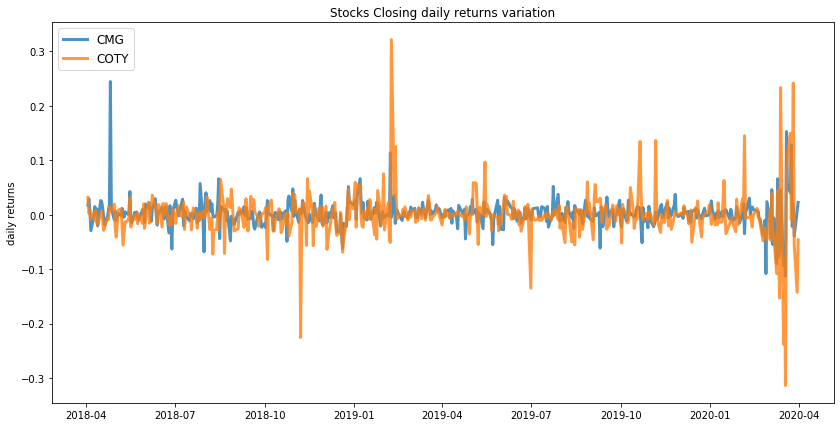

--------------------------------------------------------------------------------
Maximum Sharpe Ratio Portfolio Allocation

Annualised Return: 0.91
Annualised Volatility: 0.58


              CMG  COTY
allocation  100.0   0.0
--------------------------------------------------------------------------------
Minimum Volatility Portfolio Allocation

Annualised Return: 0.61
Annualised Volatility: 0.55


              CMG   COTY
allocation  81.21  18.79


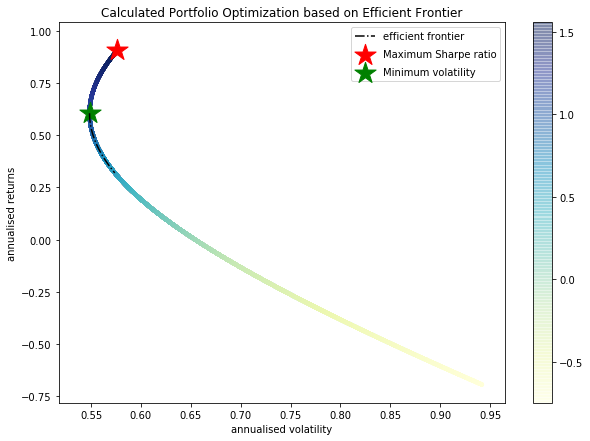

--------------------------------------------------------------------------------
Individual Stock Returns and Volatility

CMG : annuaised return 0.91 , annualised volatility: 0.58
COTY : annuaised return -0.7 , annualised volatility: 0.94
--------------------------------------------------------------------------------


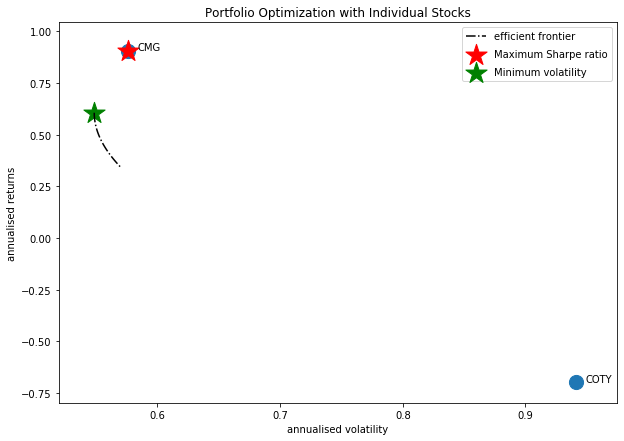

perform efficient_frontier_stock_portfolio Pairs of the companies we got ['CMG', 'APC']


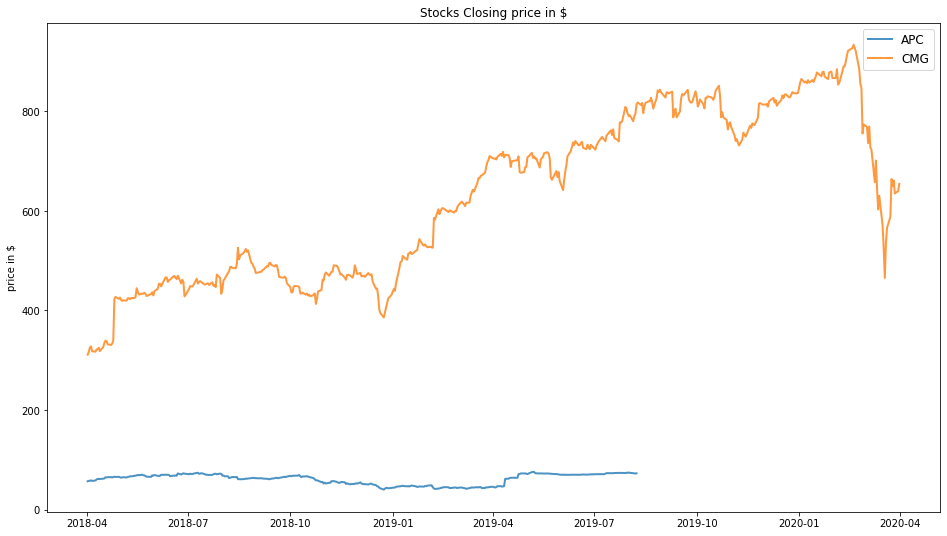

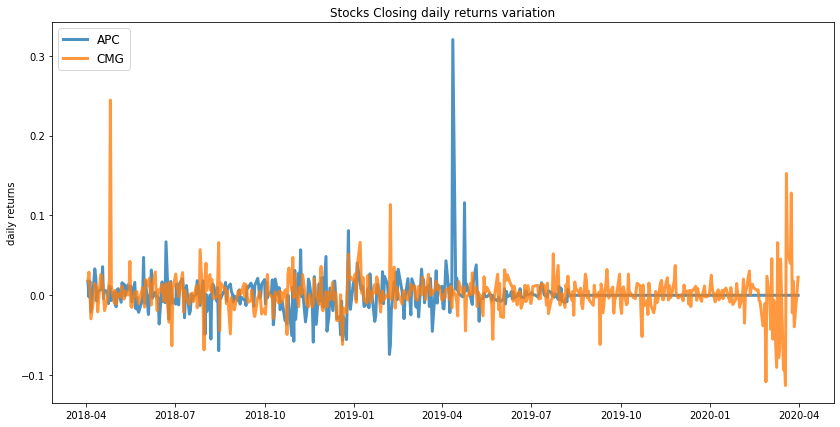

--------------------------------------------------------------------------------
Maximum Sharpe Ratio Portfolio Allocation

Annualised Return: 0.73
Annualised Volatility: 0.43


              APC    CMG
allocation  31.82  68.18
--------------------------------------------------------------------------------
Minimum Volatility Portfolio Allocation

Annualised Return: 0.59
Annualised Volatility: 0.39


              APC    CMG
allocation  58.02  41.98


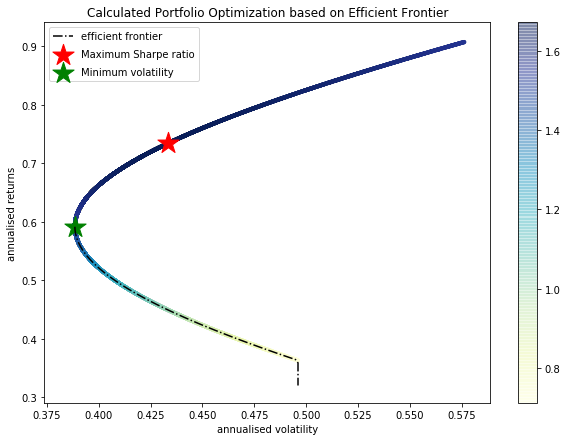

--------------------------------------------------------------------------------
Individual Stock Returns and Volatility

APC : annuaised return 0.36 , annualised volatility: 0.5
CMG : annuaised return 0.91 , annualised volatility: 0.58
--------------------------------------------------------------------------------


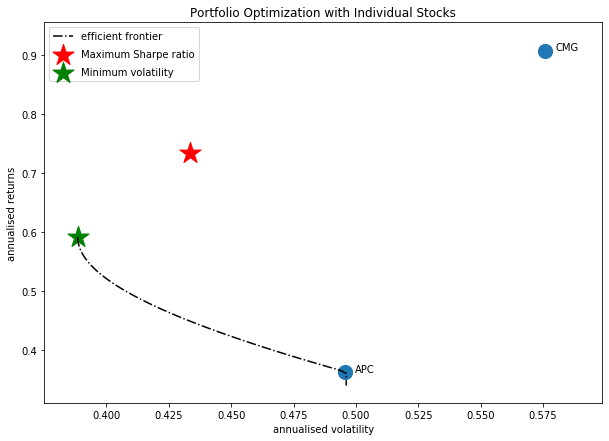

perform efficient_frontier_stock_portfolio Pairs of the companies we got ['DHI', 'CMG']


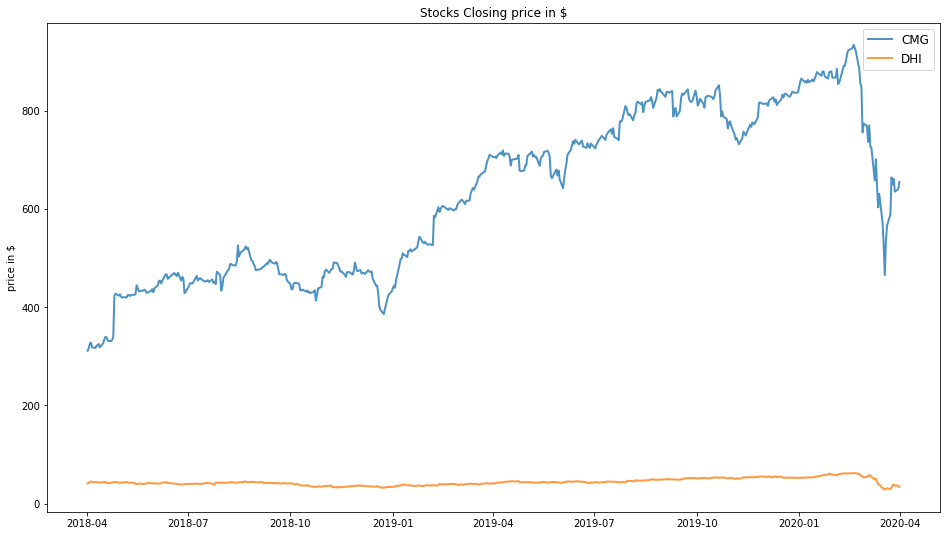

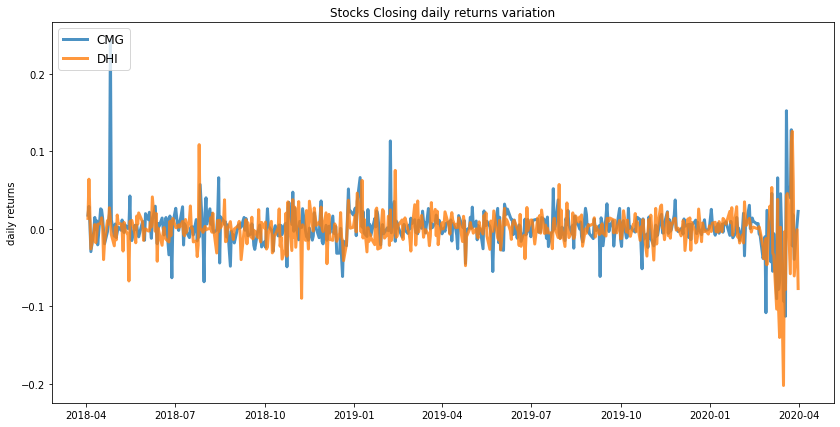

--------------------------------------------------------------------------------
Maximum Sharpe Ratio Portfolio Allocation

Annualised Return: 0.91
Annualised Volatility: 0.58


              CMG  DHI
allocation  100.0  0.0
--------------------------------------------------------------------------------
Minimum Volatility Portfolio Allocation

Annualised Return: 0.41
Annualised Volatility: 0.47


              CMG    DHI
allocation  47.02  52.98


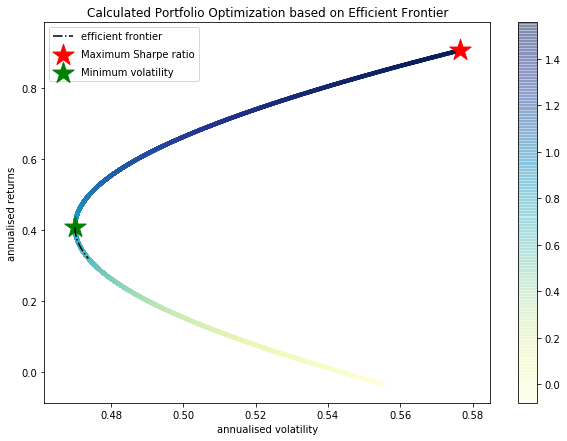

--------------------------------------------------------------------------------
Individual Stock Returns and Volatility

CMG : annuaised return 0.91 , annualised volatility: 0.58
DHI : annuaised return -0.03 , annualised volatility: 0.55
--------------------------------------------------------------------------------


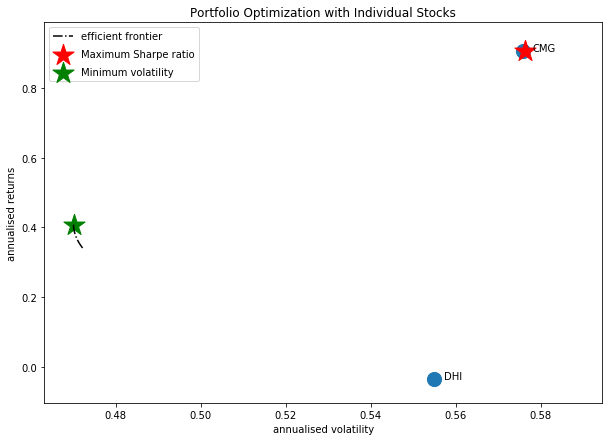

perform efficient_frontier_stock_portfolio Pairs of the companies we got ['DVN', 'CMG']


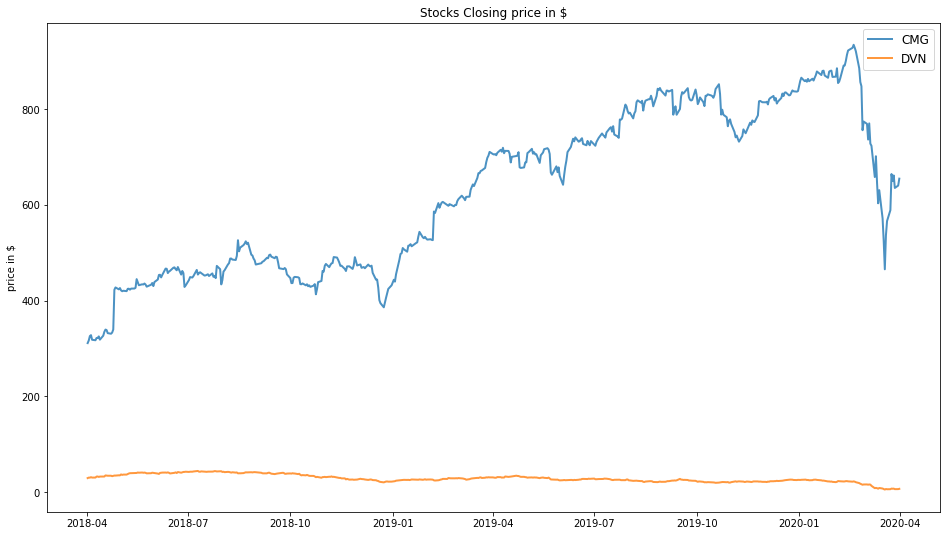

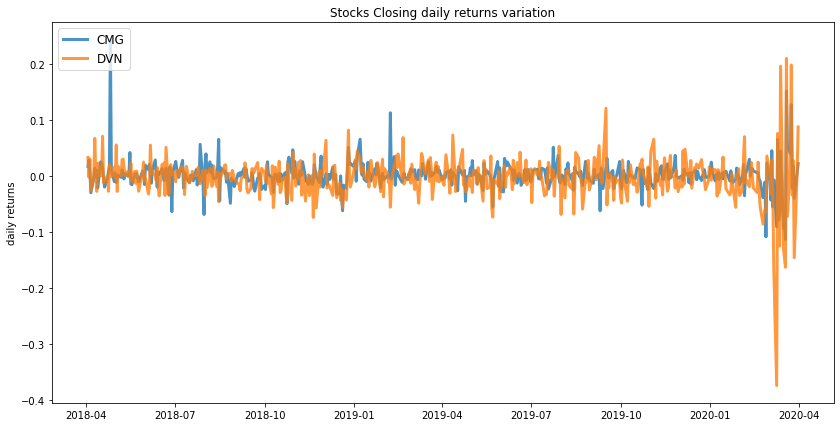

--------------------------------------------------------------------------------
Maximum Sharpe Ratio Portfolio Allocation

Annualised Return: 0.91
Annualised Volatility: 0.58


              CMG  DVN
allocation  100.0  0.0
--------------------------------------------------------------------------------
Minimum Volatility Portfolio Allocation

Annualised Return: 0.57
Annualised Volatility: 0.56


              CMG    DVN
allocation  82.52  17.48


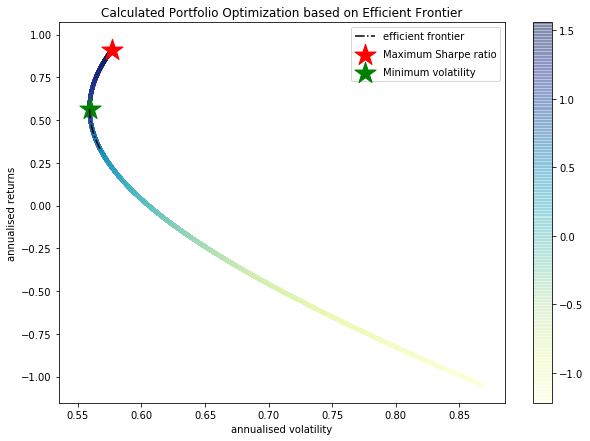

--------------------------------------------------------------------------------
Individual Stock Returns and Volatility

CMG : annuaised return 0.91 , annualised volatility: 0.58
DVN : annuaised return -1.05 , annualised volatility: 0.87
--------------------------------------------------------------------------------


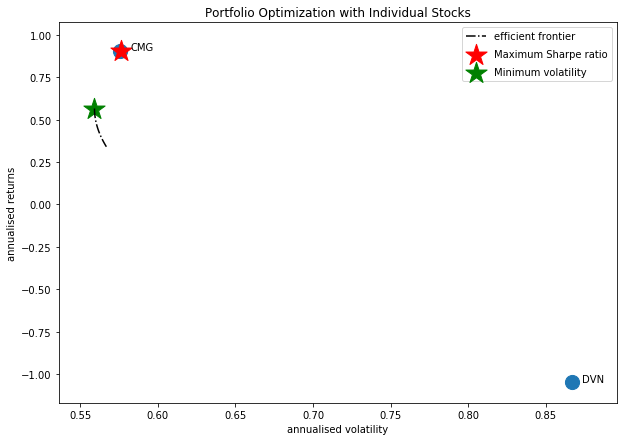

perform efficient_frontier_stock_portfolio Pairs of the companies we got ['BKNG', 'SHW', 'BLK', 'BDX', 'NEM', 'CSX']


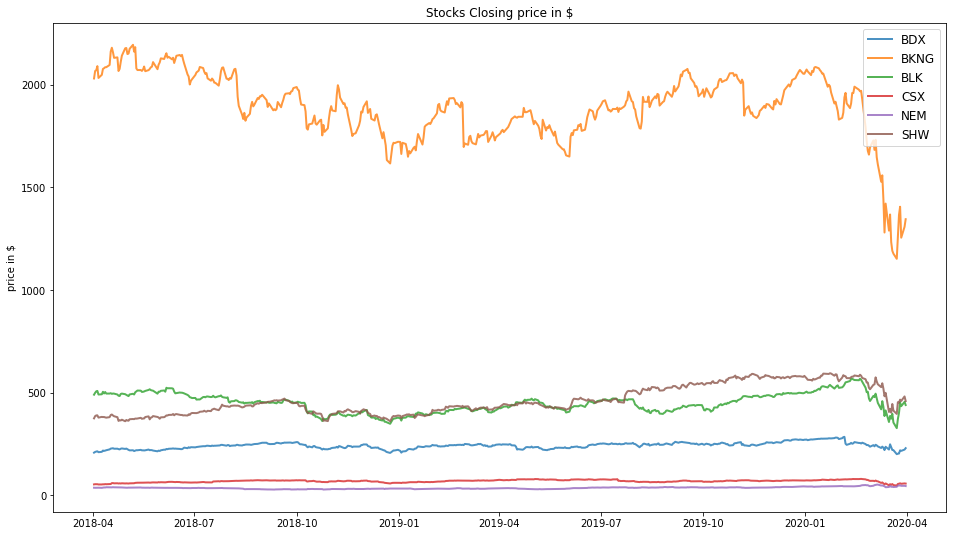

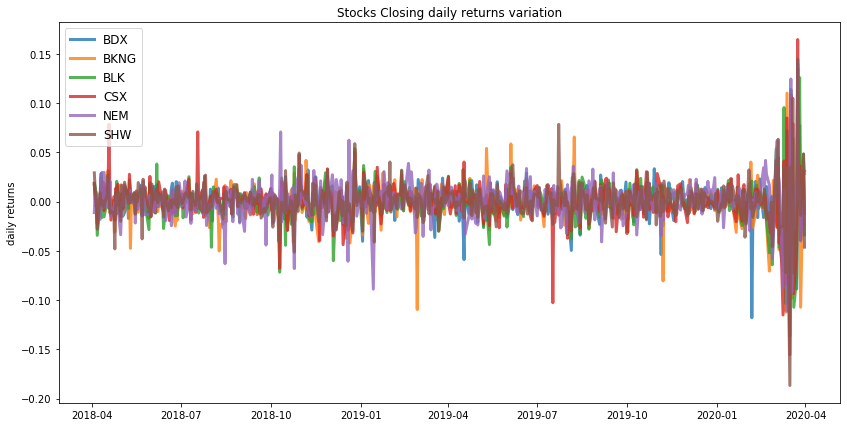

--------------------------------------------------------------------------------
Maximum Sharpe Ratio Portfolio Allocation

Annualised Return: 0.28
Annualised Volatility: 0.32


              BDX  BKNG  BLK  CSX    NEM    SHW
allocation  16.36   0.0  0.0  0.0  42.81  40.83
--------------------------------------------------------------------------------
Minimum Volatility Portfolio Allocation

Annualised Return: 0.17
Annualised Volatility: 0.3


              BDX   BKNG  BLK   CSX    NEM    SHW
allocation  38.58  13.31  0.0  0.36  32.55  15.21


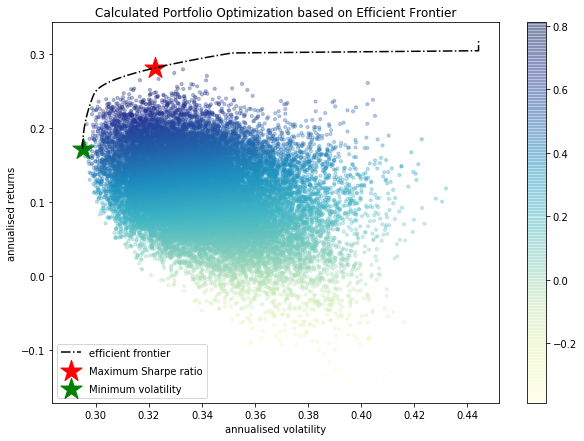

--------------------------------------------------------------------------------
Individual Stock Returns and Volatility

BDX : annuaised return 0.17 , annualised volatility: 0.38
BKNG : annuaised return -0.3 , annualised volatility: 0.47
BLK : annuaised return 0.01 , annualised volatility: 0.49
CSX : annuaised return 0.19 , annualised volatility: 0.48
NEM : annuaised return 0.3 , annualised volatility: 0.46
SHW : annuaised return 0.3 , annualised volatility: 0.44
--------------------------------------------------------------------------------


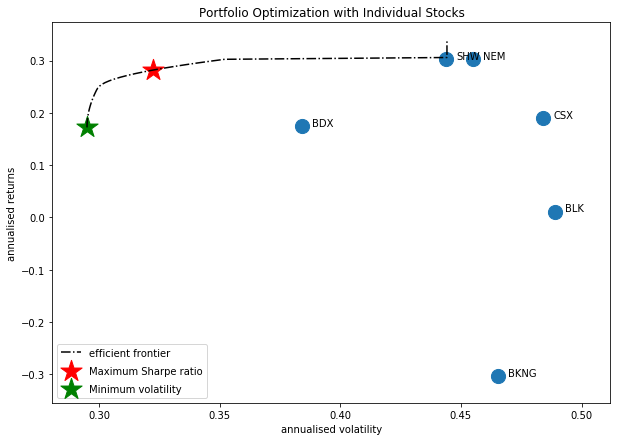

perform efficient_frontier_stock_portfolio Pairs of the companies we got ['BKNG', 'SHW', 'BLK', 'ADSK', 'NEM', 'CSX']


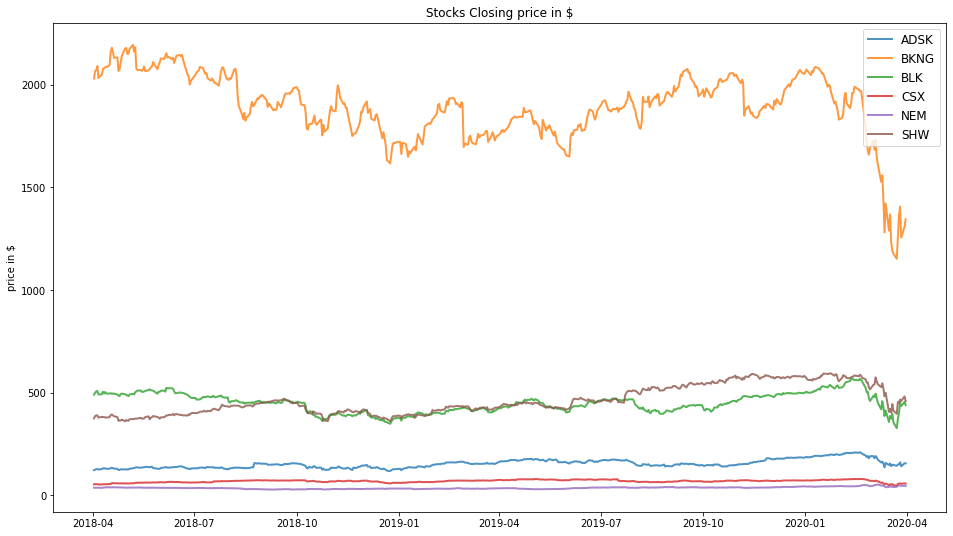

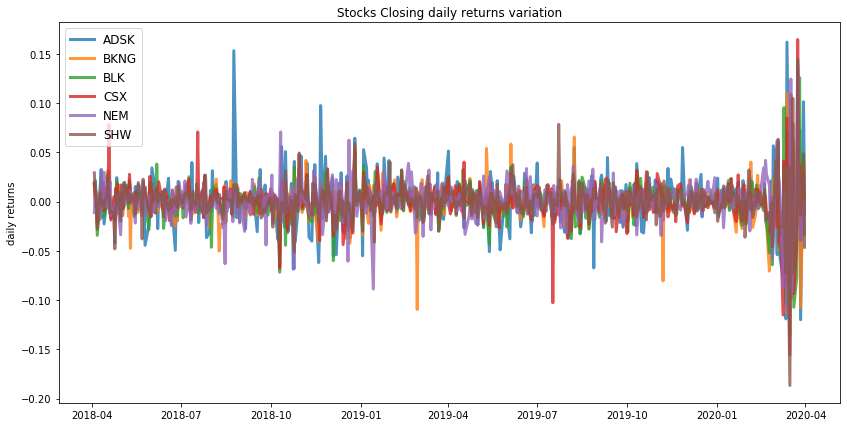

--------------------------------------------------------------------------------
Maximum Sharpe Ratio Portfolio Allocation

Annualised Return: 0.34
Annualised Volatility: 0.35


             ADSK  BKNG  BLK  CSX    NEM    SHW
allocation  31.98   0.0  0.0  0.0  43.11  24.92
--------------------------------------------------------------------------------
Minimum Volatility Portfolio Allocation

Annualised Return: 0.15
Annualised Volatility: 0.32


            ADSK   BKNG   BLK   CSX   NEM    SHW
allocation  5.63  25.32  0.47  4.43  40.6  23.54


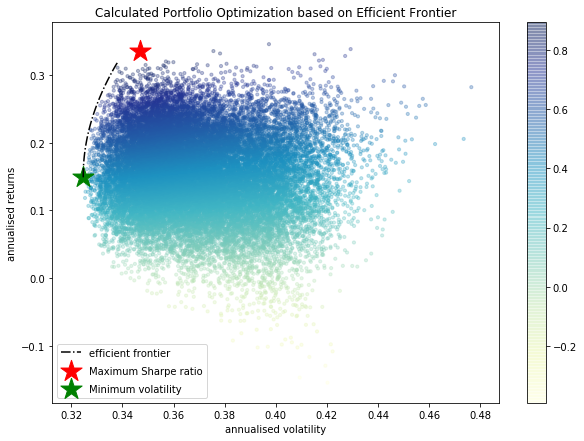

--------------------------------------------------------------------------------
Individual Stock Returns and Volatility

ADSK : annuaised return 0.41 , annualised volatility: 0.58
BKNG : annuaised return -0.3 , annualised volatility: 0.47
BLK : annuaised return 0.01 , annualised volatility: 0.49
CSX : annuaised return 0.19 , annualised volatility: 0.48
NEM : annuaised return 0.3 , annualised volatility: 0.46
SHW : annuaised return 0.3 , annualised volatility: 0.44
--------------------------------------------------------------------------------


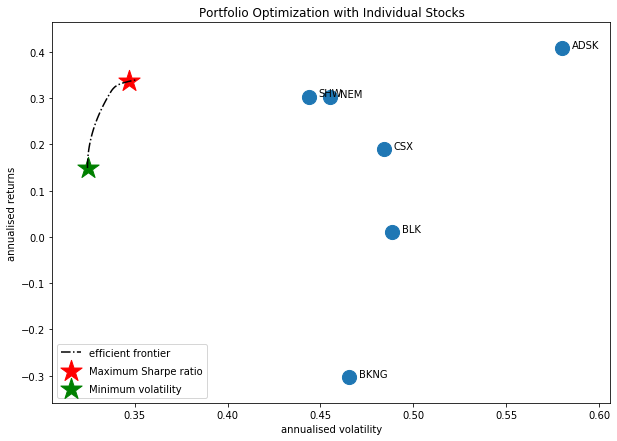

perform efficient_frontier_stock_portfolio Pairs of the companies we got ['AMD', 'BKNG']


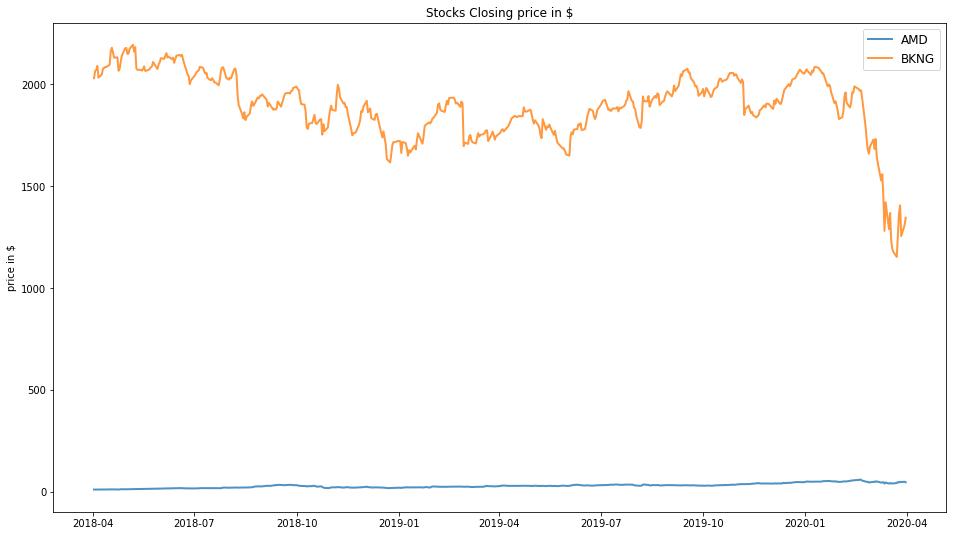

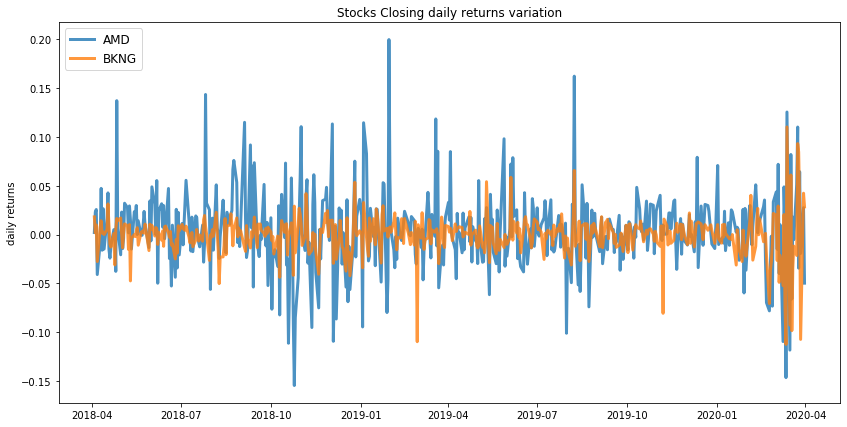

--------------------------------------------------------------------------------
Maximum Sharpe Ratio Portfolio Allocation

Annualised Return: 1.96
Annualised Volatility: 0.88


              AMD  BKNG
allocation  100.0   0.0
--------------------------------------------------------------------------------
Minimum Volatility Portfolio Allocation

Annualised Return: -0.19
Annualised Volatility: 0.46


             AMD   BKNG
allocation  5.18  94.82


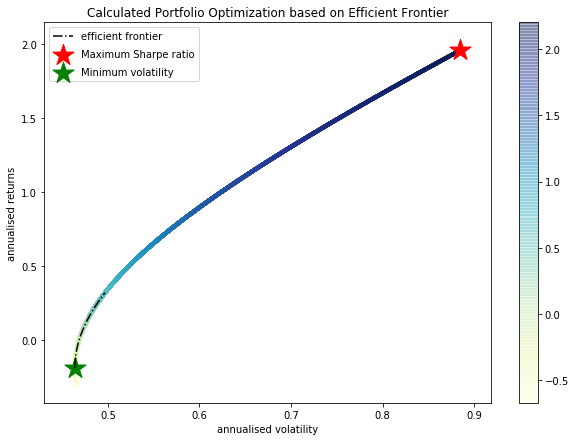

--------------------------------------------------------------------------------
Individual Stock Returns and Volatility

AMD : annuaised return 1.96 , annualised volatility: 0.88
BKNG : annuaised return -0.3 , annualised volatility: 0.47
--------------------------------------------------------------------------------


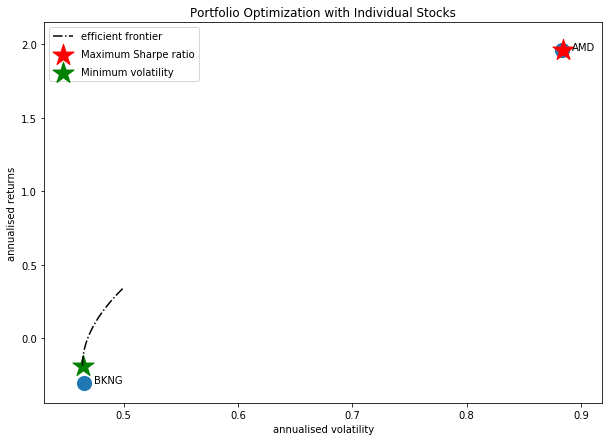

perform efficient_frontier_stock_portfolio Pairs of the companies we got ['BDX', 'NEM', 'BKNG', 'BHF']


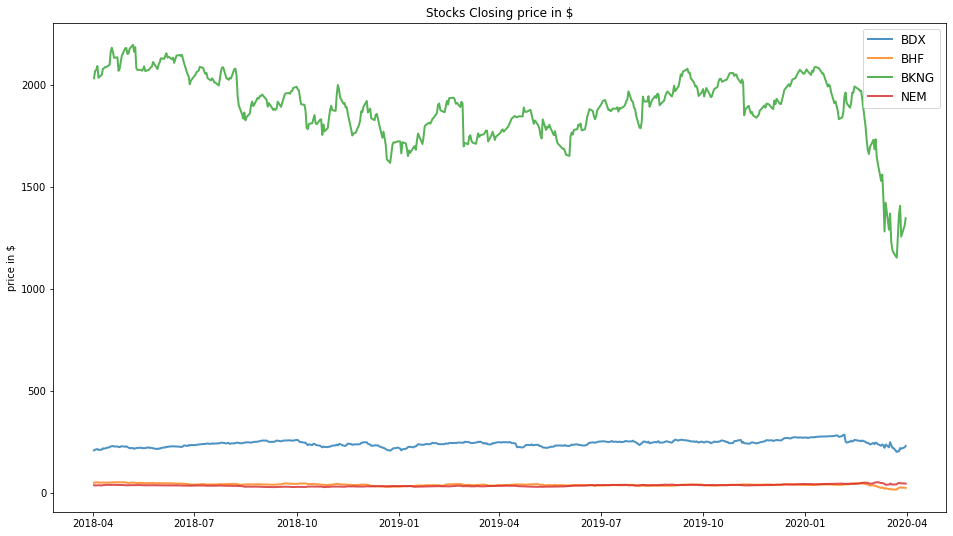

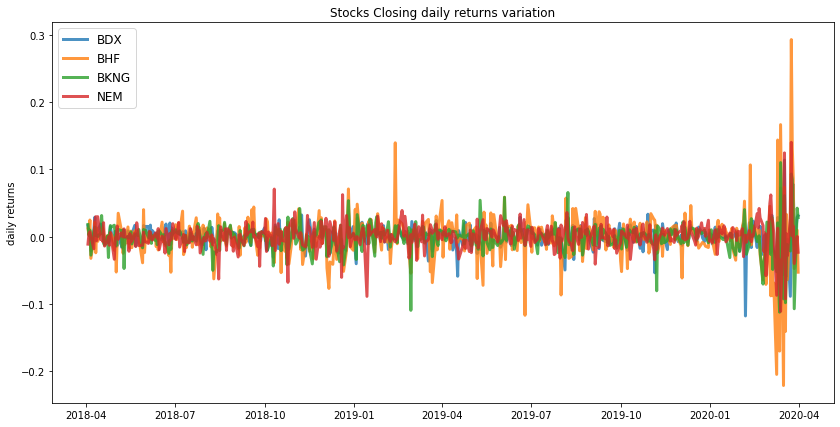

--------------------------------------------------------------------------------
Maximum Sharpe Ratio Portfolio Allocation

Annualised Return: 0.25
Annualised Volatility: 0.33


              BDX  BHF  BKNG    NEM
allocation  41.02  0.0   0.0  58.98
--------------------------------------------------------------------------------
Minimum Volatility Portfolio Allocation

Annualised Return: 0.13
Annualised Volatility: 0.3


              BDX  BHF   BKNG    NEM
allocation  44.03  0.0  19.69  36.28


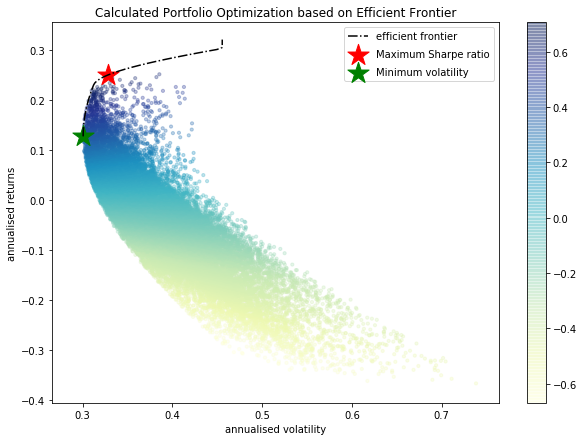

--------------------------------------------------------------------------------
Individual Stock Returns and Volatility

BDX : annuaised return 0.17 , annualised volatility: 0.38
BHF : annuaised return -0.41 , annualised volatility: 0.8
BKNG : annuaised return -0.3 , annualised volatility: 0.47
NEM : annuaised return 0.3 , annualised volatility: 0.46
--------------------------------------------------------------------------------


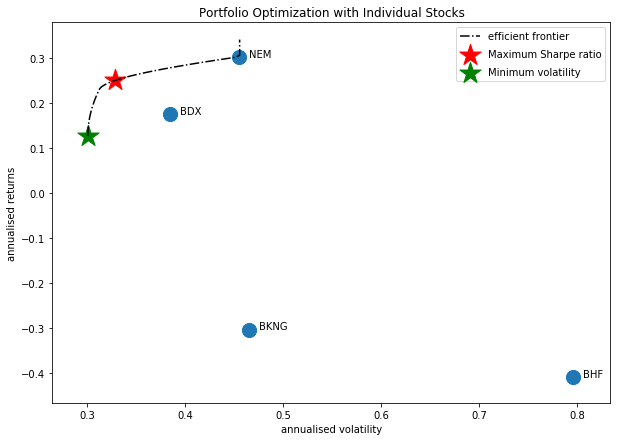

perform efficient_frontier_stock_portfolio Pairs of the companies we got ['BKNG', 'COTY']


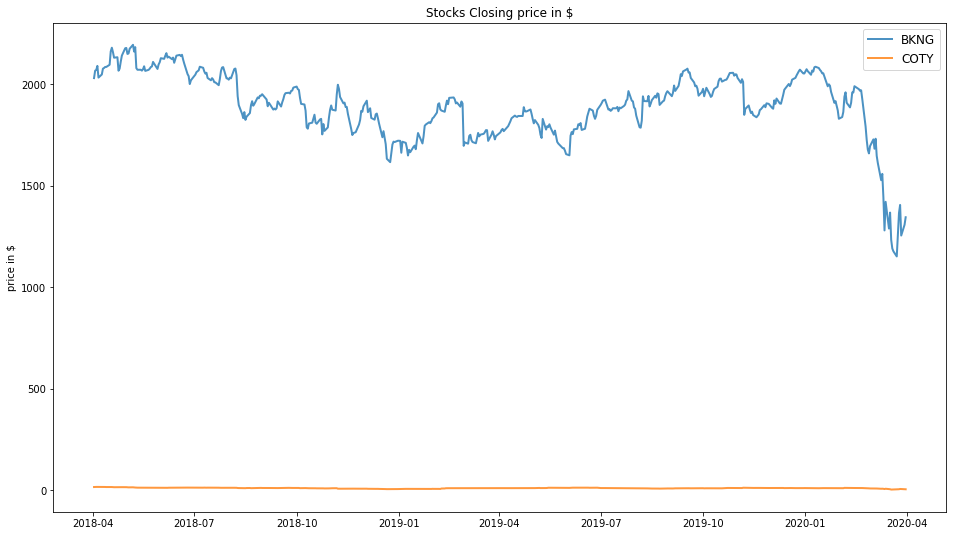

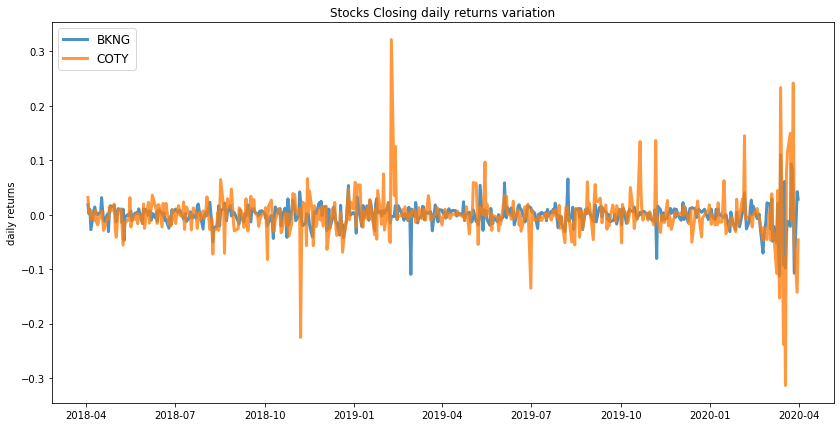

--------------------------------------------------------------------------------
Maximum Sharpe Ratio Portfolio Allocation

Annualised Return: -0.7
Annualised Volatility: 0.94


            BKNG   COTY
allocation   0.0  100.0
--------------------------------------------------------------------------------
Minimum Volatility Portfolio Allocation

Annualised Return: -0.33
Annualised Volatility: 0.46


             BKNG  COTY
allocation  92.63  7.37


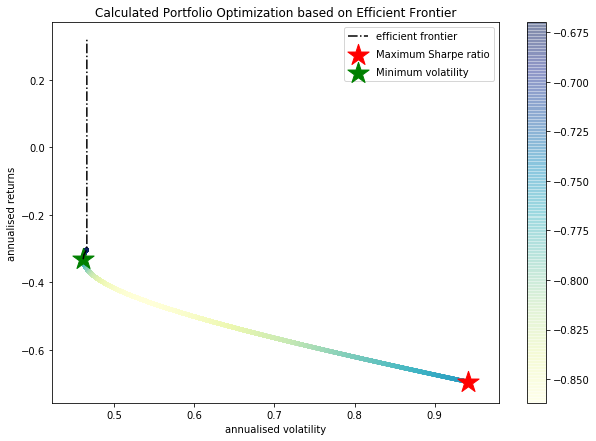

--------------------------------------------------------------------------------
Individual Stock Returns and Volatility

BKNG : annuaised return -0.3 , annualised volatility: 0.47
COTY : annuaised return -0.7 , annualised volatility: 0.94
--------------------------------------------------------------------------------


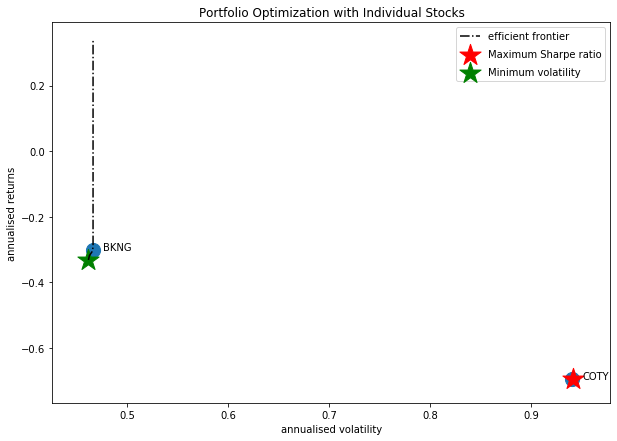

perform efficient_frontier_stock_portfolio Pairs of the companies we got ['BKNG', 'SHW', 'BLK', 'NEM', 'CSX']


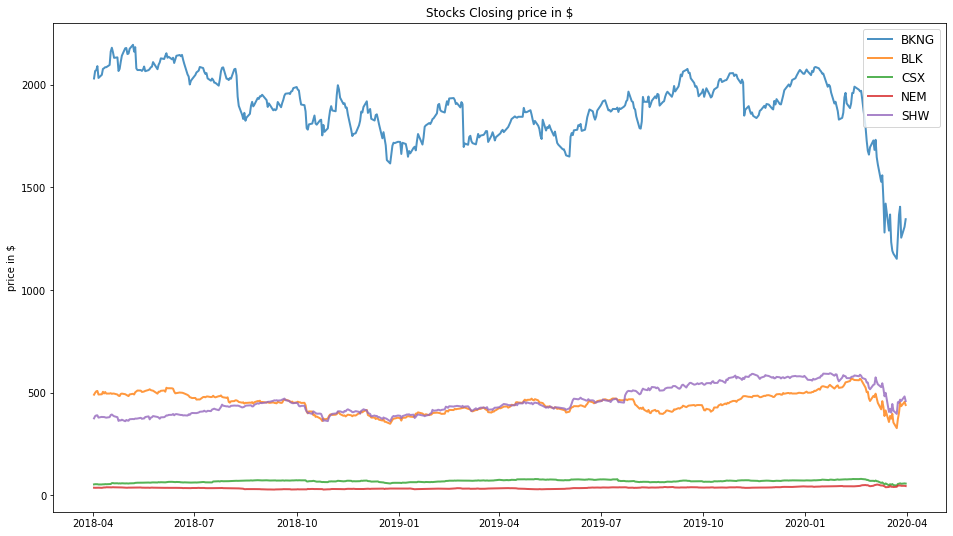

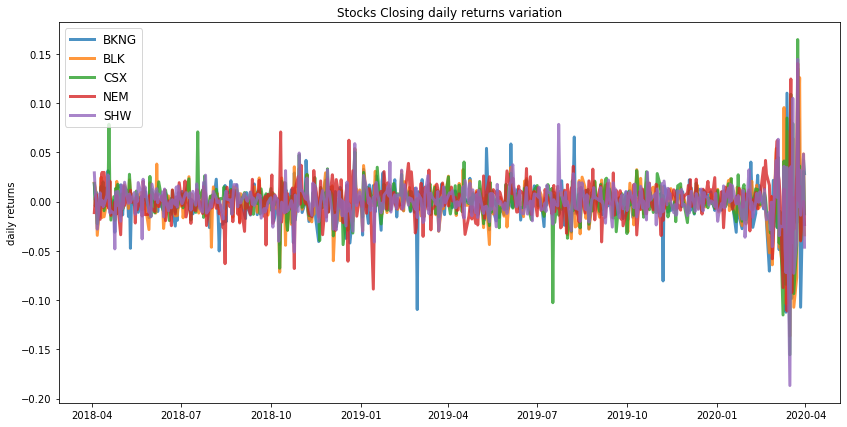

--------------------------------------------------------------------------------
Maximum Sharpe Ratio Portfolio Allocation

Annualised Return: 0.3
Annualised Volatility: 0.35


            BKNG  BLK  CSX    NEM    SHW
allocation   0.0  0.0  0.0  48.16  51.84
--------------------------------------------------------------------------------
Minimum Volatility Portfolio Allocation

Annualised Return: 0.12
Annualised Volatility: 0.33


             BKNG  BLK   CSX    NEM   SHW
allocation  27.89  2.1  5.35  40.46  24.2


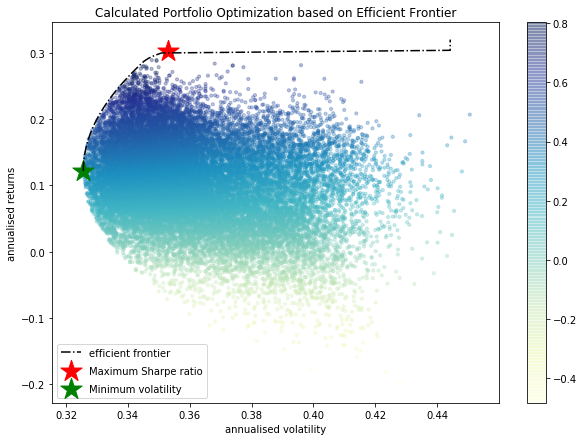

--------------------------------------------------------------------------------
Individual Stock Returns and Volatility

BKNG : annuaised return -0.3 , annualised volatility: 0.47
BLK : annuaised return 0.01 , annualised volatility: 0.49
CSX : annuaised return 0.19 , annualised volatility: 0.48
NEM : annuaised return 0.3 , annualised volatility: 0.46
SHW : annuaised return 0.3 , annualised volatility: 0.44
--------------------------------------------------------------------------------


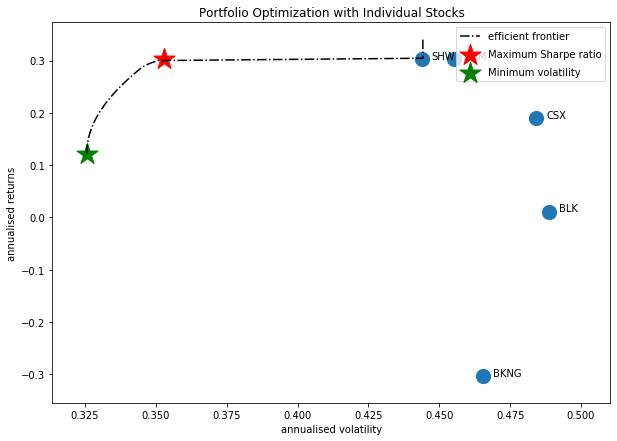

perform efficient_frontier_stock_portfolio Pairs of the companies we got ['DHI', 'BKNG']


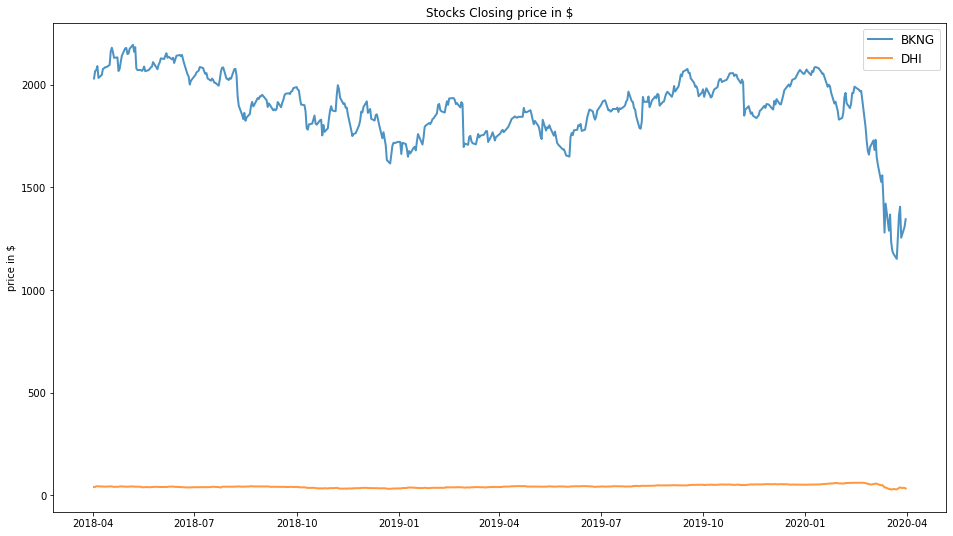

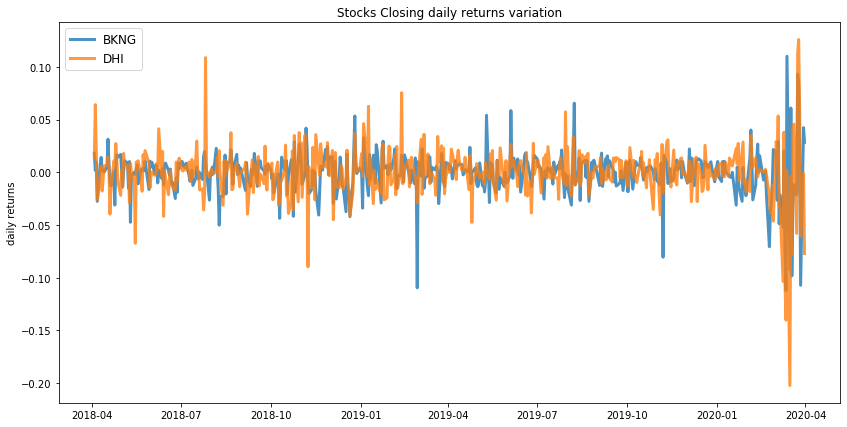

--------------------------------------------------------------------------------
Maximum Sharpe Ratio Portfolio Allocation

Annualised Return: -0.03
Annualised Volatility: 0.56


            BKNG    DHI
allocation   0.0  100.0
--------------------------------------------------------------------------------
Minimum Volatility Portfolio Allocation

Annualised Return: -0.21
Annualised Volatility: 0.43


             BKNG    DHI
allocation  66.27  33.73


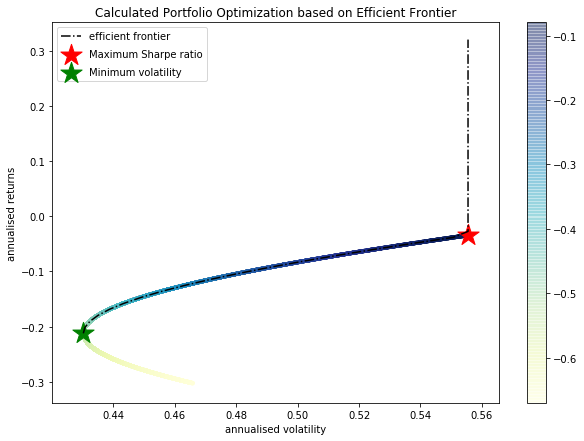

--------------------------------------------------------------------------------
Individual Stock Returns and Volatility

BKNG : annuaised return -0.3 , annualised volatility: 0.47
DHI : annuaised return -0.03 , annualised volatility: 0.55
--------------------------------------------------------------------------------


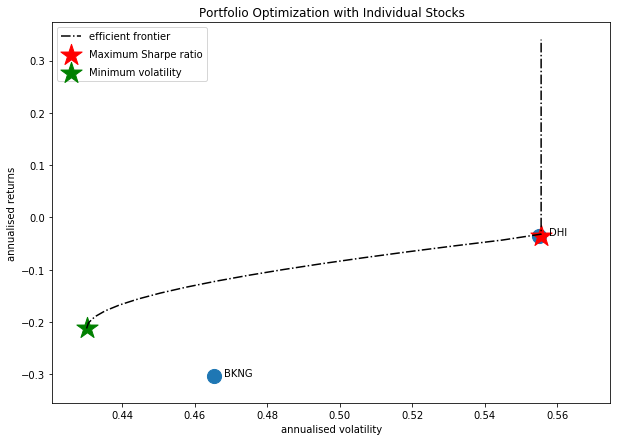

perform efficient_frontier_stock_portfolio Pairs of the companies we got ['DVN', 'BKNG']


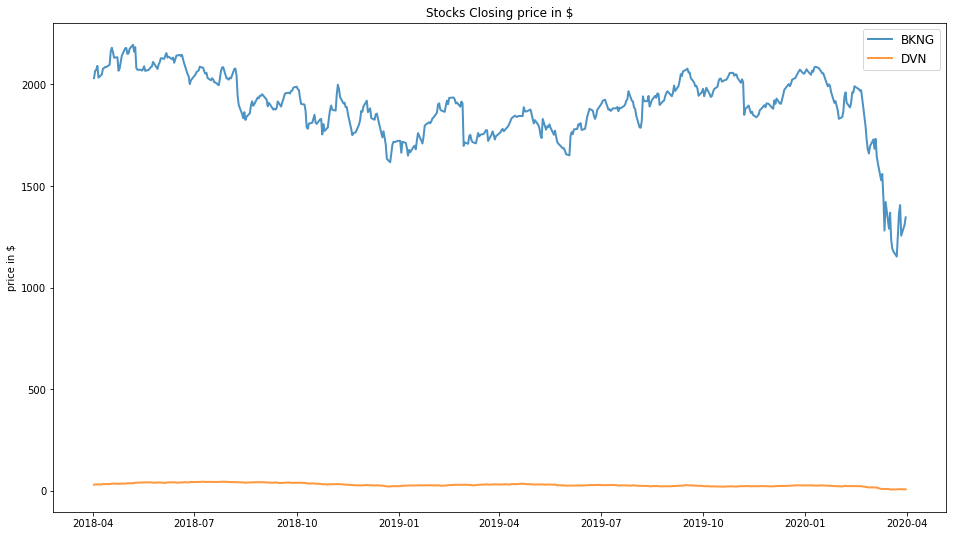

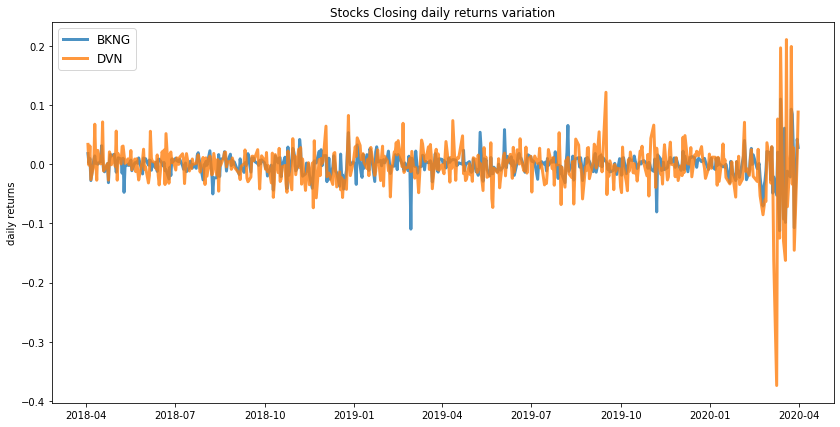

--------------------------------------------------------------------------------
Maximum Sharpe Ratio Portfolio Allocation

Annualised Return: -0.3
Annualised Volatility: 0.47


             BKNG  DVN
allocation  100.0  0.0
--------------------------------------------------------------------------------
Minimum Volatility Portfolio Allocation

Annualised Return: -0.34
Annualised Volatility: 0.46


             BKNG   DVN
allocation  95.43  4.57


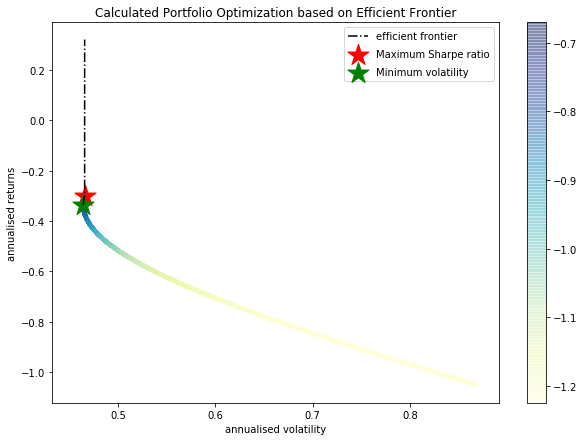

--------------------------------------------------------------------------------
Individual Stock Returns and Volatility

BKNG : annuaised return -0.3 , annualised volatility: 0.47
DVN : annuaised return -1.05 , annualised volatility: 0.87
--------------------------------------------------------------------------------


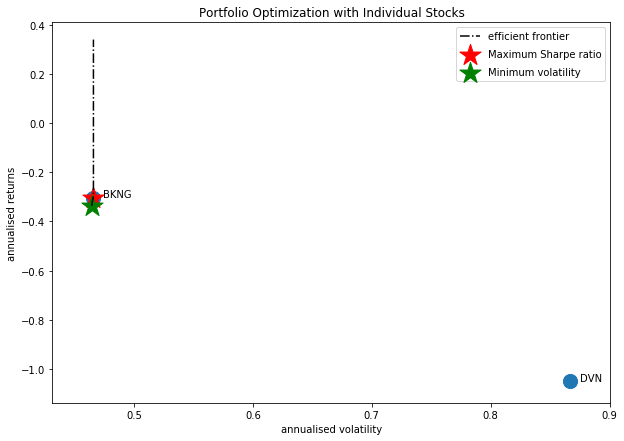

perform efficient_frontier_stock_portfolio Pairs of the companies we got ['CMG', 'BKNG', 'SHW', 'BLK', 'BDX', 'BHF', 'NEM']


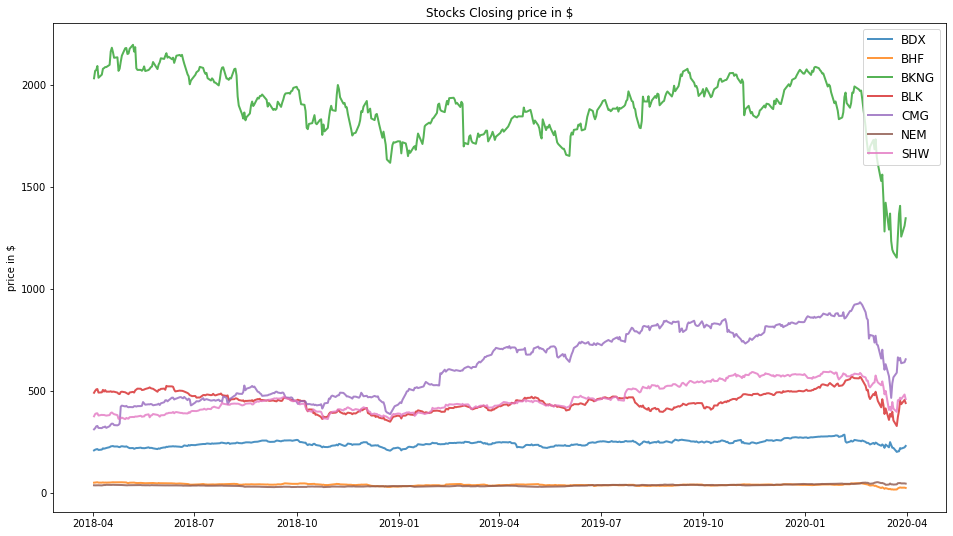

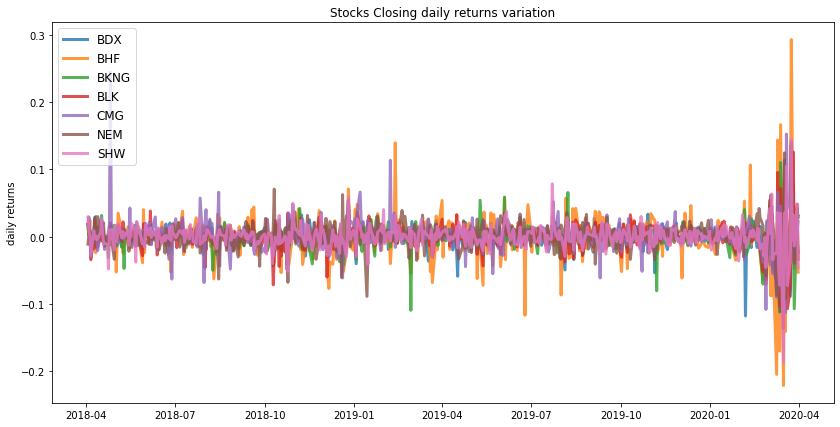

--------------------------------------------------------------------------------
Maximum Sharpe Ratio Portfolio Allocation

Annualised Return: 0.69
Annualised Volatility: 0.42


             BDX  BHF  BKNG  BLK   CMG    NEM  SHW
allocation  6.17  0.0   0.0  0.0  66.2  27.63  0.0
--------------------------------------------------------------------------------
Minimum Volatility Portfolio Allocation

Annualised Return: 0.27
Annualised Volatility: 0.29


              BDX  BHF  BKNG  BLK    CMG   NEM   SHW
allocation  37.37  0.0  9.43  0.0  12.62  30.8  9.78


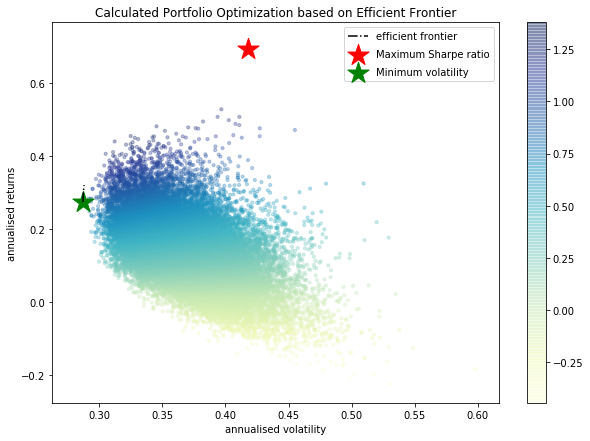

--------------------------------------------------------------------------------
Individual Stock Returns and Volatility

BDX : annuaised return 0.17 , annualised volatility: 0.38
BHF : annuaised return -0.41 , annualised volatility: 0.8
BKNG : annuaised return -0.3 , annualised volatility: 0.47
BLK : annuaised return 0.01 , annualised volatility: 0.49
CMG : annuaised return 0.91 , annualised volatility: 0.58
NEM : annuaised return 0.3 , annualised volatility: 0.46
SHW : annuaised return 0.3 , annualised volatility: 0.44
--------------------------------------------------------------------------------


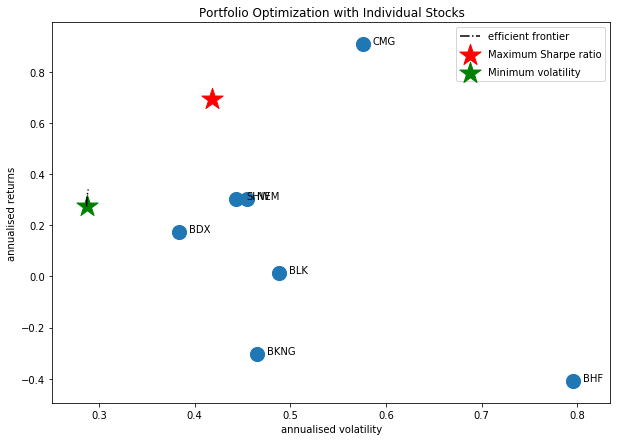

perform efficient_frontier_stock_portfolio Pairs of the companies we got ['CMG', 'BKNG', 'SHW', 'BLK', 'BDX', 'NEM']


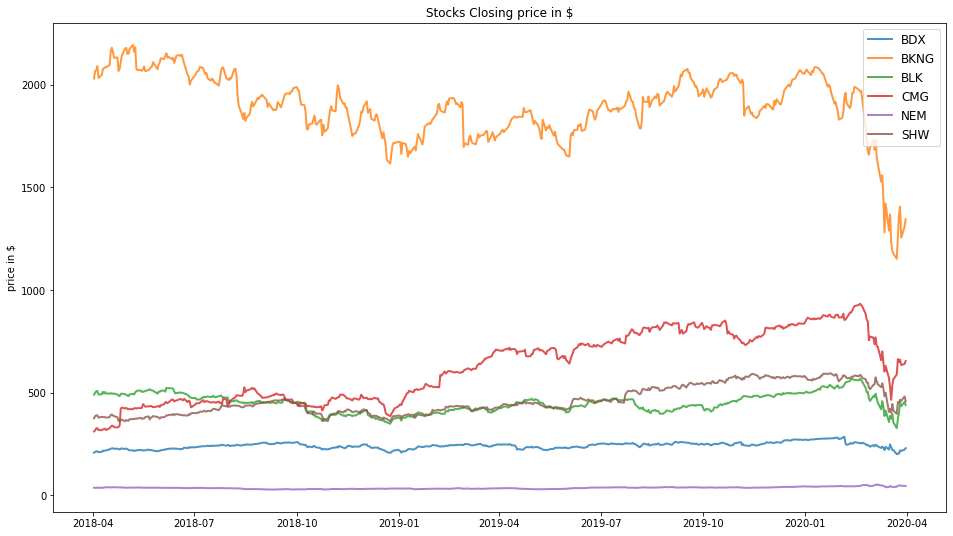

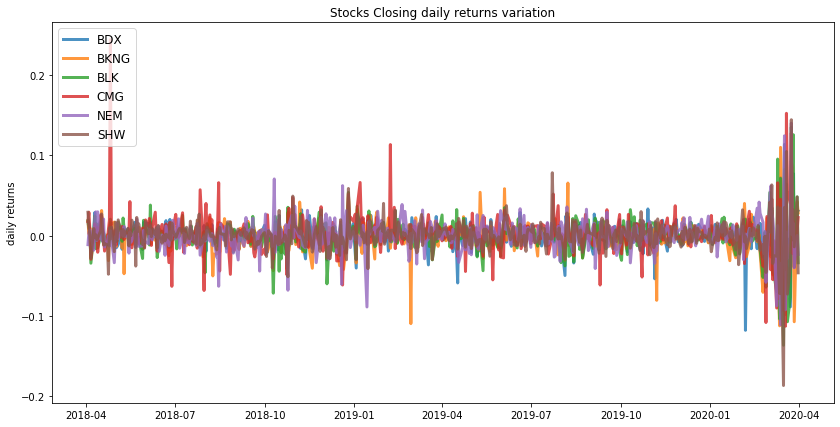

--------------------------------------------------------------------------------
Maximum Sharpe Ratio Portfolio Allocation

Annualised Return: 0.69
Annualised Volatility: 0.42


             BDX  BKNG  BLK   CMG    NEM  SHW
allocation  6.18   0.0  0.0  66.2  27.62  0.0
--------------------------------------------------------------------------------
Minimum Volatility Portfolio Allocation

Annualised Return: 0.27
Annualised Volatility: 0.29


              BDX  BKNG  BLK    CMG    NEM   SHW
allocation  37.39  9.42  0.0  12.61  30.81  9.77


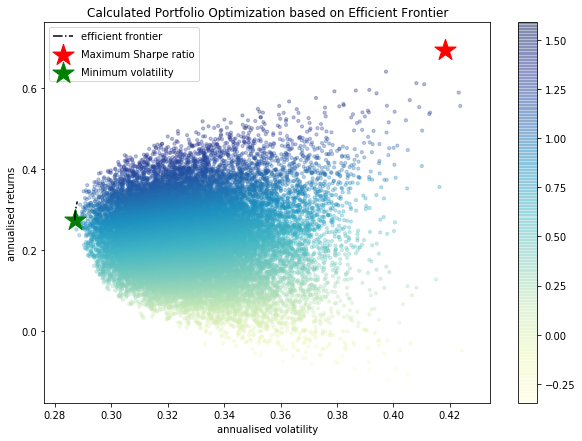

--------------------------------------------------------------------------------
Individual Stock Returns and Volatility

BDX : annuaised return 0.17 , annualised volatility: 0.38
BKNG : annuaised return -0.3 , annualised volatility: 0.47
BLK : annuaised return 0.01 , annualised volatility: 0.49
CMG : annuaised return 0.91 , annualised volatility: 0.58
NEM : annuaised return 0.3 , annualised volatility: 0.46
SHW : annuaised return 0.3 , annualised volatility: 0.44
--------------------------------------------------------------------------------


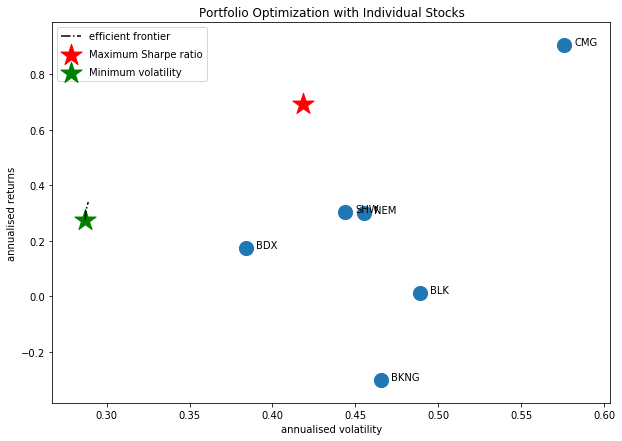

perform efficient_frontier_stock_portfolio Pairs of the companies we got ['BKNG', 'SHW', 'BLK', 'BDX', 'ADSK', 'NEM']


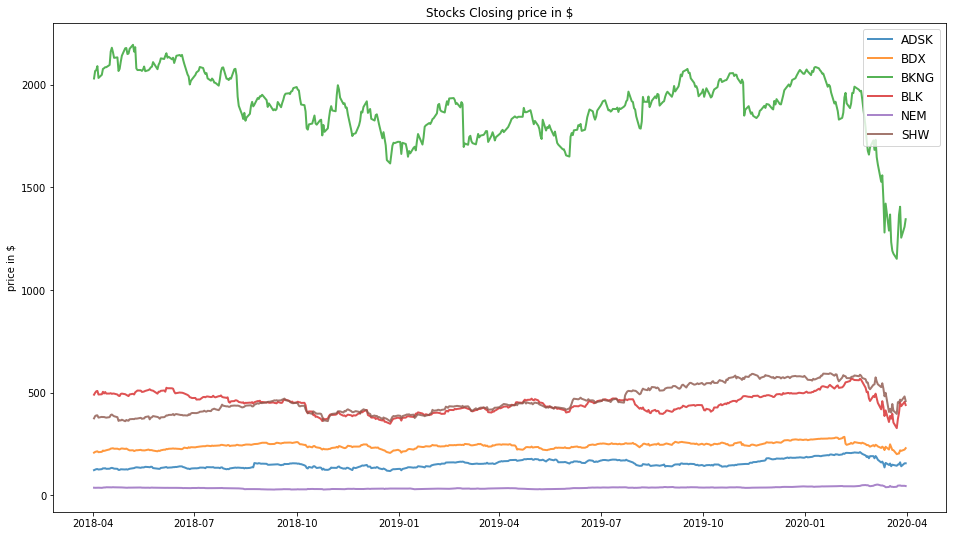

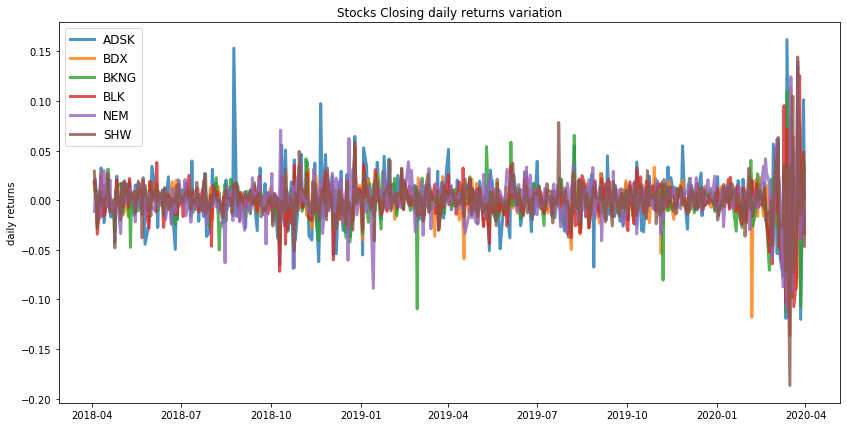

--------------------------------------------------------------------------------
Maximum Sharpe Ratio Portfolio Allocation

Annualised Return: 0.34
Annualised Volatility: 0.35


             ADSK  BDX  BKNG  BLK   NEM    SHW
allocation  31.93  0.0   0.0  0.0  43.1  24.96
--------------------------------------------------------------------------------
Minimum Volatility Portfolio Allocation

Annualised Return: 0.17
Annualised Volatility: 0.3


            ADSK    BDX   BKNG  BLK    NEM    SHW
allocation   0.0  38.58  13.45  0.0  32.55  15.42


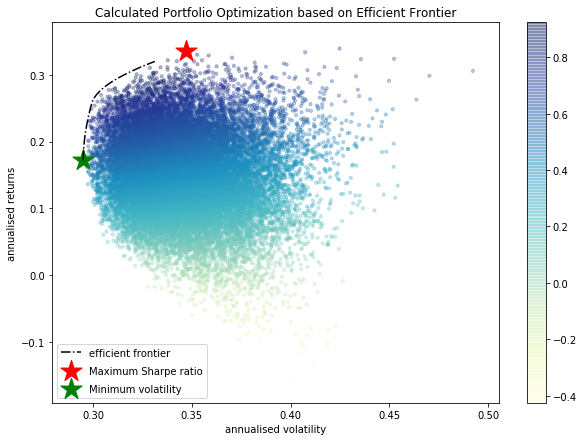

--------------------------------------------------------------------------------
Individual Stock Returns and Volatility

ADSK : annuaised return 0.41 , annualised volatility: 0.58
BDX : annuaised return 0.17 , annualised volatility: 0.38
BKNG : annuaised return -0.3 , annualised volatility: 0.47
BLK : annuaised return 0.01 , annualised volatility: 0.49
NEM : annuaised return 0.3 , annualised volatility: 0.46
SHW : annuaised return 0.3 , annualised volatility: 0.44
--------------------------------------------------------------------------------


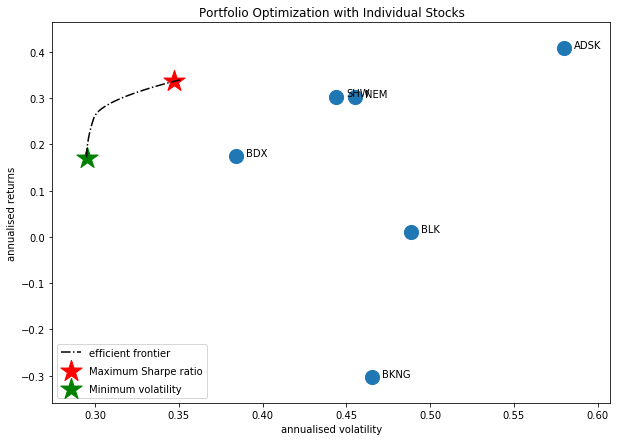

In [28]:
returns_sharpe_company_list = []
start_date = "2018-04-01"
end_date = "2020-04-01"
risk_free_rate = 0.0095
#generate the stocks pairs which are uncorrelated and having covariance less than mean covariance 
stocks_pair = get_portfolio_pairs(portfolio_list)
#print(stocks_pair)
for stock_list in stocks_pair:
    print("perform efficient_frontier_stock_portfolio Pairs of the companies we got {}".format(stock_list))
    pos_sharpe, Annualised_Return, Annualised_Volatility, allocation_weights = efficient_frontier_stock_portfolio(stock_list, len(stock_list), risk_free_rate, start_date, end_date)
    returns_sharpe_company_list.append([pos_sharpe, Annualised_Return, Annualised_Volatility, stock_list, allocation_weights])

In [31]:
returns_sharpe_company_list

[[1.292807235695624, 0.56, 0.42, ['EQIX', 'SHW'], array([[100.,   0.]])],
 [1.292807235695624, 0.56, 0.42, ['EQIX', 'DHI'], array([[  0., 100.]])],
 [1.292807235695624, 0.56, 0.42, ['EQIX', 'GOOG'], array([[100.,   0.]])],
 [1.6923931806815173,
  0.65,
  0.38,
  ['AMZN', 'CMG', 'BDX', 'BHF', 'NEM'],
  array([[22.98,  0.  ,  0.  , 52.44, 24.58]])],
 [1.1468481488665245,
  0.4,
  0.34,
  ['AMZN', 'BKNG', 'BDX', 'BHF', 'NEM'],
  array([[61.51,  0.  ,  0.  ,  0.  , 38.49]])],
 [1.6923933772100361,
  0.65,
  0.38,
  ['AMZN', 'CMG', 'BKNG', 'SHW', 'BLK', 'BDX', 'NEM'],
  array([[23.02,  0.  ,  0.  ,  0.  , 52.43, 24.56,  0.  ]])],
 [0.9801888420259175, 0.46, 0.46, ['AMZN', 'GOOG'], array([[100.,   0.]])],
 [1.638697998434976,
  0.69,
  0.42,
  ['CMG', 'SHW', 'BLK', 'BDX', 'NEM'],
  array([[ 6.19,  0.  , 66.19, 27.62,  0.  ]])],
 [1.6386979982580367,
  0.69,
  0.42,
  ['BDX', 'CMG', 'BHF', 'NEM'],
  array([[ 6.19,  0.  , 66.19, 27.62]])],
 [1.5573627954237146, 0.91, 0.58, ['CMG', 'COTY'], arr

In [32]:
shortlisted_portfolio_df = pd.DataFrame(returns_sharpe_company_list)

In [33]:
shortlisted_portfolio_df.columns = ["Sharpe Ratio", "Portfolio Annualised Return", "Portfolio Annualised_Volatility", "Stock Portfolio", "Stocks Weight Allocation"]

In [34]:
shortlisted_portfolio_df

,Sharpe Ratio,Portfolio Annualised Return,Portfolio Annualised_Volatility,Stock Portfolio,Stocks Weight Allocation
0,1.292807,0.56,0.42,"[EQIX, SHW]","[[100.0, 0.0]]"
1,1.292807,0.56,0.42,"[EQIX, DHI]","[[0.0, 100.0]]"
2,1.292807,0.56,0.42,"[EQIX, GOOG]","[[100.0, 0.0]]"
3,1.692393,0.65,0.38,"[AMZN, CMG, BDX, BHF, NEM]","[[22.98, 0.0, 0.0, 52.44, 24.58]]"
4,1.146848,0.40,0.34,"[AMZN, BKNG, BDX, BHF, NEM]","[[61.51, 0.0, 0.0, 0.0, 38.49]]"
5,1.692393,0.65,0.38,"[AMZN, CMG, BKNG, SHW, BLK, BDX, NEM]","[[23.02, 0.0, 0.0, 0.0, 52.43, 24.56, 0.0]]"
6,0.980189,0.46,0.46,"[AMZN, GOOG]","[[100.0, 0.0]]"
7,1.638698,0.69,0.42,"[CMG, SHW, BLK, BDX, NEM]","[[6.19, 0.0, 66.19, 27.62, 0.0]]"
8,1.638698,0.69,0.42,"[BDX, CMG, BHF, NEM]","[[6.19, 0.0, 66.19, 27.62]]"
9,1.557363,0.91,0.58,"[CMG, COTY]","[[100.0, 0.0]]"


In [35]:
# creating a blank series 
Portfolio_Tag = pd.Series([]) 

for row in range(len(shortlisted_portfolio_df)):
    if (shortlisted_portfolio_df["Sharpe Ratio"][row] >= 3):
        Portfolio_Tag[row] = "Excellent"
    elif (shortlisted_portfolio_df["Sharpe Ratio"][row] >= 2 and (shortlisted_portfolio_df["Sharpe Ratio"][row] < 3)):
        Portfolio_Tag[row] = "Very Good"
    elif ((shortlisted_portfolio_df["Sharpe Ratio"][row] >= 1)  and (shortlisted_portfolio_df["Sharpe Ratio"][row] < 2)):
        Portfolio_Tag[row] = "Good"
    else:
        Portfolio_Tag[row] = "Bad"
        
# inserting new column with values of list made above         
shortlisted_portfolio_df.insert(5, "Portfolio Tag", Portfolio_Tag) 

In [36]:
shortlisted_portfolio_df

,Sharpe Ratio,Portfolio Annualised Return,Portfolio Annualised_Volatility,Stock Portfolio,Stocks Weight Allocation,Portfolio Tag
0,1.292807,0.56,0.42,"[EQIX, SHW]","[[100.0, 0.0]]",Good
1,1.292807,0.56,0.42,"[EQIX, DHI]","[[0.0, 100.0]]",Good
2,1.292807,0.56,0.42,"[EQIX, GOOG]","[[100.0, 0.0]]",Good
3,1.692393,0.65,0.38,"[AMZN, CMG, BDX, BHF, NEM]","[[22.98, 0.0, 0.0, 52.44, 24.58]]",Good
4,1.146848,0.40,0.34,"[AMZN, BKNG, BDX, BHF, NEM]","[[61.51, 0.0, 0.0, 0.0, 38.49]]",Good
5,1.692393,0.65,0.38,"[AMZN, CMG, BKNG, SHW, BLK, BDX, NEM]","[[23.02, 0.0, 0.0, 0.0, 52.43, 24.56, 0.0]]",Good
6,0.980189,0.46,0.46,"[AMZN, GOOG]","[[100.0, 0.0]]",Bad
7,1.638698,0.69,0.42,"[CMG, SHW, BLK, BDX, NEM]","[[6.19, 0.0, 66.19, 27.62, 0.0]]",Good
8,1.638698,0.69,0.42,"[BDX, CMG, BHF, NEM]","[[6.19, 0.0, 66.19, 27.62]]",Good
9,1.557363,0.91,0.58,"[CMG, COTY]","[[100.0, 0.0]]",Good


In [37]:
shortlisted_portfolio = shortlisted_portfolio_df[(shortlisted_portfolio_df["Portfolio Tag"] == "Excellent") | (shortlisted_portfolio_df["Portfolio Tag"] == "Very Good") |
                                                    (shortlisted_portfolio_df["Portfolio Tag"] == "Good")]

In [38]:
shortlisted_portfolio = shortlisted_portfolio.sort_values(by="Sharpe Ratio", ascending=False)

In [39]:
shortlisted_portfolio

,Sharpe Ratio,Portfolio Annualised Return,Portfolio Annualised_Volatility,Stock Portfolio,Stocks Weight Allocation,Portfolio Tag
15,2.201053,1.96,0.88,"[AMD, BKNG]","[[100.0, 0.0]]",Very Good
5,1.692393,0.65,0.38,"[AMZN, CMG, BKNG, SHW, BLK, BDX, NEM]","[[23.02, 0.0, 0.0, 0.0, 52.43, 24.56, 0.0]]",Good
3,1.692393,0.65,0.38,"[AMZN, CMG, BDX, BHF, NEM]","[[22.98, 0.0, 0.0, 52.44, 24.58]]",Good
10,1.671638,0.73,0.43,"[CMG, APC]","[[31.82, 68.18]]",Good
7,1.638698,0.69,0.42,"[CMG, SHW, BLK, BDX, NEM]","[[6.19, 0.0, 66.19, 27.62, 0.0]]",Good
8,1.638698,0.69,0.42,"[BDX, CMG, BHF, NEM]","[[6.19, 0.0, 66.19, 27.62]]",Good
22,1.638698,0.69,0.42,"[CMG, BKNG, SHW, BLK, BDX, NEM]","[[6.18, 0.0, 0.0, 66.2, 27.62, 0.0]]",Good
21,1.638698,0.69,0.42,"[CMG, BKNG, SHW, BLK, BDX, BHF, NEM]","[[6.17, 0.0, 0.0, 0.0, 66.2, 27.63, 0.0]]",Good
11,1.557363,0.91,0.58,"[DHI, CMG]","[[100.0, 0.0]]",Good
12,1.557363,0.91,0.58,"[DVN, CMG]","[[100.0, 0.0]]",Good


## Top 5 portfolios generated for the shortlisted companies for overall 2 yr period

In [40]:
shortlisted_portfolio[:5]

,Sharpe Ratio,Portfolio Annualised Return,Portfolio Annualised_Volatility,Stock Portfolio,Stocks Weight Allocation,Portfolio Tag
15,2.201053,1.96,0.88,"[AMD, BKNG]","[[100.0, 0.0]]",Very Good
5,1.692393,0.65,0.38,"[AMZN, CMG, BKNG, SHW, BLK, BDX, NEM]","[[23.02, 0.0, 0.0, 0.0, 52.43, 24.56, 0.0]]",Good
3,1.692393,0.65,0.38,"[AMZN, CMG, BDX, BHF, NEM]","[[22.98, 0.0, 0.0, 52.44, 24.58]]",Good
10,1.671638,0.73,0.43,"[CMG, APC]","[[31.82, 68.18]]",Good
7,1.638698,0.69,0.42,"[CMG, SHW, BLK, BDX, NEM]","[[6.19, 0.0, 66.19, 27.62, 0.0]]",Good


## Min - Max reduction technique to identify the portfolio's Goodness

In [41]:
new_df = new_df.drop(["Unnamed: 0"], axis=1)
new_df_group = new_df.groupby("symbol").count().reset_index()

In [42]:
portfolio_list=new_df["symbol"]

portfolio_count = portfolio_list.value_counts()

min_occurences = min(portfolio_count)

max_occurences = max(portfolio_count)

middle = (min_occurences + max_occurences)/2

#print all the companies whose no of occurences have been higher than the (min+max)/2 no. of times.
stock_portfolio_df = new_df_group[new_df_group["start_date"] > middle]

#make the list of the companies in this portfolio.
stock_portfolio_list = list(stock_portfolio_df["symbol"])

print("Reduced portfolio list for the period of 2 years:")
print(stock_portfolio_list)

Reduced portfolio list for the period of 2 years:
['AMZN', 'AZO', 'BKNG', 'EQIX']


perform efficient_frontier_stock_portfolio Pairs of the companies we got ['AMZN', 'AZO', 'BKNG', 'EQIX']


/home/abhishek/anaconda3/anaconda/lib/python3.7/site-packages/ipykernel_launcher.py:184: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



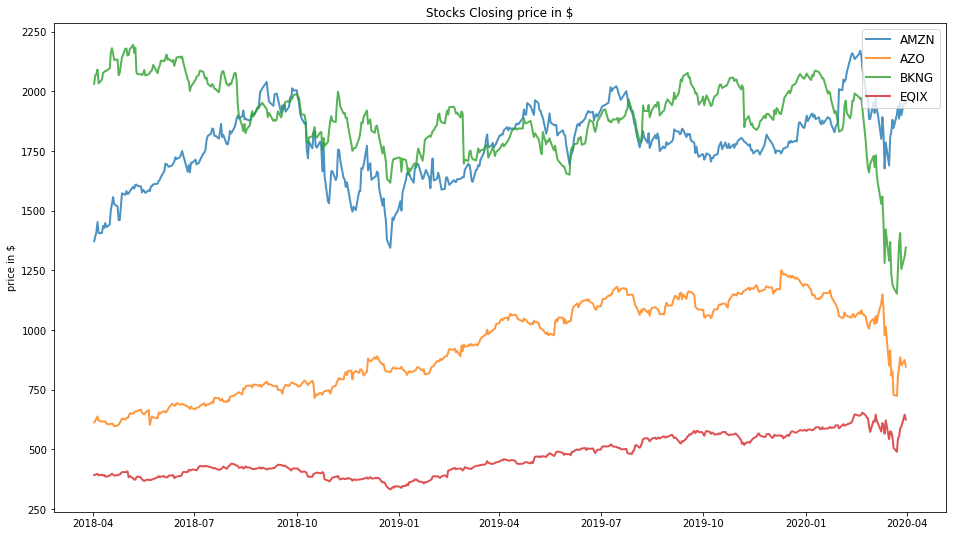

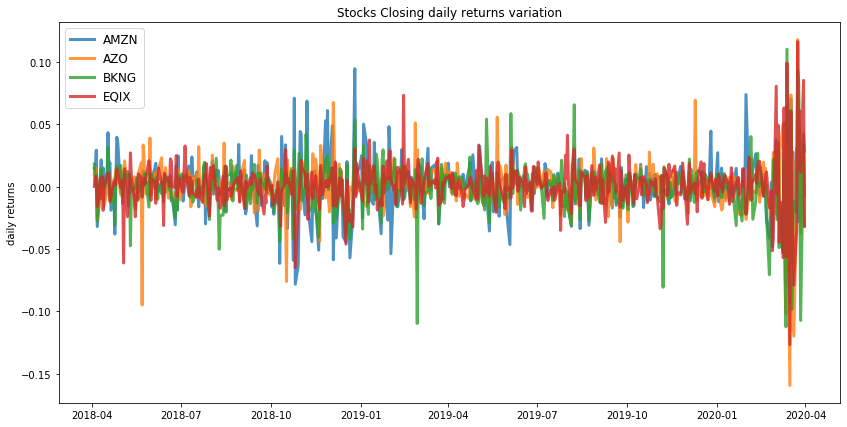

--------------------------------------------------------------------------------
Maximum Sharpe Ratio Portfolio Allocation

Annualised Return: 0.5
Annualised Volatility: 0.34


             AMZN    AZO  BKNG  EQIX
allocation  26.64  21.87   0.0  51.5
--------------------------------------------------------------------------------
Minimum Volatility Portfolio Allocation

Annualised Return: 0.38
Annualised Volatility: 0.33


             AMZN    AZO   BKNG   EQIX
allocation  27.54  29.57  12.82  30.07


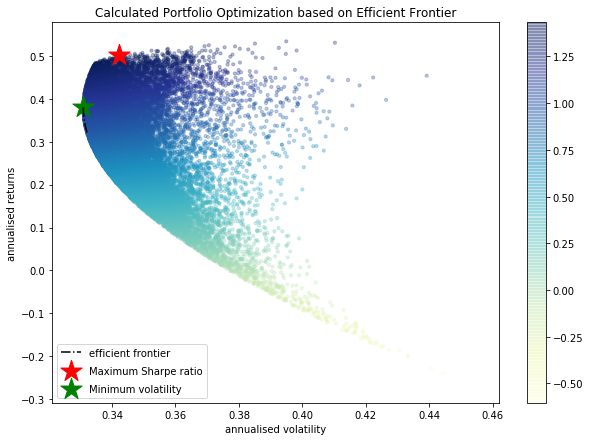

--------------------------------------------------------------------------------
Individual Stock Returns and Volatility

AMZN : annuaised return 0.46 , annualised volatility: 0.45
AZO : annuaised return 0.43 , annualised volatility: 0.45
BKNG : annuaised return -0.3 , annualised volatility: 0.47
EQIX : annuaised return 0.56 , annualised volatility: 0.42
--------------------------------------------------------------------------------


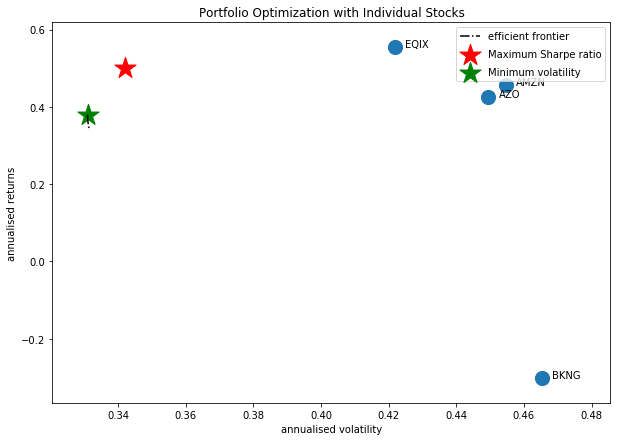

In [43]:
returns_sharpe_company_list = []
start_date = "2018-04-01"
end_date = "2020-04-01"
risk_free_rate = 0.0095
print("perform efficient_frontier_stock_portfolio Pairs of the companies we got {}".format(stock_portfolio_list))
pos_sharpe, Annualised_Return, Annualised_Volatility, allocation_weights = efficient_frontier_stock_portfolio(stock_portfolio_list, len(stock_portfolio_list), risk_free_rate, start_date, end_date)
returns_sharpe_company_list.append([pos_sharpe, Annualised_Return, Annualised_Volatility, stock_portfolio_list, allocation_weights])

In [44]:
shortlisted_portfolio_df = pd.DataFrame(returns_sharpe_company_list)

In [45]:
shortlisted_portfolio_df

,0,1,2,3,4
0,1.435329,0.5,0.34,"[AMZN, AZO, BKNG, EQIX]","[[26.64, 21.87, 0.0, 51.5]]"


In [46]:
shortlisted_portfolio_df.columns = ["Sharpe Ratio", "Portfolio Annualised Return", "Portfolio Annualised_Volatility", "Stock Portfolio", "Stocks Weight Allocation"]

In [47]:
# creating a blank series 
Portfolio_Tag = pd.Series([]) 

for row in range(len(shortlisted_portfolio_df)):
    if (shortlisted_portfolio_df["Sharpe Ratio"][row] >= 3):
        Portfolio_Tag[row] = "Excellent"
    elif (shortlisted_portfolio_df["Sharpe Ratio"][row] >= 2 and (shortlisted_portfolio_df["Sharpe Ratio"][row] < 3)):
        Portfolio_Tag[row] = "Very Good"
    elif ((shortlisted_portfolio_df["Sharpe Ratio"][row] >= 1)  and (shortlisted_portfolio_df["Sharpe Ratio"][row] < 2)):
        Portfolio_Tag[row] = "Good"
    else:
        Portfolio_Tag[row] = "Bad"
        
# inserting new column with values of list made above         
shortlisted_portfolio_df.insert(5, "Portfolio Tag", Portfolio_Tag) 

In [48]:
shortlisted_portfolio_df

,Sharpe Ratio,Portfolio Annualised Return,Portfolio Annualised_Volatility,Stock Portfolio,Stocks Weight Allocation,Portfolio Tag
0,1.435329,0.5,0.34,"[AMZN, AZO, BKNG, EQIX]","[[26.64, 21.87, 0.0, 51.5]]",Good
